<a href="https://colab.research.google.com/github/gargi95/attribution-analysis-of-XAI-methos-lstm-xai/blob/main/Deeplift_SHAP_IG_saliencymap_ECG200.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import os
import pandas as pd
from google.colab import drive
from sklearn.metrics import accuracy_score

from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import MinMaxScaler
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
#import shap
from sklearn.model_selection import train_test_split
from torch.utils.data import DataLoader, TensorDataset

import seaborn as sns
import random
from tqdm import tqdm
from sklearn.metrics import r2_score

from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [2]:
# Mount Google Drive
drive.mount('/content/drive', force_remount=True)

# Define paths
drive_folder_path = "/content/drive/MyDrive/UCR_Time_Series_2018/UCRArchive_2018"
dataset_name = "ECG200"  # Replace with the correct dataset folder name

# Verify dataset folder exists
dataset_folder = os.path.join(drive_folder_path, dataset_name)
if not os.path.exists(dataset_folder):
    raise FileNotFoundError(f"❌ Dataset folder '{dataset_name}' not found in {drive_folder_path}")

# Define file paths
train_file = os.path.join(dataset_folder, f"{dataset_name}_TRAIN.tsv")
test_file = os.path.join(dataset_folder, f"{dataset_name}_TEST.tsv")

# Verify files exist
if not os.path.exists(train_file) or not os.path.exists(test_file):
    raise FileNotFoundError(f"❌ Train/Test files not found in {dataset_folder}.")


Mounted at /content/drive


In [3]:
print("📥 Loading dataset...")
train_data = pd.read_csv(train_file, sep='\t', header=None)
test_data = pd.read_csv(test_file, sep='\t', header=None)
print(train_data)
# Extract features and labels
y_train = train_data.iloc[:, 0].values
X_train = train_data.iloc[:, 1:].values
y_test = test_data.iloc[:, 0].values
X_test = test_data.iloc[:, 1:].values
#updadting the labels of the dataset (Normal and Abnorbal Heartbeat)



#label_mapping = {1: 0, 2: 1}
# Original labels in ECG200: 1 (Normal), -1 (Abnormal / MI)
label_mapping = {1: 0, -1: 1}  # Normal → 0, Infarction → 1
y_train = np.array([label_mapping[label] for label in y_train])
y_test = np.array([label_mapping[label] for label in y_test])

# Normalize the data
scaler = MinMaxScaler(feature_range=(0, 1))
X_train = np.array([scaler.fit_transform(x.reshape(-1, 1)).flatten() for x in X_train])
X_test = np.array([scaler.fit_transform(x.reshape(-1, 1)).flatten() for x in X_test])

print(f"✅ Successfully loaded and normalized dataset: {dataset_name}")
print(f"📊 Train shape: {X_train.shape}, Test shape: {X_test.shape}")

# Step 1: Print dataset details
print(f"✅ Dataset: {dataset_name}")
print(f"📊 Train Shape: {X_train.shape}, Test Shape: {X_test.shape}")

# Step 2: Print first few rows of the dataset
print("\n📜 First 5 rows of Training Data (Normalized):")
print(pd.DataFrame(X_train).head())

print("\n📜 First 5 labels of Training Data:")
print(y_train[:5])

📥 Loading dataset...
    0         1         2         3         4         5         6         7   \
0   -1  0.502055  0.542163  0.722383  1.428885  2.136516  2.281149  1.936274   
1    1  0.147647  0.804668  0.367771  0.243894  0.026614 -0.274402  0.096731   
2   -1  0.316646  0.243199  0.370471  1.063738  1.678187  1.759558  1.697717   
3   -1  1.168874  2.075901  1.760141  1.606446  1.949046  1.302842  0.459332   
4    1  0.648658  0.752026  2.636231  3.455716  2.118157  0.520620 -0.188627   
..  ..       ...       ...       ...       ...       ...       ...       ...   
95   1  0.581277  0.876188  1.042767  1.796120  2.541399  2.246653  1.500387   
96  -1  2.689017  2.708703  2.008381  2.235800  1.516982  0.029916 -0.561346   
97  -1  0.197677  0.455417  0.973110  1.935956  2.259463  1.741341  1.158296   
98   1  0.179500  1.038409  1.946421  2.705141  1.670706 -0.101167 -1.578876   
99   1  0.073124  0.776054  2.181336  3.440325  2.168475  0.497315 -0.924284   

          8       

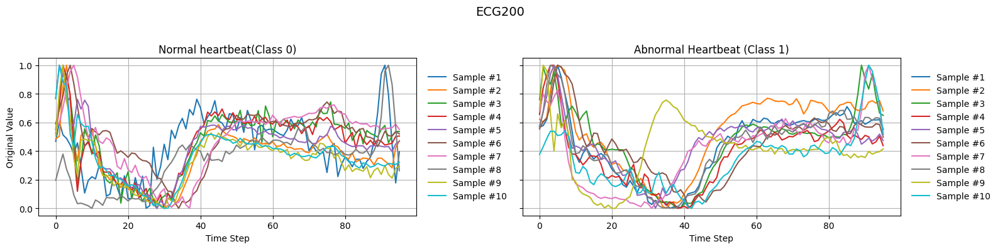

In [4]:
def plot_representative_samples(X_train, y_train, n_samples=3):
    fig, axes = plt.subplots(1, 2, figsize=(16, 4), gridspec_kw={'width_ratios': [1, 1]}, sharey=True)

    # Generate dynamic color palette
    cmap = plt.get_cmap("tab10")  # You can switch to 'viridis' or 'tab20' for >10 lines
    colors = [cmap(i % 10) for i in range(n_samples)]

    for ax, label in zip(axes, [0, 1]):
        idxs = np.where(y_train == label)[0][:n_samples]
        for j, idx in enumerate(idxs):
            ax.plot(X_train[idx], label=f"Sample #{j+1}", color=colors[j], linewidth=1.5)

        ax.set_title("Normal heartbeat(Class 0)" if label == 0 else "Abnormal Heartbeat (Class 1)")
        ax.set_xlabel("Time Step")
        ax.grid(True)
        ax.legend(loc='center left', bbox_to_anchor=(1.01, 0.5), frameon=False)

    axes[0].set_ylabel("Original Value")
    fig.suptitle("ECG200", fontsize=14)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# ✅ Example usage:
plot_representative_samples(X_train, y_train, n_samples=10)


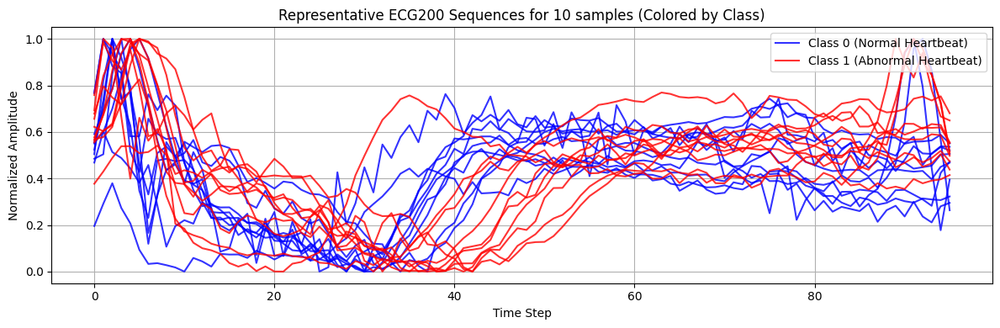

In [5]:

def plot_ecg_with_class_colors(X, y, num_samples=10):
    classes = np.unique(y)
    colors = ['blue', 'red']  # class 0 → blue, class 1 → red
    labels_set = [False, False]

    plt.figure(figsize=(12, 4))

    for cls in classes:
        cls_indices = np.where(y == cls)[0][:num_samples]
        for i, idx in enumerate(cls_indices):
            if not labels_set[cls]:
                label = ("Class 0 (Normal Heartbeat)" if cls == 0
                         else "Class 1 (Abnormal Heartbeat)")
                labels_set[cls] = True
            else:
                label = None
            plt.plot(X[idx], label=label, color=colors[cls], alpha=0.8)

    plt.title("Representative ECG200 Sequences for 10 samples (Colored by Class)")
    plt.xlabel("Time Step")
    plt.ylabel("Normalized Amplitude")
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Example usage:
plot_ecg_with_class_colors(X_train, y_train)

In [6]:
# Merge the datasets
X_combined = np.vstack((X_train, X_test))
y_combined = np.hstack((y_train, y_test))

# Perform stratified split (preserving class proportions)
X_train_new, X_temp, y_train_new, y_temp = train_test_split(
    X_combined, y_combined, test_size=0.30, stratify=y_combined, random_state=42
)

X_val_new, X_test_new, y_val_new, y_test_new = train_test_split(
    X_temp, y_temp, test_size=0.50, stratify=y_temp, random_state=42
)

print(f"New Train Size: {len(X_train_new)}, Validation: {len(X_val_new)}, Test: {len(X_test_new)}")

# Apply SMOTE only on the training set to balance classes
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_new, y_train_new)

print(f"Train size after SMOTE: {len(X_train_resampled)}")

New Train Size: 140, Validation: 30, Test: 30
Train size after SMOTE: 186


In [7]:
# Convert to PyTorch tensors
X_train_tensor = torch.tensor(X_train_resampled, dtype=torch.float32).unsqueeze(-1)
X_val_tensor = torch.tensor(X_val_new, dtype=torch.float32).unsqueeze(-1)
X_test_tensor = torch.tensor(X_test_new, dtype=torch.float32).unsqueeze(-1)
y_train_tensor = torch.tensor(y_train_resampled, dtype=torch.long)
y_val_tensor = torch.tensor(y_val_new, dtype=torch.long)
y_test_tensor = torch.tensor(y_test_new, dtype=torch.long)


**LSTM Model and Training **

In [8]:

# Hyperparameter search space (ensure hidden_dim and batch_size are integers)
param_grid = {
    'hidden_dim': [32,64,96,128,160],
    'num_layers': [2, 3],
    'learning_rate': [0.0001, 0.001, 0.01],
    'batch_size': [4,8,16, 32, 64],
    'dropout_rate': [0.1, 0.2, 0.3]
}

# Define the enhanced LSTM model
class LSTMModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim, num_layers, dropout_rate):
        super(LSTMModel, self).__init__()
        # Ensure hidden_dim is a Python int
        if isinstance(hidden_dim, np.integer):
            hidden_dim = int(hidden_dim)
        elif not isinstance(hidden_dim, int) or hidden_dim <= 0:
            raise ValueError(f"hidden_dim must be a positive integer, got {hidden_dim} of type {type(hidden_dim)}")

        # Ensure num_layers is a Python int
        if isinstance(num_layers, np.integer):
            num_layers = int(num_layers)
        elif not isinstance(num_layers, int) or num_layers <= 0:
            raise ValueError(f"num_layers must be a positive integer, got {num_layers} of type {type(num_layers)}")

        self.hidden_dim = hidden_dim
        self.num_layers = num_layers
        self.lstm = nn.LSTM(input_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout_rate if num_layers > 1 else 0)
        self.dropout = nn.Dropout(dropout_rate)
        self.fc = nn.Sequential(
            nn.Linear(hidden_dim, 16),  # Intermediate layer
            nn.ReLU(),
            nn.Dropout(dropout_rate),
            nn.Linear(16, output_dim)   # Output layer
        )

    def forward(self, x):
        h0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(x.device)
        c0 = torch.zeros(self.num_layers, x.size(0), self.hidden_dim).to(x.device)
        out, (hn, cn) = self.lstm(x, (h0, c0))
        last_hidden_state = out[:, -1, :]
        return self.fc(self.dropout(last_hidden_state)), out

# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [9]:

# Function to train and evaluate a model with given hyperparameters
def train_and_evaluate(hidden_dim, num_layers, learning_rate, batch_size, dropout_rate, X_train, y_train, X_val, y_val, X_test, y_test):
    # Debug: Print parameter types to ensure they are correct
    print(f"Debug - Parameters: hidden_dim={hidden_dim}, num_layers={num_layers}, "
          f"learning_rate={learning_rate}, batch_size={batch_size}, dropout_rate={dropout_rate}")
    print(f"Debug - hidden_dim type: {type(hidden_dim)}, num_layers type: {type(num_layers)}, "
          f"batch_size type: {type(batch_size)}")

    # Ensure hidden_dim and num_layers are Python integers
    if isinstance(hidden_dim, np.integer):
        hidden_dim = int(hidden_dim)
    elif not isinstance(hidden_dim, int) or hidden_dim <= 0:
        raise ValueError(f"hidden_dim must be a positive integer, got {hidden_dim} of type {type(hidden_dim)}")

    if isinstance(num_layers, np.integer):
        num_layers = int(num_layers)
    elif not isinstance(num_layers, int) or num_layers <= 0:
        raise ValueError(f"num_layers must be a positive integer, got {num_layers} of type {type(num_layers)}")

    # Ensure batch_size is a Python integer
    if isinstance(batch_size, np.integer):
        batch_size = int(batch_size)
    elif not isinstance(batch_size, int) or batch_size <= 0:
        raise ValueError(f"batch_size must be a positive integer, got {batch_size} of type {type(batch_size)}")

    # Create DataLoaders with explicit integer batch_size
    try:
        train_dataset = TensorDataset(X_train, y_train)
        val_dataset = TensorDataset(X_val, y_val)
        test_dataset = TensorDataset(X_test, y_test)
        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
        test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
    except Exception as e:
        print(f"Error creating DataLoader: {e}")
        raise

    # Initialize model
    model = LSTMModel(input_dim=1, hidden_dim=hidden_dim, output_dim=1, num_layers=num_layers, dropout_rate=dropout_rate).to(device)
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    # Training with early stopping
    num_epochs = 50
    best_val_loss = float('inf')
    best_model_state = None
    patience = 10
    epochs_no_improve = 0
    train_losses, val_losses = [], []
    val_accuracies, test_accuracies = [], []

    for epoch in range(num_epochs):
        model.train()
        train_loss = 0
        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device).float().unsqueeze(1)
            optimizer.zero_grad()
            outputs, _ = model(batch_X)
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
            train_loss += loss.item()
        train_loss /= len(train_loader)

        # Validation
        model.eval()
        val_loss = 0
        val_preds, val_true = [], []
        with torch.no_grad():
            for batch_X, batch_y in val_loader:
                batch_X, batch_y = batch_X.to(device), batch_y.to(device).float().unsqueeze(1)
                outputs, _ = model(batch_X)
                val_loss += criterion(outputs, batch_y).item()
                val_preds.extend(torch.sigmoid(outputs).cpu().numpy().flatten() > 0.5)
                val_true.extend(batch_y.cpu().numpy().flatten())
        val_loss /= len(val_loader)
        val_accuracy = accuracy_score(val_true, val_preds)

        # Test (for monitoring, but only evaluate best model on test)
        test_loss = 0
        test_preds, test_true = [], []
        with torch.no_grad():
            for batch_X, batch_y in test_loader:
                batch_X, batch_y = batch_X.to(device), batch_y.to(device).float().unsqueeze(1)
                outputs, _ = model(batch_X)
                test_loss += criterion(outputs, batch_y).item()
                test_preds.extend(torch.sigmoid(outputs).cpu().numpy().flatten() > 0.5)
                test_true.extend(batch_y.cpu().numpy().flatten())
        test_loss /= len(test_loader)
        test_accuracy = accuracy_score(test_true, test_preds)

        train_losses.append(train_loss)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)
        test_accuracies.append(test_accuracy)

        print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, "
              f"Val Acc: {val_accuracy:.4f}, Test Acc: {test_accuracy:.4f}")

        # Early stopping
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_state = model.state_dict()
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f"Early stopping triggered after epoch {epoch+1}")
            break

    # Load best model
    model.load_state_dict(best_model_state)

    # Final evaluation on validation and test sets
    model.eval()
    with torch.no_grad():
        # Validation final metrics
        val_preds, val_true = [], []
        for batch_X, batch_y in val_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device).float().unsqueeze(1)
            outputs, _ = model(batch_X)
            val_preds.extend(torch.sigmoid(outputs).cpu().numpy().flatten() > 0.5)
            val_true.extend(batch_y.cpu().numpy().flatten())
        val_accuracy = accuracy_score(val_true, val_preds)
        val_precision = precision_score(val_true, val_preds)
        val_recall = recall_score(val_true, val_preds)
        val_f1 = f1_score(val_true, val_preds)

        # Test final metrics
        test_preds, test_true = [], []
        for batch_X, batch_y in test_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device).float().unsqueeze(1)
            outputs, _ = model(batch_X)
            test_preds.extend(torch.sigmoid(outputs).cpu().numpy().flatten() > 0.5)
            test_true.extend(batch_y.cpu().numpy().flatten())
        test_accuracy = accuracy_score(test_true, test_preds)
        test_precision = precision_score(test_true, test_preds)
        test_recall = recall_score(test_true, test_preds)
        test_f1 = f1_score(test_true, test_preds)

        test_loss = 0
        for batch_X, batch_y in test_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device).float().unsqueeze(1)
            outputs, _ = model(batch_X)
            test_loss += criterion(outputs, batch_y).item()
        test_loss /= len(test_loader)

        print(f"\nBest Model - Validation: Loss: {best_val_loss:.4f}, Accuracy: {val_accuracy:.4f}, "
              f"Precision: {val_precision:.4f}, Recall: {val_recall:.4f}, F1: {val_f1:.4f}")
        print(f"Best Model - Test: Loss: {test_loss:.4f}, Accuracy: {test_accuracy:.4f}, "
              f"Precision: {test_precision:.4f}, Recall: {test_recall:.4f}, F1: {test_f1:.4f}")

        # Plot training/validation/test metrics
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(train_losses, label='Train Loss')
        plt.plot(val_losses, label='Validation Loss')
        plt.plot([i * len(train_loader) for i in range(len(test_accuracies))], [test_loss] * len(test_accuracies), label='Test Loss', linestyle='--')
        plt.title("Loss Over Epochs")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.legend()
        plt.grid()

        plt.subplot(1, 2, 2)
        plt.plot(val_accuracies, label='Validation Accuracy')
        plt.plot(test_accuracies, label='Test Accuracy')
        plt.title("Accuracy Over Epochs")
        plt.xlabel("Epoch")
        plt.ylabel("Accuracy")
        plt.legend()
        plt.grid()
        plt.show()

    # Extract hidden states for the best model
    model.eval()
    with torch.no_grad():
        _, test_hidden_states_best = model(X_test_tensor.to(device))

    return model, test_hidden_states_best, val_accuracies, test_accuracies, train_losses, val_losses, test_loss

Hyperparameter Trials:   0%|          | 0/100 [00:00<?, ?it/s]


🔁 Trial 1: hidden_dim=32, num_layers=2, lr=0.01, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.01, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6946, Val Loss: 0.6925, Val Acc: 0.7667, Test Acc: 0.7333
Epoch [2/50], Train Loss: 0.6938, Val Loss: 0.6860, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6940, Val Loss: 0.7001, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6932, Val Loss: 0.6908, Val Acc: 0.7333, Test Acc: 0.7000
Epoch [5/50], Train Loss: 0.6889, Val Loss: 0.6881, Val Acc: 0.6667, Test Acc: 0.7000
Epoch [6/50], Train Loss: 0.6897, Val Loss: 0.6561, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6901, Val Loss: 0.6755, Val Acc: 0.7333, Test Acc: 0.7333
Epoch [8/50], Train Loss: 0.6794, Val Loss: 0.6696, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [9/50], Train Loss: 0.643

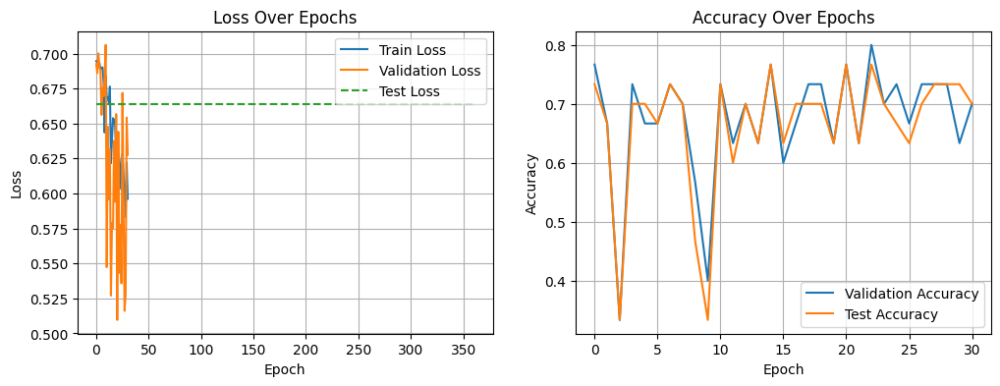

Hyperparameter Trials:   1%|          | 1/100 [00:13<21:48, 13.22s/it]

✅ New Best Model at Trial 1 with Test Loss = 0.6635
✅ New Best Model at Trial 1 with Test Loss = 0.6635

🔁 Trial 2: hidden_dim=64, num_layers=2, lr=0.01, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.01, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6967, Val Loss: 0.6882, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6985, Val Loss: 0.7005, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6965, Val Loss: 0.6957, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6941, Val Loss: 0.6933, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6948, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6951, Val Loss: 0.6945, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6936, Val Loss: 0.6934, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], T

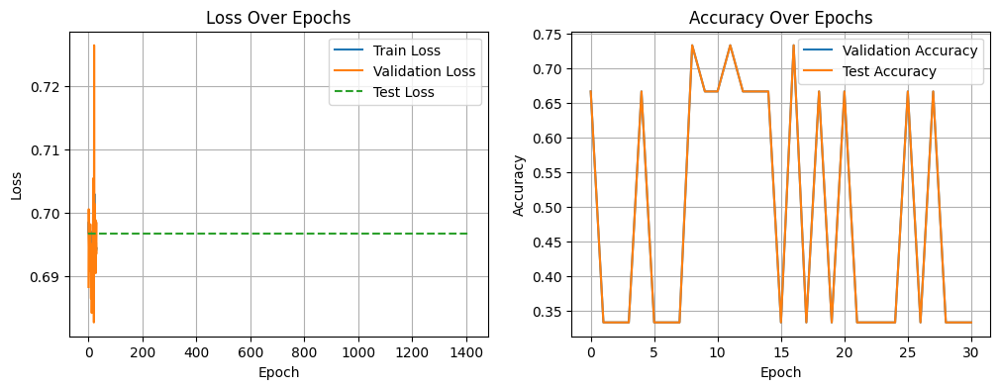

Hyperparameter Trials:   2%|▏         | 2/100 [00:32<27:19, 16.73s/it]


🔁 Trial 3: hidden_dim=160, num_layers=2, lr=0.01, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.01, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6960, Val Loss: 0.7093, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6944, Val Loss: 0.6374, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.7091, Val Loss: 0.8357, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.7052, Val Loss: 0.6957, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6940, Val Loss: 0.6782, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6963, Val Loss: 0.6856, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6942, Val Loss: 0.7023, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6931, Val Loss: 0.7079, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.6

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6374, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6901, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


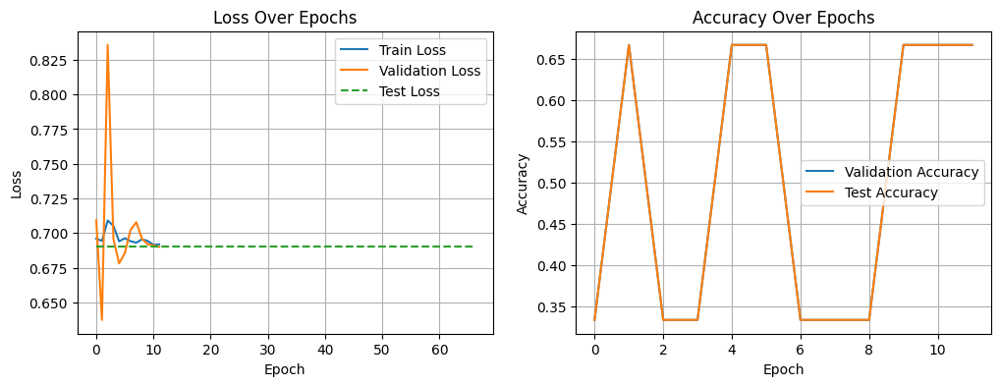

Hyperparameter Trials:   3%|▎         | 3/100 [00:51<28:30, 17.64s/it]


🔁 Trial 4: hidden_dim=32, num_layers=2, lr=0.0001, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.0001, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6893, Val Loss: 0.7111, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6943, Val Loss: 0.7111, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6977, Val Loss: 0.7108, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6938, Val Loss: 0.7097, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6939, Val Loss: 0.7089, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6970, Val Loss: 0.7095, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6934, Val Loss: 0.7091, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6944, Val Loss: 0.7088, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.6

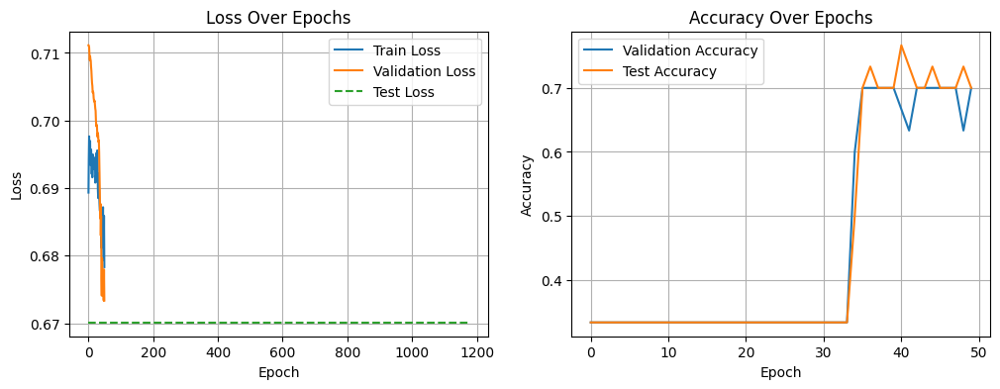

Hyperparameter Trials:   4%|▍         | 4/100 [01:02<24:24, 15.26s/it]


🔁 Trial 5: hidden_dim=160, num_layers=2, lr=0.01, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.01, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7018, Val Loss: 0.7090, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6925, Val Loss: 0.7130, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6997, Val Loss: 0.6968, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6947, Val Loss: 0.6953, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6945, Val Loss: 0.6955, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6931, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6941, Val Loss: 0.6876, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6935, Val Loss: 0.6942, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.694

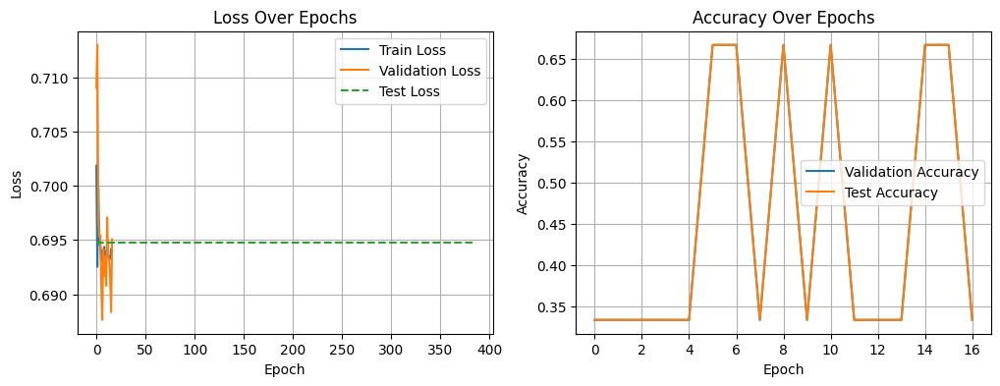

Hyperparameter Trials:   5%|▌         | 5/100 [01:27<29:22, 18.55s/it]


🔁 Trial 6: hidden_dim=160, num_layers=3, lr=0.0001, batch_size=32, dropout=0.3
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.0001, batch_size=32, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7014, Val Loss: 0.6608, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6987, Val Loss: 0.6617, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.7003, Val Loss: 0.6624, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6979, Val Loss: 0.6632, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6981, Val Loss: 0.6640, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6988, Val Loss: 0.6644, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6976, Val Loss: 0.6649, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6980, Val Loss: 0.6655, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss:

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6608, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6672, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


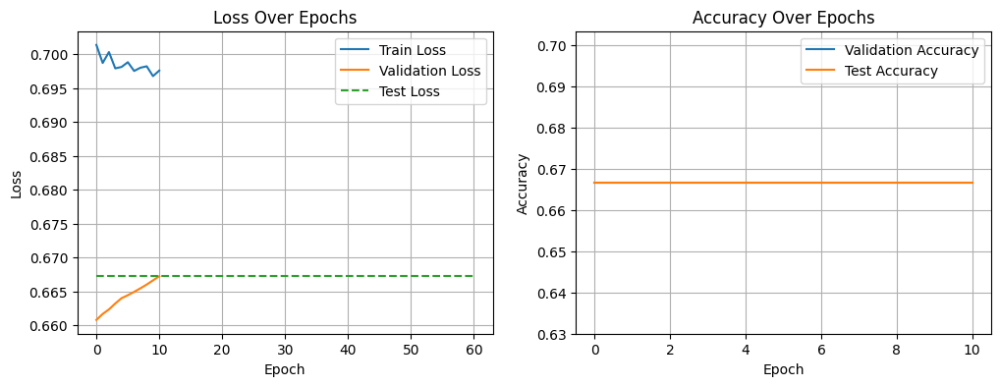

Hyperparameter Trials:   6%|▌         | 6/100 [01:51<32:25, 20.70s/it]


🔁 Trial 7: hidden_dim=96, num_layers=2, lr=0.0001, batch_size=32, dropout=0.2
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.0001, batch_size=32, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6935, Val Loss: 0.7045, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6933, Val Loss: 0.7042, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6937, Val Loss: 0.7041, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6942, Val Loss: 0.7038, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6932, Val Loss: 0.7036, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6942, Val Loss: 0.7033, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6941, Val Loss: 0.7030, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6923, Val Loss: 0.7027, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0

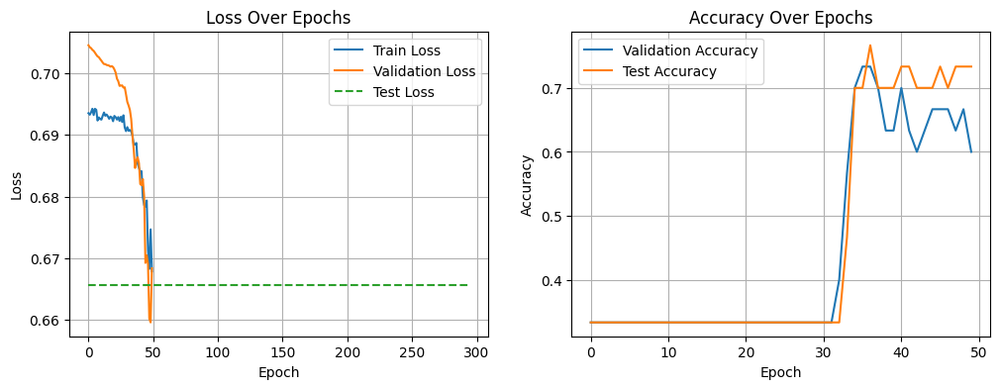

Hyperparameter Trials:   7%|▋         | 7/100 [02:28<40:16, 25.99s/it]


🔁 Trial 8: hidden_dim=96, num_layers=2, lr=0.0001, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.0001, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6997, Val Loss: 0.6598, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6986, Val Loss: 0.6604, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.7002, Val Loss: 0.6609, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6991, Val Loss: 0.6615, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6977, Val Loss: 0.6619, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6984, Val Loss: 0.6624, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6961, Val Loss: 0.6631, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6976, Val Loss: 0.6637, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


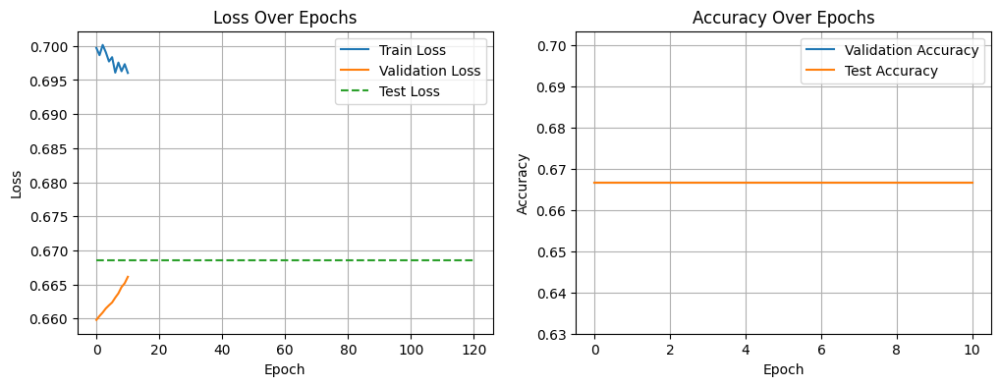

Hyperparameter Trials:   8%|▊         | 8/100 [02:36<30:57, 20.20s/it]


🔁 Trial 9: hidden_dim=32, num_layers=3, lr=0.0001, batch_size=16, dropout=0.2
Debug - Parameters: hidden_dim=32, num_layers=3, learning_rate=0.0001, batch_size=16, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6925, Val Loss: 0.6914, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6929, Val Loss: 0.6916, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6926, Val Loss: 0.6916, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6946, Val Loss: 0.6915, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6941, Val Loss: 0.6915, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6933, Val Loss: 0.6918, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6921, Val Loss: 0.6917, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6934, Val Loss: 0.6916, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


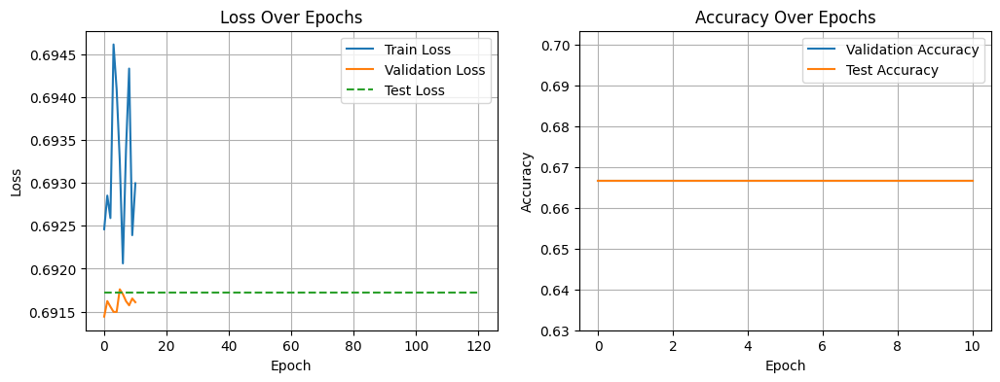

Hyperparameter Trials:   9%|▉         | 9/100 [02:39<22:29, 14.83s/it]


🔁 Trial 10: hidden_dim=160, num_layers=3, lr=0.0001, batch_size=32, dropout=0.3
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.0001, batch_size=32, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6951, Val Loss: 0.6778, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6944, Val Loss: 0.6785, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6940, Val Loss: 0.6793, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6934, Val Loss: 0.6794, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6921, Val Loss: 0.6797, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6936, Val Loss: 0.6798, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6944, Val Loss: 0.6798, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6930, Val Loss: 0.6801, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6778, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6806, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


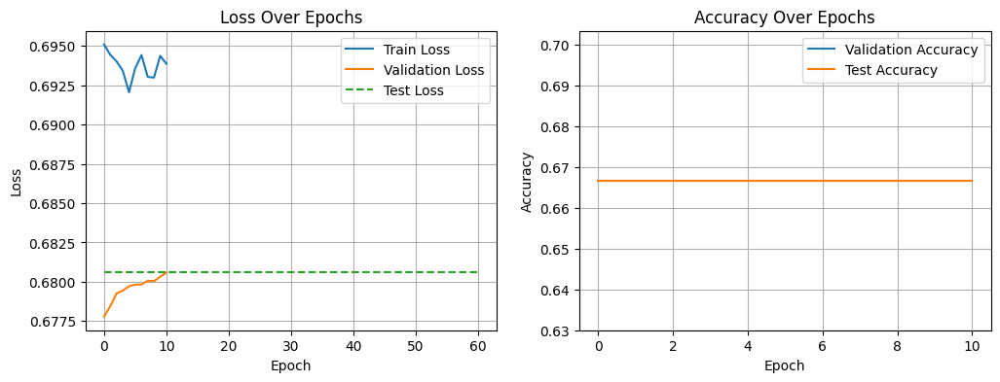

Hyperparameter Trials:  10%|█         | 10/100 [03:05<27:13, 18.15s/it]


🔁 Trial 11: hidden_dim=32, num_layers=3, lr=0.0001, batch_size=64, dropout=0.2
Debug - Parameters: hidden_dim=32, num_layers=3, learning_rate=0.0001, batch_size=64, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6953, Val Loss: 0.6702, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6961, Val Loss: 0.6705, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6969, Val Loss: 0.6707, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6951, Val Loss: 0.6710, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6965, Val Loss: 0.6712, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6959, Val Loss: 0.6714, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6960, Val Loss: 0.6716, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6950, Val Loss: 0.6719, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


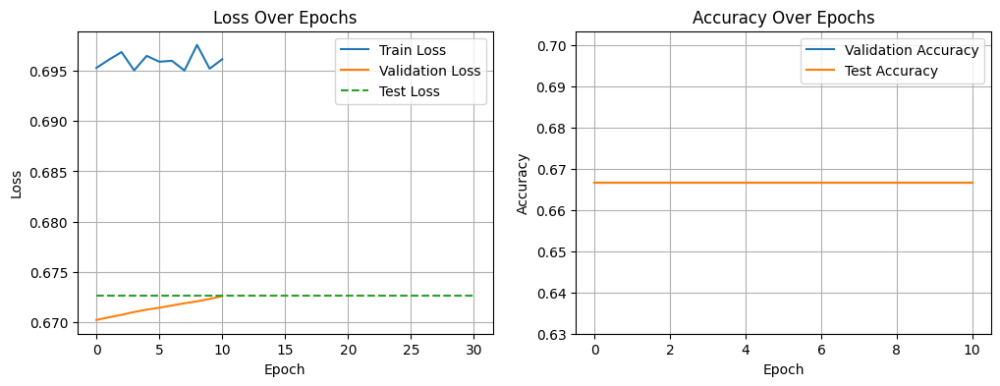

Hyperparameter Trials:  11%|█         | 11/100 [03:07<19:51, 13.39s/it]


🔁 Trial 12: hidden_dim=160, num_layers=3, lr=0.01, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.01, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6986, Val Loss: 0.7119, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.7013, Val Loss: 0.6606, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6974, Val Loss: 0.6884, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6955, Val Loss: 0.6946, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6935, Val Loss: 0.6932, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6938, Val Loss: 0.6979, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6930, Val Loss: 0.6975, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6934, Val Loss: 0.6971, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6606, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6915, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


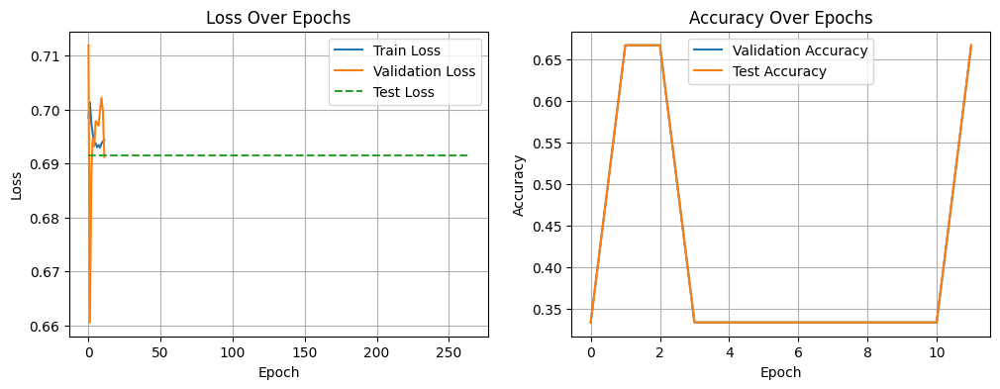

Hyperparameter Trials:  12%|█▏        | 12/100 [03:35<25:59, 17.73s/it]


🔁 Trial 13: hidden_dim=32, num_layers=2, lr=0.01, batch_size=8, dropout=0.2
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.01, batch_size=8, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6967, Val Loss: 0.7007, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.7039, Val Loss: 0.7009, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6923, Val Loss: 0.7151, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6933, Val Loss: 0.6989, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6952, Val Loss: 0.7145, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.7006, Val Loss: 0.6988, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6965, Val Loss: 0.7156, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6935, Val Loss: 0.7004, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.6951

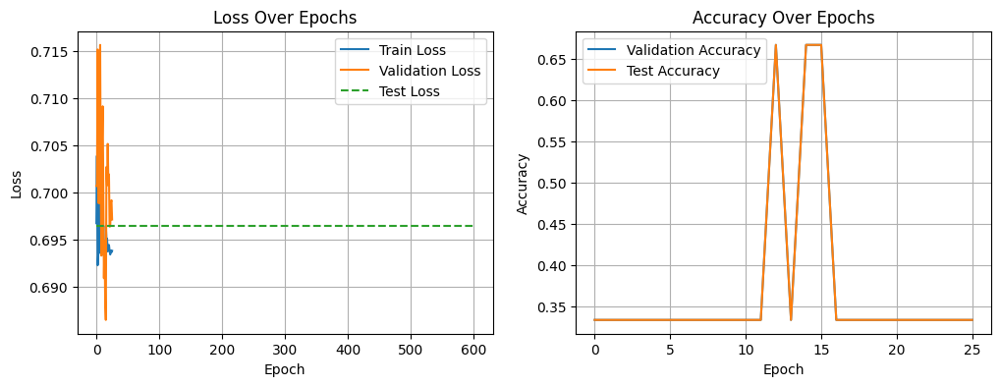

Hyperparameter Trials:  13%|█▎        | 13/100 [03:41<20:42, 14.28s/it]


🔁 Trial 14: hidden_dim=32, num_layers=2, lr=0.0001, batch_size=32, dropout=0.2
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.0001, batch_size=32, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6957, Val Loss: 0.7131, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6950, Val Loss: 0.7128, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6956, Val Loss: 0.7123, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6969, Val Loss: 0.7121, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6949, Val Loss: 0.7117, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6960, Val Loss: 0.7114, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6948, Val Loss: 0.7111, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6930, Val Loss: 0.7108, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

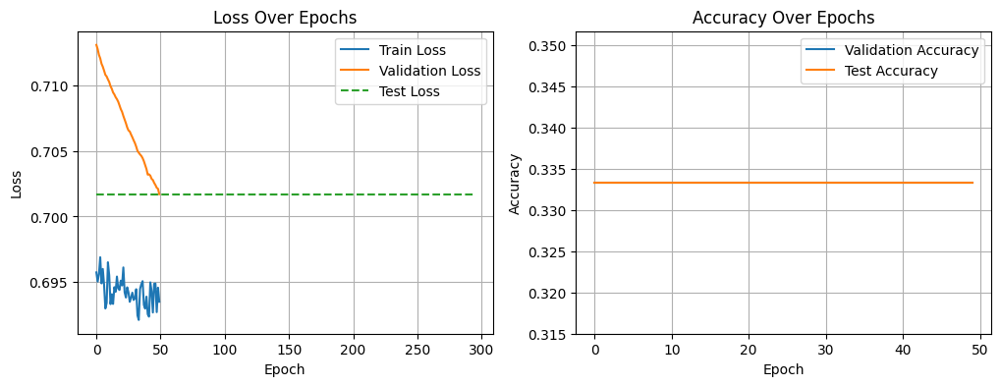

Hyperparameter Trials:  14%|█▍        | 14/100 [03:50<17:59, 12.55s/it]


🔁 Trial 15: hidden_dim=128, num_layers=3, lr=0.0001, batch_size=16, dropout=0.2
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.0001, batch_size=16, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6948, Val Loss: 0.6751, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6941, Val Loss: 0.6757, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6941, Val Loss: 0.6768, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6950, Val Loss: 0.6774, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6920, Val Loss: 0.6790, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6947, Val Loss: 0.6787, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6949, Val Loss: 0.6784, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6949, Val Loss: 0.6787, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6751, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6827, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


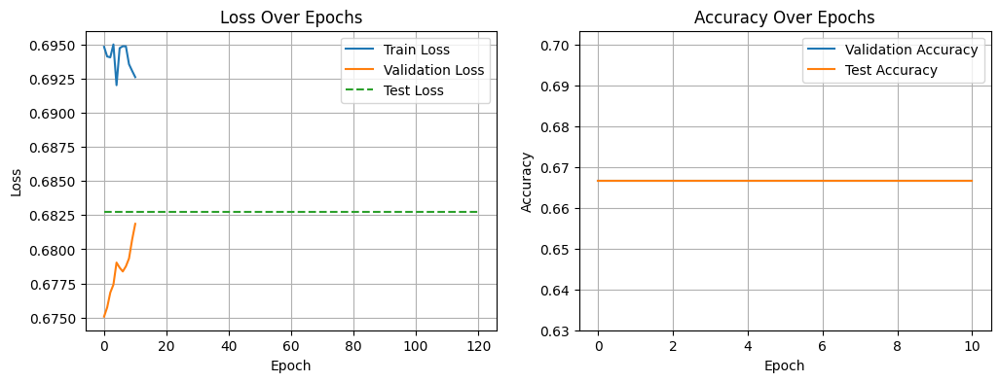

Hyperparameter Trials:  15%|█▌        | 15/100 [04:06<19:19, 13.65s/it]


🔁 Trial 16: hidden_dim=64, num_layers=3, lr=0.01, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.01, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6978, Val Loss: 0.7024, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.7071, Val Loss: 0.6996, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6934, Val Loss: 0.7078, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6947, Val Loss: 0.6808, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6984, Val Loss: 0.6821, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6940, Val Loss: 0.6875, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6937, Val Loss: 0.6884, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6949, Val Loss: 0.6947, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.6941

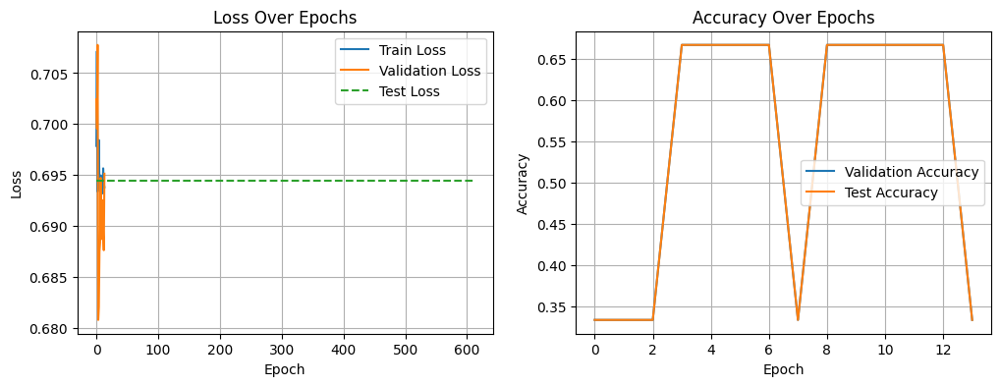

Hyperparameter Trials:  16%|█▌        | 16/100 [04:18<18:16, 13.05s/it]


🔁 Trial 17: hidden_dim=64, num_layers=2, lr=0.0001, batch_size=32, dropout=0.2
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.0001, batch_size=32, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6936, Val Loss: 0.6999, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6927, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6941, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6944, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6938, Val Loss: 0.6997, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6930, Val Loss: 0.6996, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6930, Val Loss: 0.6995, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6926, Val Loss: 0.6994, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

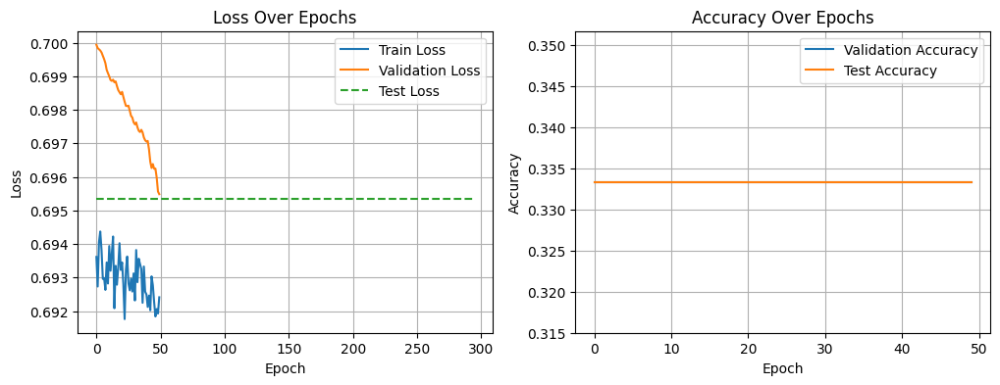

Hyperparameter Trials:  17%|█▋        | 17/100 [04:35<19:52, 14.37s/it]


🔁 Trial 18: hidden_dim=96, num_layers=2, lr=0.01, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.01, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7015, Val Loss: 0.6593, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.7104, Val Loss: 0.7300, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6967, Val Loss: 0.7004, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6961, Val Loss: 0.6853, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6917, Val Loss: 0.6954, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6963, Val Loss: 0.6968, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6961, Val Loss: 0.7076, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6943, Val Loss: 0.6987, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.69

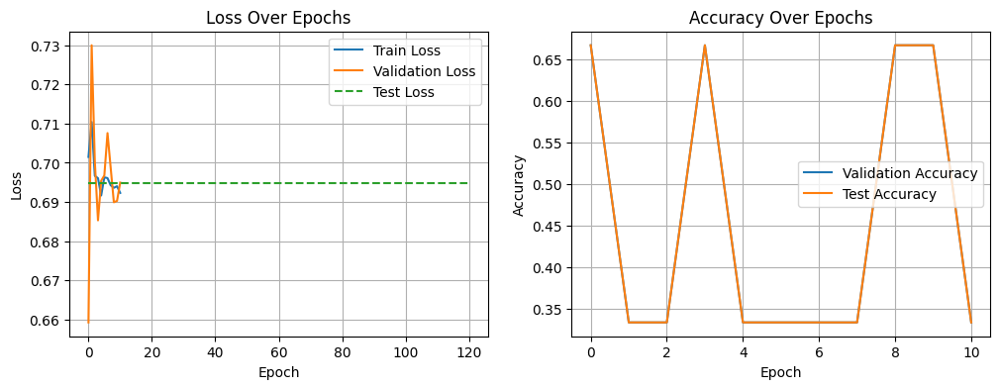

Hyperparameter Trials:  18%|█▊        | 18/100 [04:44<17:22, 12.71s/it]


🔁 Trial 19: hidden_dim=64, num_layers=2, lr=0.001, batch_size=32, dropout=0.2
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.001, batch_size=32, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6966, Val Loss: 0.7217, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6958, Val Loss: 0.7173, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6945, Val Loss: 0.7127, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6957, Val Loss: 0.7058, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6948, Val Loss: 0.7033, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6951, Val Loss: 0.7014, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6924, Val Loss: 0.6942, Val Acc: 0.3667, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6883, Val Loss: 0.6680, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

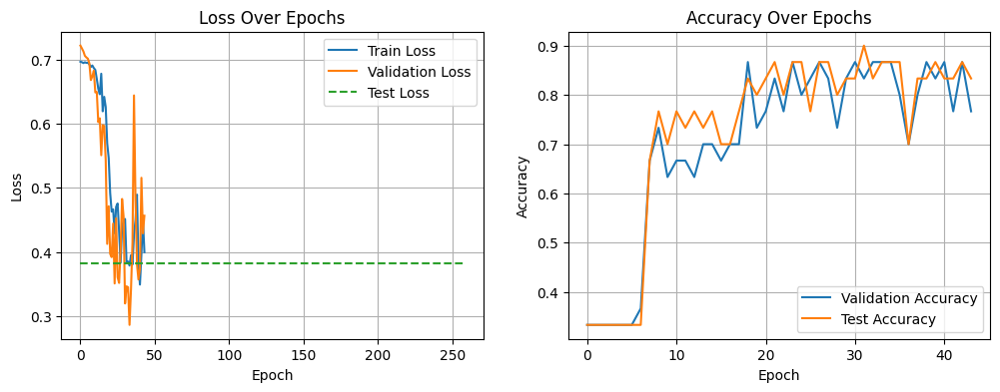

Hyperparameter Trials:  19%|█▉        | 19/100 [04:59<18:11, 13.48s/it]

✅ New Best Model at Trial 19 with Test Loss = 0.3829
✅ New Best Model at Trial 19 with Test Loss = 0.3829

🔁 Trial 20: hidden_dim=32, num_layers=2, lr=0.01, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.01, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7198, Val Loss: 0.6915, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6938, Val Loss: 0.7080, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6942, Val Loss: 0.7052, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6937, Val Loss: 0.7043, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6937, Val Loss: 0.6990, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6933, Val Loss: 0.6950, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6931, Val Loss: 0.6936, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/5

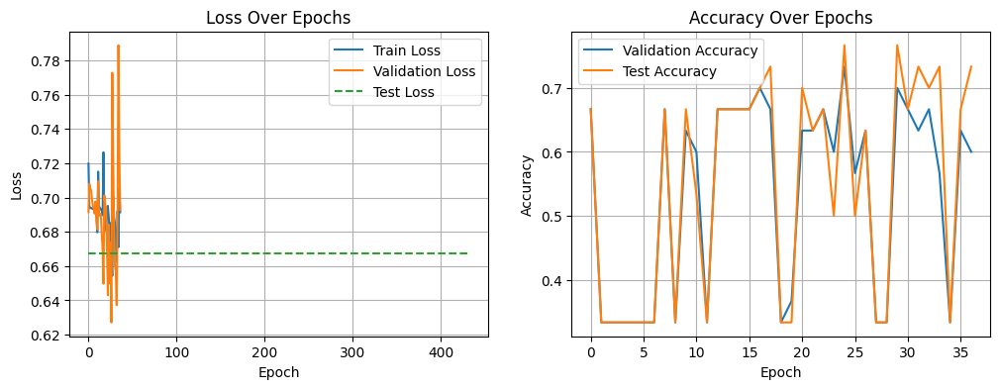

Hyperparameter Trials:  20%|██        | 20/100 [05:06<15:13, 11.42s/it]


🔁 Trial 21: hidden_dim=128, num_layers=3, lr=0.01, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.01, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6934, Val Loss: 0.6458, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.7097, Val Loss: 0.7258, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.7020, Val Loss: 0.7321, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6975, Val Loss: 0.7179, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6921, Val Loss: 0.7032, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6931, Val Loss: 0.6816, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6875, Val Loss: 0.6880, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6961, Val Loss: 0.6871, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

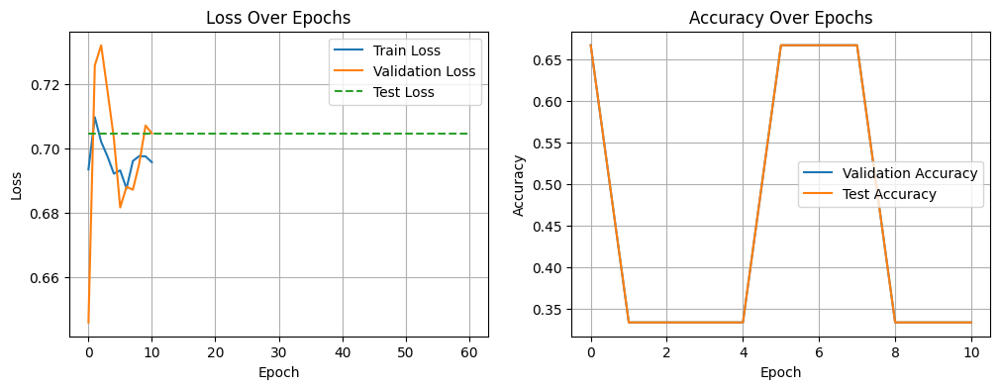

Hyperparameter Trials:  21%|██        | 21/100 [05:25<17:54, 13.60s/it]


🔁 Trial 22: hidden_dim=96, num_layers=2, lr=0.0001, batch_size=64, dropout=0.3
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.0001, batch_size=64, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6946, Val Loss: 0.6790, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6935, Val Loss: 0.6791, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6937, Val Loss: 0.6792, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6934, Val Loss: 0.6793, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6939, Val Loss: 0.6794, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6944, Val Loss: 0.6795, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6938, Val Loss: 0.6796, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6935, Val Loss: 0.6797, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


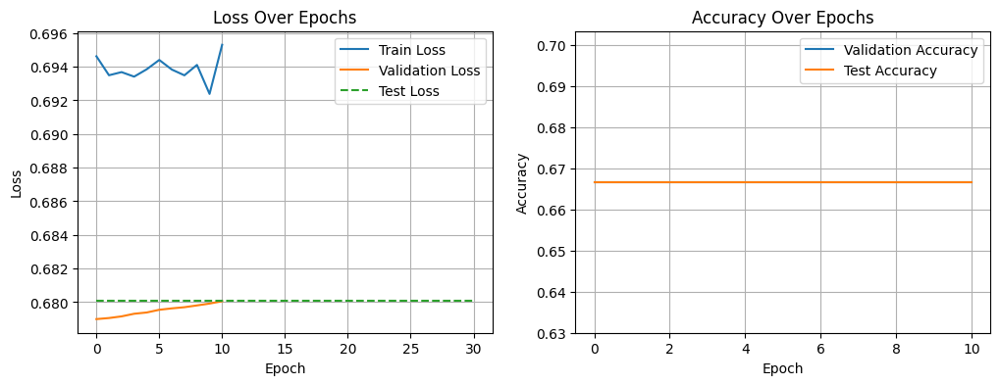

Hyperparameter Trials:  22%|██▏       | 22/100 [05:32<15:14, 11.73s/it]


🔁 Trial 23: hidden_dim=96, num_layers=3, lr=0.01, batch_size=32, dropout=0.2
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.01, batch_size=32, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6967, Val Loss: 0.6997, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6958, Val Loss: 0.6991, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6941, Val Loss: 0.6958, Val Acc: 0.3333, Test Acc: 0.3000
Epoch [4/50], Train Loss: 0.6959, Val Loss: 0.6931, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6965, Val Loss: 0.7033, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6946, Val Loss: 0.6981, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6934, Val Loss: 0.6967, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6929, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


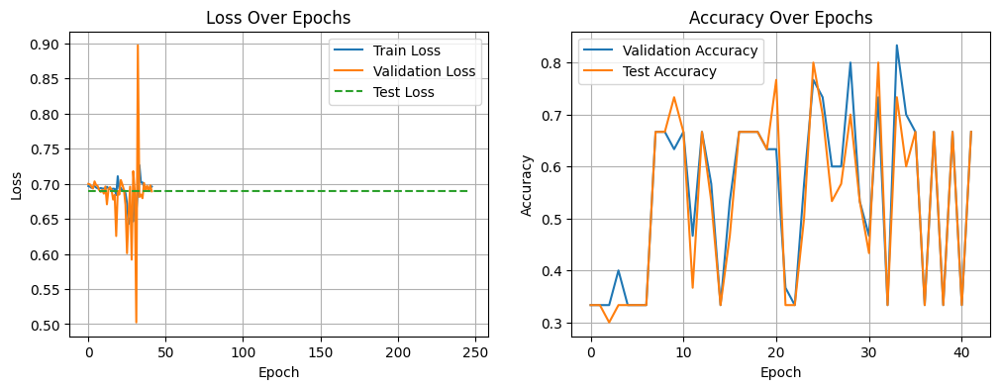

Hyperparameter Trials:  23%|██▎       | 23/100 [06:15<27:03, 21.09s/it]


🔁 Trial 24: hidden_dim=64, num_layers=2, lr=0.01, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.01, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6953, Val Loss: 0.6900, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [2/50], Train Loss: 0.6915, Val Loss: 0.6876, Val Acc: 0.7000, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.7039, Val Loss: 0.6569, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6983, Val Loss: 0.6833, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6955, Val Loss: 0.6907, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6938, Val Loss: 0.6906, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6935, Val Loss: 0.6877, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6938, Val Loss: 0.6906, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


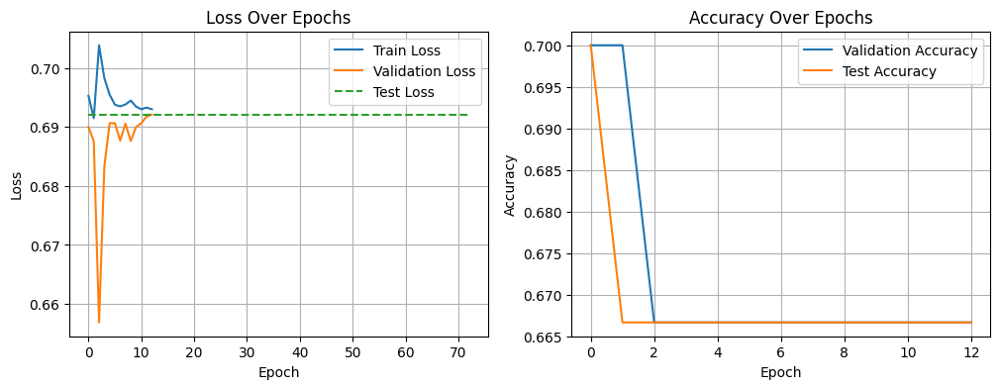

Hyperparameter Trials:  24%|██▍       | 24/100 [06:20<20:45, 16.39s/it]


🔁 Trial 25: hidden_dim=32, num_layers=2, lr=0.0001, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.0001, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6957, Val Loss: 0.6783, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6911, Val Loss: 0.6790, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6966, Val Loss: 0.6791, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6933, Val Loss: 0.6795, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6952, Val Loss: 0.6797, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6946, Val Loss: 0.6801, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6931, Val Loss: 0.6804, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6923, Val Loss: 0.6805, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


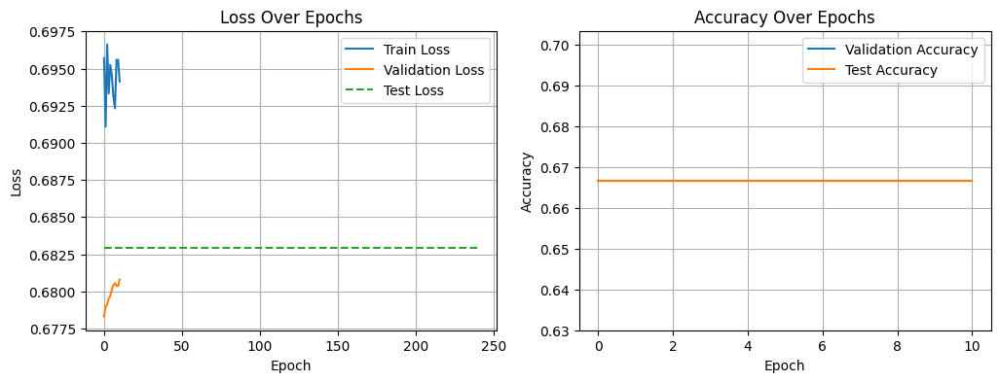

Hyperparameter Trials:  25%|██▌       | 25/100 [06:24<15:33, 12.44s/it]


🔁 Trial 26: hidden_dim=128, num_layers=2, lr=0.001, batch_size=32, dropout=0.3
Debug - Parameters: hidden_dim=128, num_layers=2, learning_rate=0.001, batch_size=32, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6930, Val Loss: 0.6937, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6937, Val Loss: 0.6958, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6910, Val Loss: 0.6949, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6936, Val Loss: 0.6907, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [5/50], Train Loss: 0.6954, Val Loss: 0.6955, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6923, Val Loss: 0.6953, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6892, Val Loss: 0.6974, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6828, Val Loss: 0.6616, Val Acc: 0.6333, Test Acc: 0.7000
Epoch [9/50], Train Loss: 

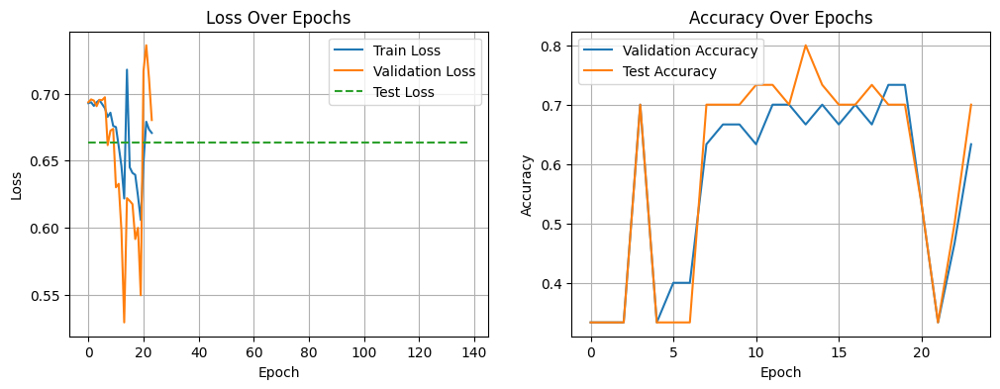

Hyperparameter Trials:  26%|██▌       | 26/100 [06:47<19:35, 15.89s/it]


🔁 Trial 27: hidden_dim=128, num_layers=3, lr=0.01, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.01, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7073, Val Loss: 0.6601, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6966, Val Loss: 0.7201, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6998, Val Loss: 0.6907, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6934, Val Loss: 0.7087, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6970, Val Loss: 0.6955, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6938, Val Loss: 0.6944, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6958, Val Loss: 0.6910, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6953, Val Loss: 0.6948, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6601, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6900, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


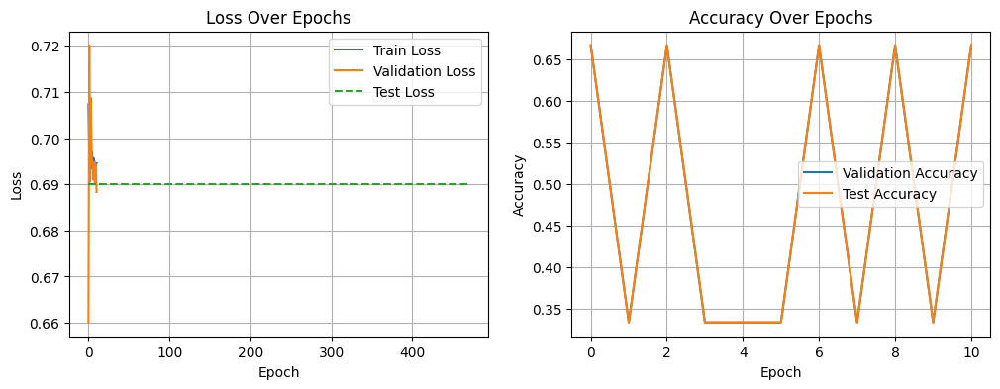

Hyperparameter Trials:  27%|██▋       | 27/100 [07:08<21:02, 17.29s/it]


🔁 Trial 28: hidden_dim=32, num_layers=3, lr=0.01, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=32, num_layers=3, learning_rate=0.01, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6965, Val Loss: 0.6812, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6962, Val Loss: 0.6931, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6932, Val Loss: 0.6918, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6935, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6939, Val Loss: 0.6937, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6938, Val Loss: 0.6884, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6935, Val Loss: 0.6902, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6932, Val Loss: 0.6902, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


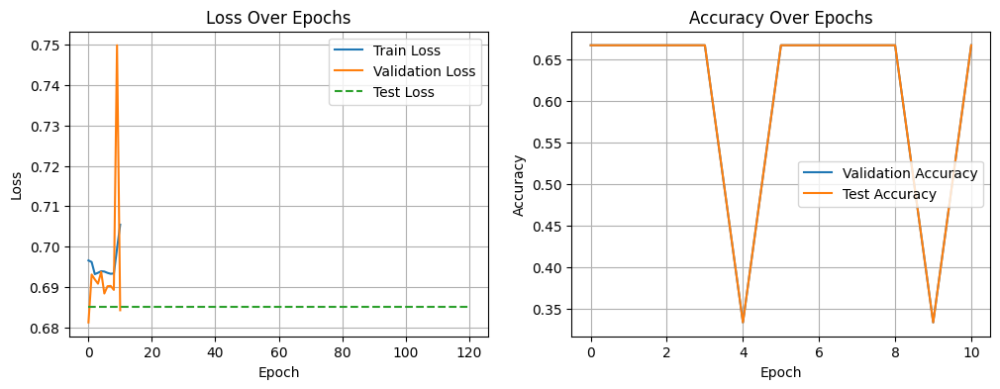

Hyperparameter Trials:  28%|██▊       | 28/100 [07:11<15:38, 13.04s/it]


🔁 Trial 29: hidden_dim=96, num_layers=3, lr=0.0001, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.0001, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6945, Val Loss: 0.6759, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6946, Val Loss: 0.6761, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6957, Val Loss: 0.6764, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6943, Val Loss: 0.6768, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6943, Val Loss: 0.6771, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6946, Val Loss: 0.6774, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6948, Val Loss: 0.6776, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6942, Val Loss: 0.6780, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


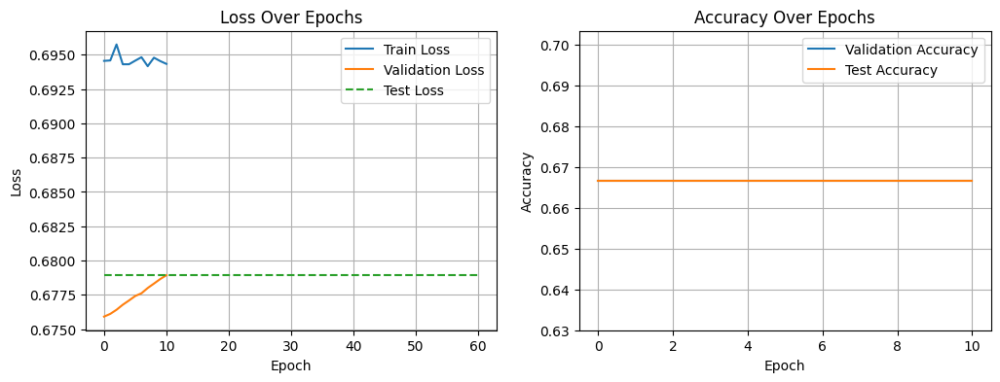

Hyperparameter Trials:  29%|██▉       | 29/100 [07:23<15:00, 12.68s/it]


🔁 Trial 30: hidden_dim=96, num_layers=2, lr=0.01, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.01, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7102, Val Loss: 0.7076, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6946, Val Loss: 0.6968, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6944, Val Loss: 0.6928, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6946, Val Loss: 0.6964, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6957, Val Loss: 0.6922, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6938, Val Loss: 0.6942, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6936, Val Loss: 0.6929, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6939, Val Loss: 0.6924, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.6942

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


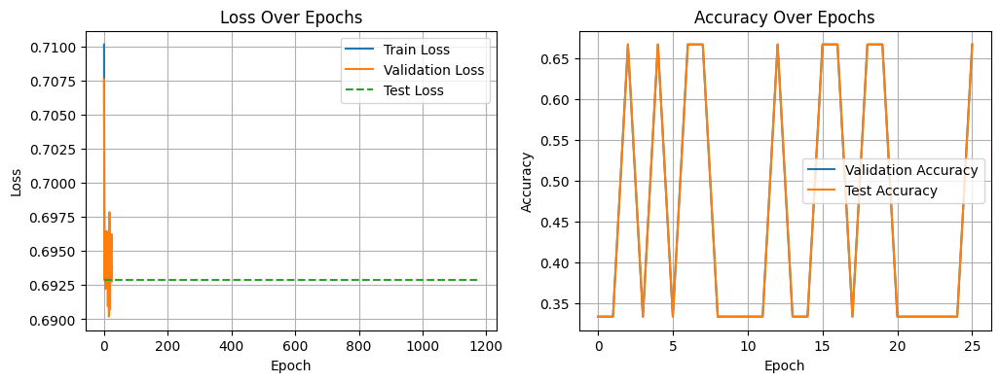

Hyperparameter Trials:  30%|███       | 30/100 [07:45<17:57, 15.39s/it]


🔁 Trial 31: hidden_dim=96, num_layers=2, lr=0.0001, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.0001, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6942, Val Loss: 0.6784, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6947, Val Loss: 0.6792, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6940, Val Loss: 0.6798, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6941, Val Loss: 0.6800, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6933, Val Loss: 0.6803, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6928, Val Loss: 0.6807, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6933, Val Loss: 0.6805, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6943, Val Loss: 0.6812, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


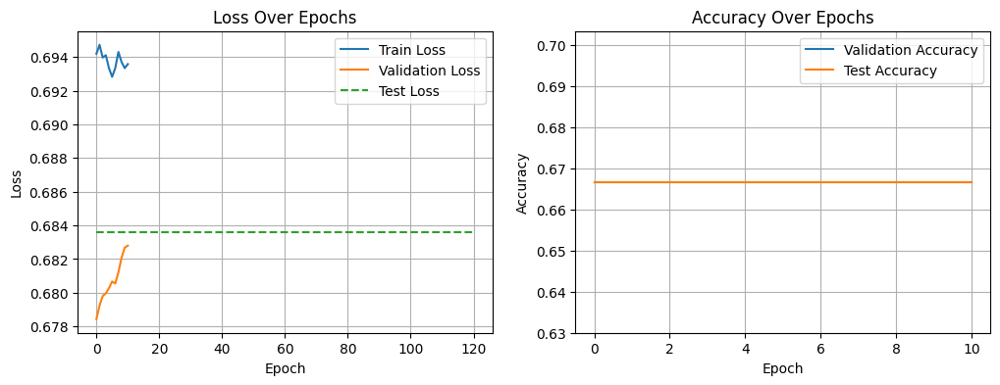

Hyperparameter Trials:  31%|███       | 31/100 [07:52<14:56, 13.00s/it]


🔁 Trial 32: hidden_dim=160, num_layers=2, lr=0.01, batch_size=16, dropout=0.2
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.01, batch_size=16, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7034, Val Loss: 0.6757, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6942, Val Loss: 0.6889, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6965, Val Loss: 0.6774, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6888, Val Loss: 0.6766, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6950, Val Loss: 0.6755, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6949, Val Loss: 0.6859, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6944, Val Loss: 0.6839, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6947, Val Loss: 0.7012, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


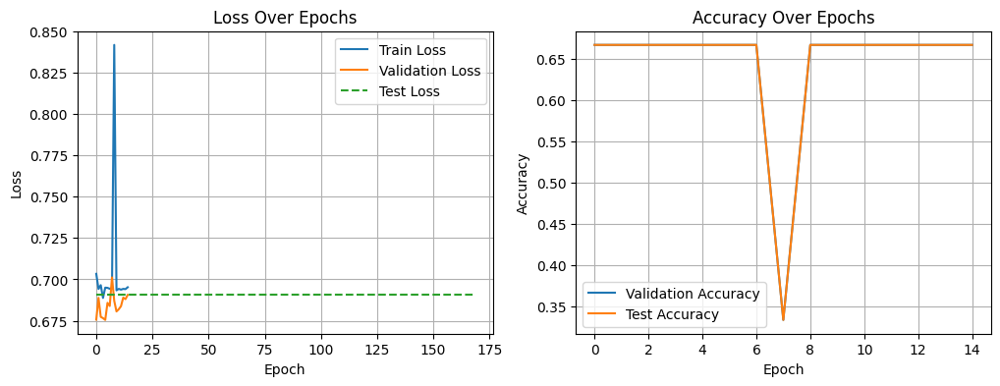

Hyperparameter Trials:  32%|███▏      | 32/100 [08:12<16:57, 14.97s/it]


🔁 Trial 33: hidden_dim=32, num_layers=2, lr=0.001, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.001, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6962, Val Loss: 0.6730, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6942, Val Loss: 0.6792, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6919, Val Loss: 0.6842, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6906, Val Loss: 0.6886, Val Acc: 0.7667, Test Acc: 0.7333
Epoch [5/50], Train Loss: 0.6913, Val Loss: 0.6999, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6852, Val Loss: 0.6921, Val Acc: 0.6000, Test Acc: 0.5667
Epoch [7/50], Train Loss: 0.6814, Val Loss: 0.7065, Val Acc: 0.5667, Test Acc: 0.4667
Epoch [8/50], Train Loss: 0.6739, Val Loss: 0.6822, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [9/50], Train Loss: 0.

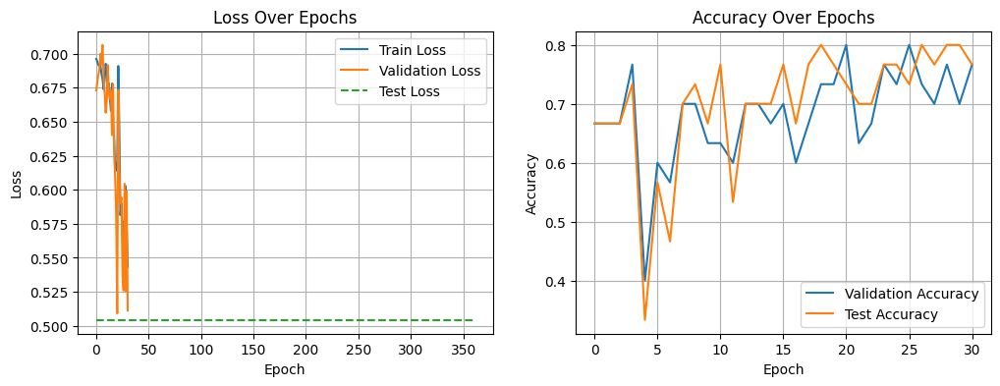

Hyperparameter Trials:  33%|███▎      | 33/100 [08:19<14:05, 12.62s/it]


🔁 Trial 34: hidden_dim=32, num_layers=2, lr=0.01, batch_size=4, dropout=0.1
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.01, batch_size=4, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7013, Val Loss: 0.7083, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6951, Val Loss: 0.6948, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6937, Val Loss: 0.6837, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6931, Val Loss: 0.6911, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [5/50], Train Loss: 0.6904, Val Loss: 0.6798, Val Acc: 0.6333, Test Acc: 0.5667
Epoch [6/50], Train Loss: 0.7150, Val Loss: 0.7115, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6936, Val Loss: 0.6964, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6910, Val Loss: 0.6993, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.6891

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


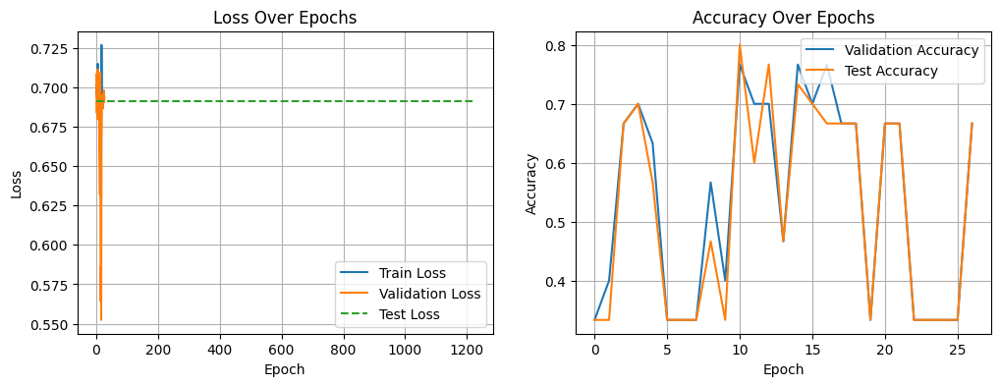

Hyperparameter Trials:  34%|███▍      | 34/100 [08:30<13:13, 12.03s/it]


🔁 Trial 35: hidden_dim=128, num_layers=2, lr=0.01, batch_size=8, dropout=0.1
Debug - Parameters: hidden_dim=128, num_layers=2, learning_rate=0.01, batch_size=8, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7007, Val Loss: 0.6798, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6951, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6930, Val Loss: 0.6907, Val Acc: 0.7667, Test Acc: 0.8000
Epoch [4/50], Train Loss: 0.6979, Val Loss: 0.6957, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6952, Val Loss: 0.6854, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6936, Val Loss: 0.6900, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6938, Val Loss: 0.6969, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6934, Val Loss: 0.6914, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


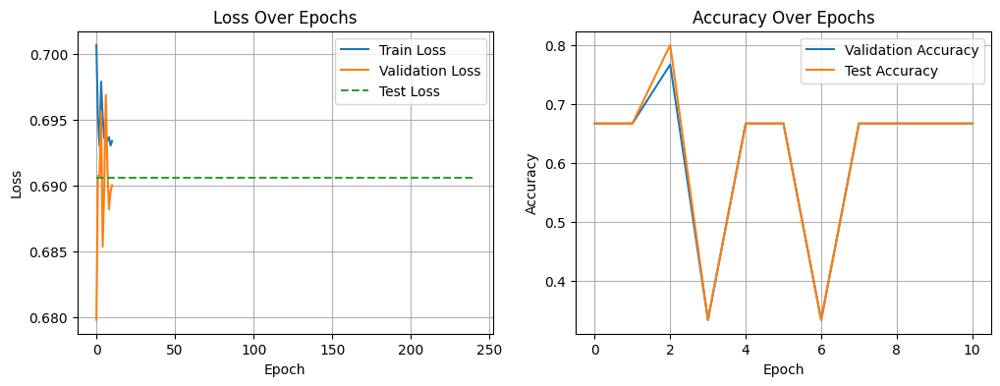

Hyperparameter Trials:  35%|███▌      | 35/100 [08:41<12:42, 11.74s/it]


🔁 Trial 36: hidden_dim=128, num_layers=2, lr=0.001, batch_size=64, dropout=0.3
Debug - Parameters: hidden_dim=128, num_layers=2, learning_rate=0.001, batch_size=64, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6931, Val Loss: 0.6940, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6928, Val Loss: 0.6935, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6920, Val Loss: 0.6923, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6930, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6940, Val Loss: 0.6903, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6928, Val Loss: 0.6906, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6924, Val Loss: 0.6920, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [8/50], Train Loss: 0.6920, Val Loss: 0.6920, Val Acc: 0.6333, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

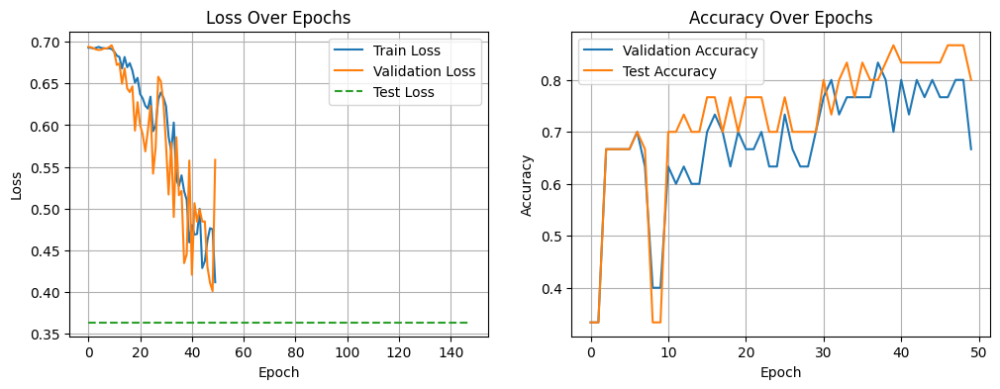

Hyperparameter Trials:  36%|███▌      | 36/100 [09:33<25:40, 24.07s/it]

✅ New Best Model at Trial 36 with Test Loss = 0.3631
✅ New Best Model at Trial 36 with Test Loss = 0.3631

🔁 Trial 37: hidden_dim=128, num_layers=2, lr=0.01, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=128, num_layers=2, learning_rate=0.01, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7009, Val Loss: 0.6461, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.7003, Val Loss: 0.6386, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.7022, Val Loss: 0.7371, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.7001, Val Loss: 0.7006, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6967, Val Loss: 0.6959, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6943, Val Loss: 0.6973, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6933, Val Loss: 0.6941, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/5

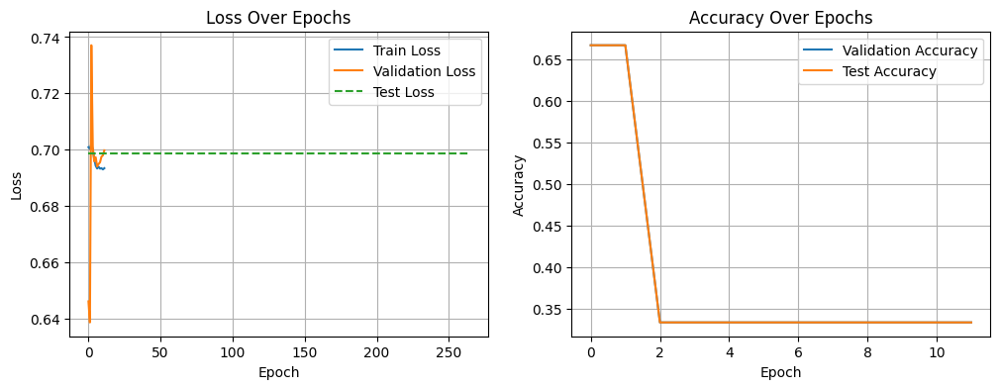

Hyperparameter Trials:  37%|███▋      | 37/100 [09:47<21:53, 20.85s/it]


🔁 Trial 38: hidden_dim=96, num_layers=3, lr=0.01, batch_size=16, dropout=0.2
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.01, batch_size=16, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7028, Val Loss: 0.7194, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6988, Val Loss: 0.6898, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.7007, Val Loss: 0.7243, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6849, Val Loss: 0.6858, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.7046, Val Loss: 0.6837, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6929, Val Loss: 0.6973, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6920, Val Loss: 0.7053, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6973, Val Loss: 0.7074, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.69

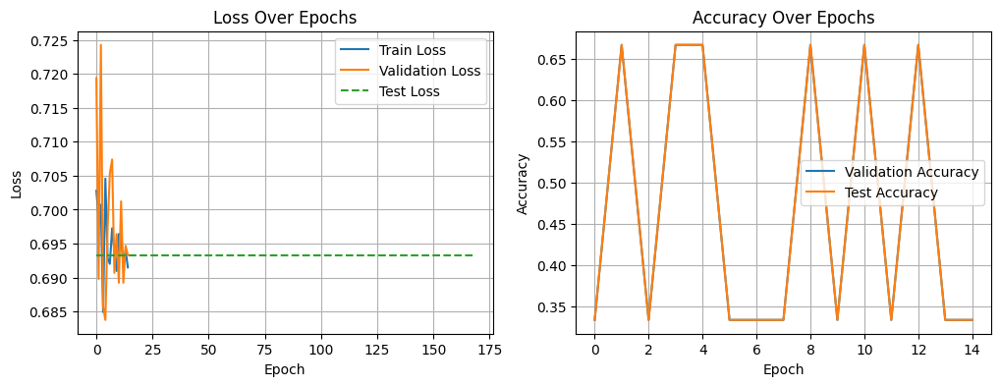

Hyperparameter Trials:  38%|███▊      | 38/100 [10:01<19:36, 18.98s/it]


🔁 Trial 39: hidden_dim=160, num_layers=3, lr=0.0001, batch_size=8, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.0001, batch_size=8, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6951, Val Loss: 0.6712, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6951, Val Loss: 0.6725, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6948, Val Loss: 0.6741, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6964, Val Loss: 0.6746, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6952, Val Loss: 0.6770, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6926, Val Loss: 0.6812, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6926, Val Loss: 0.6928, Val Acc: 0.6000, Test Acc: 0.5333
Epoch [8/50], Train Loss: 0.6946, Val Loss: 0.6928, Val Acc: 0.6000, Test Acc: 0.5333
Epoch [9/50], Train Loss: 

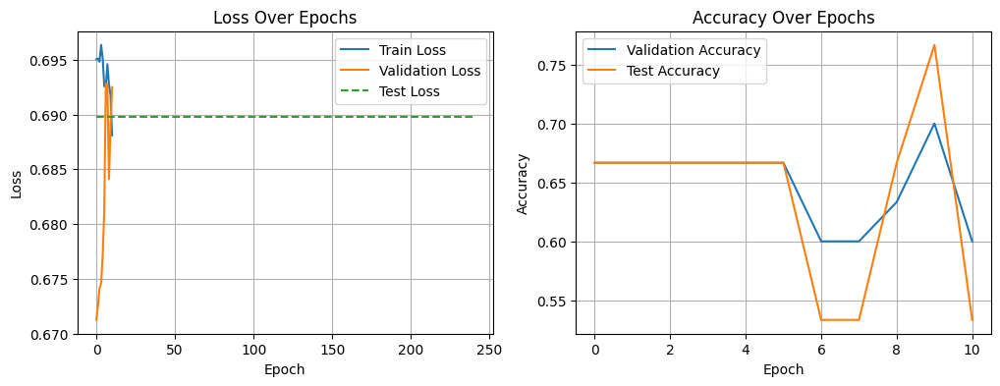

Hyperparameter Trials:  39%|███▉      | 39/100 [10:27<21:26, 21.08s/it]


🔁 Trial 40: hidden_dim=32, num_layers=3, lr=0.0001, batch_size=64, dropout=0.3
Debug - Parameters: hidden_dim=32, num_layers=3, learning_rate=0.0001, batch_size=64, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7003, Val Loss: 0.7275, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6978, Val Loss: 0.7272, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6996, Val Loss: 0.7269, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6961, Val Loss: 0.7266, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6982, Val Loss: 0.7262, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6985, Val Loss: 0.7259, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.7005, Val Loss: 0.7257, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6966, Val Loss: 0.7254, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

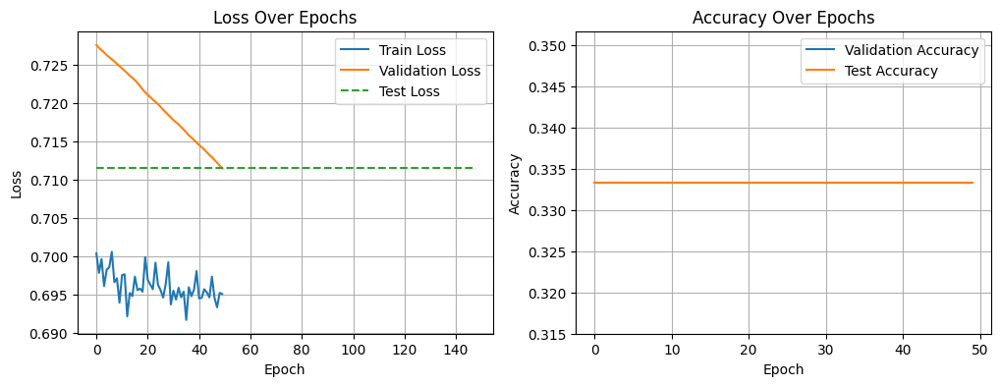

Hyperparameter Trials:  40%|████      | 40/100 [10:39<18:13, 18.22s/it]


🔁 Trial 41: hidden_dim=64, num_layers=2, lr=0.0001, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.0001, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6926, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6922, Val Loss: 0.6910, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6913, Val Loss: 0.6916, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6927, Val Loss: 0.6919, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6937, Val Loss: 0.6920, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6926, Val Loss: 0.6919, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6952, Val Loss: 0.6921, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6928, Val Loss: 0.6916, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

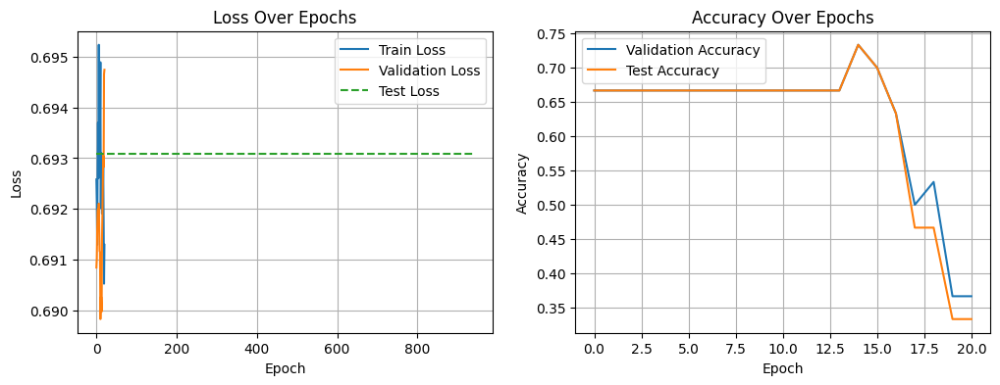

Hyperparameter Trials:  41%|████      | 41/100 [10:50<15:53, 16.16s/it]


🔁 Trial 42: hidden_dim=32, num_layers=2, lr=0.0001, batch_size=4, dropout=0.2
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.0001, batch_size=4, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6986, Val Loss: 0.7310, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6954, Val Loss: 0.7296, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6951, Val Loss: 0.7273, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6979, Val Loss: 0.7253, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6977, Val Loss: 0.7239, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6940, Val Loss: 0.7234, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6959, Val Loss: 0.7218, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6966, Val Loss: 0.7213, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.

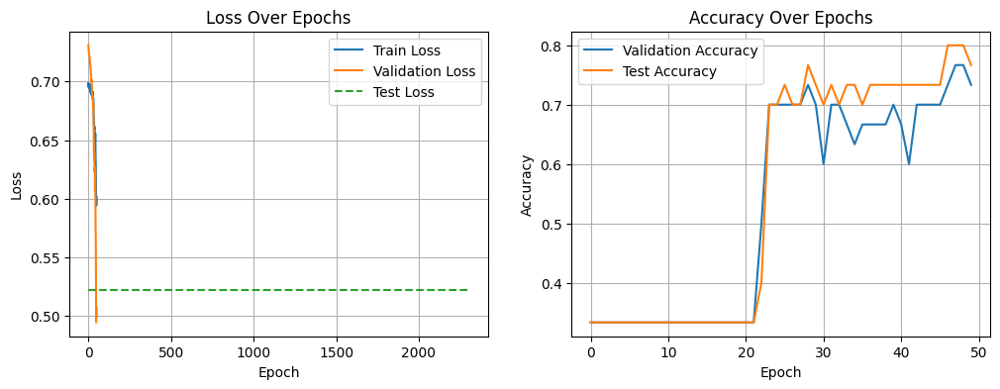

Hyperparameter Trials:  42%|████▏     | 42/100 [11:09<16:27, 17.03s/it]


🔁 Trial 43: hidden_dim=32, num_layers=2, lr=0.001, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.001, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6973, Val Loss: 0.6703, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6959, Val Loss: 0.6733, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6955, Val Loss: 0.6765, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6937, Val Loss: 0.6797, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6924, Val Loss: 0.6829, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6955, Val Loss: 0.6864, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6925, Val Loss: 0.6870, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6925, Val Loss: 0.6918, Val Acc: 0.6000, Test Acc: 0.6000
Epoch [9/50], Train Loss: 0.

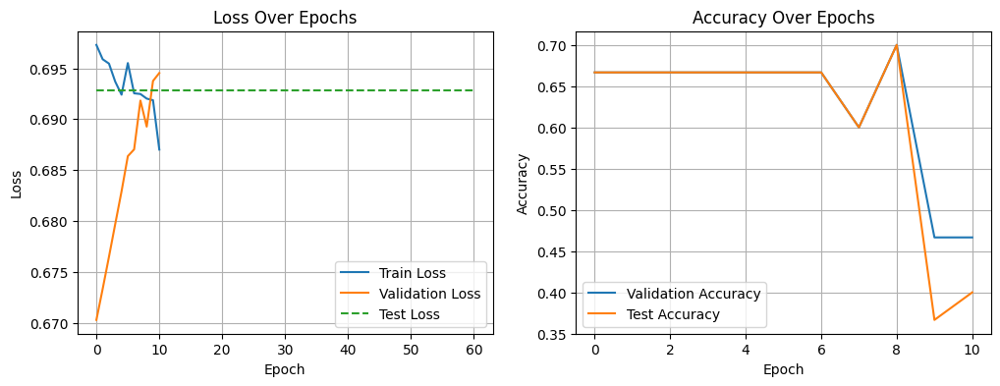

Hyperparameter Trials:  43%|████▎     | 43/100 [11:11<11:54, 12.54s/it]


🔁 Trial 44: hidden_dim=160, num_layers=2, lr=0.01, batch_size=64, dropout=0.3
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.01, batch_size=64, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6988, Val Loss: 0.7345, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.7030, Val Loss: 0.6741, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6940, Val Loss: 0.6809, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.7126, Val Loss: 0.6916, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6998, Val Loss: 0.7065, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6925, Val Loss: 0.6913, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6972, Val Loss: 0.6890, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6959, Val Loss: 0.6843, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

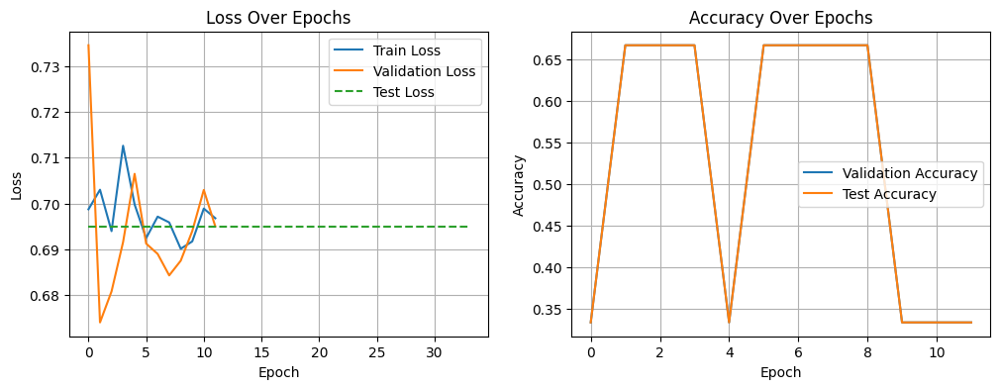

Hyperparameter Trials:  44%|████▍     | 44/100 [11:29<13:02, 13.98s/it]


🔁 Trial 45: hidden_dim=128, num_layers=2, lr=0.001, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=128, num_layers=2, learning_rate=0.001, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6946, Val Loss: 0.6834, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6945, Val Loss: 0.6814, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6938, Val Loss: 0.6829, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6917, Val Loss: 0.6863, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6899, Val Loss: 0.7062, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6861, Val Loss: 0.7037, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6870, Val Loss: 0.6958, Val Acc: 0.5667, Test Acc: 0.4667
Epoch [8/50], Train Loss: 0.7007, Val Loss: 0.6833, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [9/50], Train Loss: 

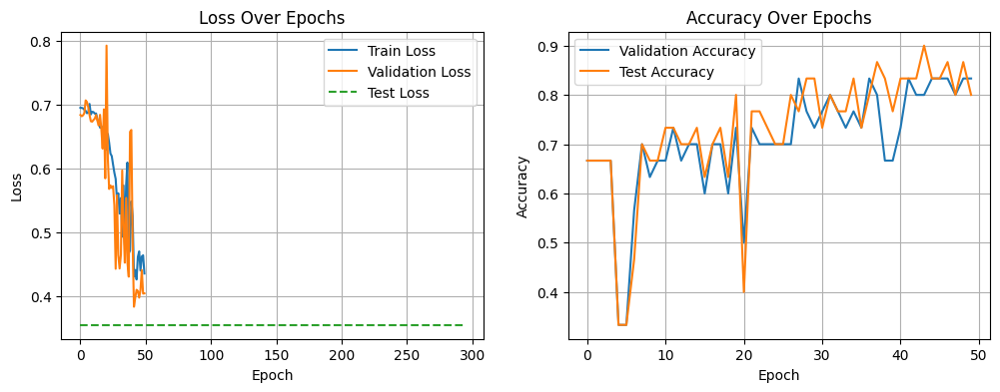

Hyperparameter Trials:  45%|████▌     | 45/100 [12:15<21:48, 23.79s/it]

✅ New Best Model at Trial 45 with Test Loss = 0.3545
✅ New Best Model at Trial 45 with Test Loss = 0.3545

🔁 Trial 46: hidden_dim=32, num_layers=2, lr=0.01, batch_size=32, dropout=0.2
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.01, batch_size=32, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6962, Val Loss: 0.6754, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6966, Val Loss: 0.7049, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6959, Val Loss: 0.7030, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6910, Val Loss: 0.6861, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6914, Val Loss: 0.6885, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [6/50], Train Loss: 0.6885, Val Loss: 0.6712, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6907, Val Loss: 0.8355, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/5

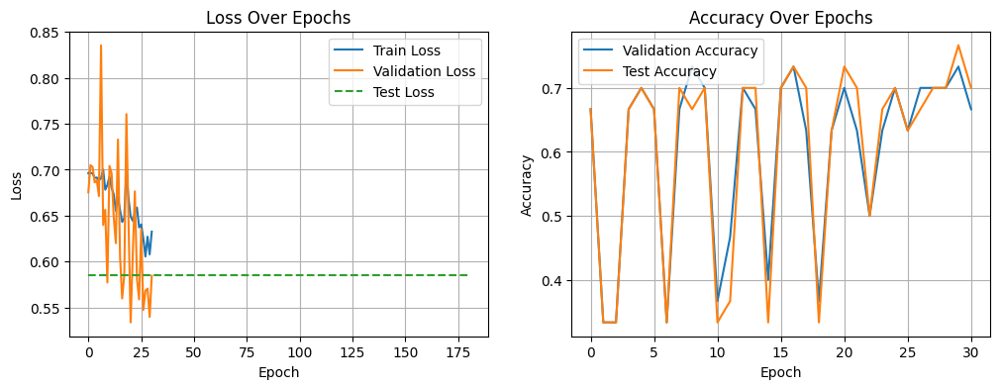

Hyperparameter Trials:  46%|████▌     | 46/100 [12:22<16:46, 18.64s/it]


🔁 Trial 47: hidden_dim=128, num_layers=3, lr=0.001, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.001, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6964, Val Loss: 0.6864, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6941, Val Loss: 0.6896, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6934, Val Loss: 0.6897, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6933, Val Loss: 0.6897, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6933, Val Loss: 0.6903, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6933, Val Loss: 0.6909, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6933, Val Loss: 0.6906, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6934, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6864, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6922, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


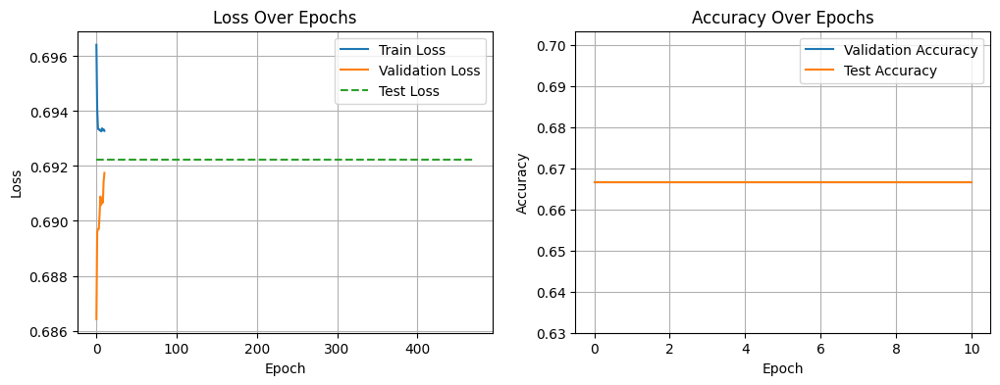

Hyperparameter Trials:  47%|████▋     | 47/100 [12:42<16:53, 19.11s/it]


🔁 Trial 48: hidden_dim=32, num_layers=2, lr=0.001, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.001, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6946, Val Loss: 0.7091, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6933, Val Loss: 0.7048, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6935, Val Loss: 0.7042, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6940, Val Loss: 0.7010, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6937, Val Loss: 0.7013, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6930, Val Loss: 0.6971, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6914, Val Loss: 0.6922, Val Acc: 0.6000, Test Acc: 0.5000
Epoch [8/50], Train Loss: 0.6846, Val Loss: 0.6498, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

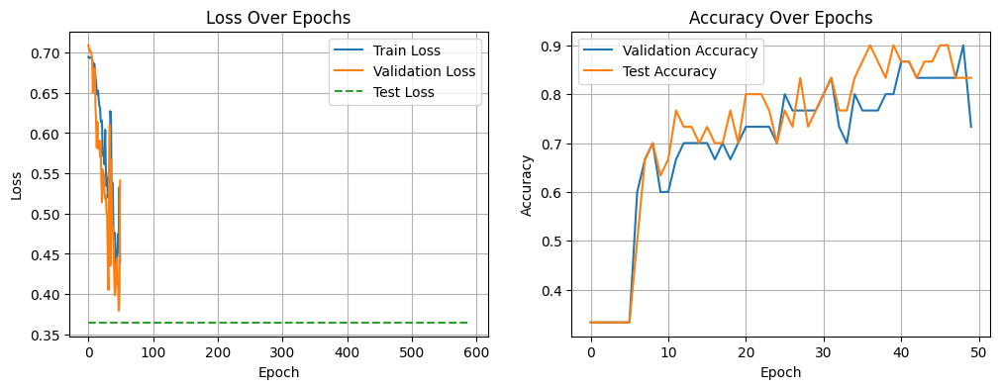

Hyperparameter Trials:  48%|████▊     | 48/100 [12:53<14:22, 16.59s/it]


🔁 Trial 49: hidden_dim=64, num_layers=2, lr=0.0001, batch_size=64, dropout=0.2
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.0001, batch_size=64, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6933, Val Loss: 0.6912, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6931, Val Loss: 0.6912, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6942, Val Loss: 0.6913, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6938, Val Loss: 0.6913, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6930, Val Loss: 0.6913, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6937, Val Loss: 0.6914, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6929, Val Loss: 0.6914, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6930, Val Loss: 0.6915, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


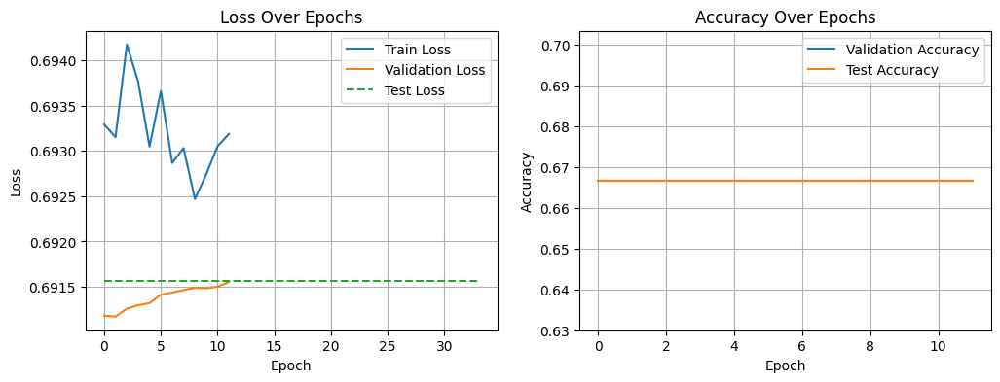

Hyperparameter Trials:  49%|████▉     | 49/100 [12:57<11:00, 12.96s/it]


🔁 Trial 50: hidden_dim=64, num_layers=3, lr=0.0001, batch_size=16, dropout=0.2
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.0001, batch_size=16, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6928, Val Loss: 0.7000, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6934, Val Loss: 0.6999, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6928, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6937, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6930, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6943, Val Loss: 0.6996, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6931, Val Loss: 0.6994, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6932, Val Loss: 0.6995, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

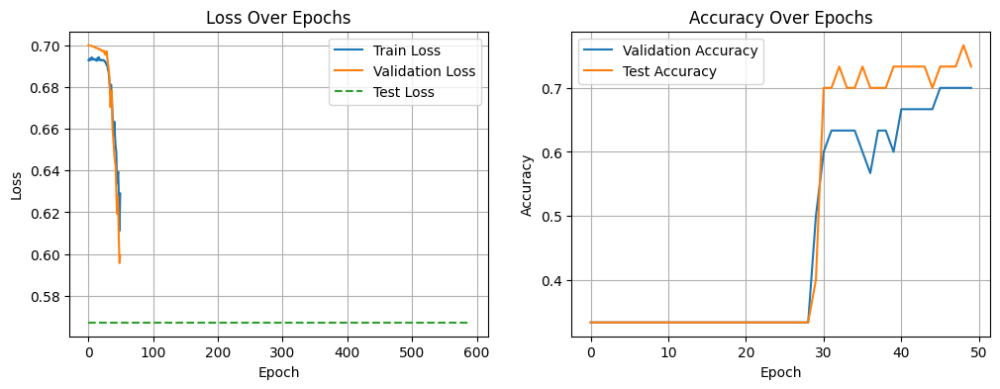

Hyperparameter Trials:  50%|█████     | 50/100 [13:26<14:45, 17.71s/it]


🔁 Trial 51: hidden_dim=64, num_layers=2, lr=0.001, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.001, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6955, Val Loss: 0.7118, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6950, Val Loss: 0.7074, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6940, Val Loss: 0.7031, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6932, Val Loss: 0.6993, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6936, Val Loss: 0.6977, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6932, Val Loss: 0.6964, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6925, Val Loss: 0.6942, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6915, Val Loss: 0.6916, Val Acc: 0.6667, Test Acc: 0.7000
Epoch [9/50], Train Loss: 0.

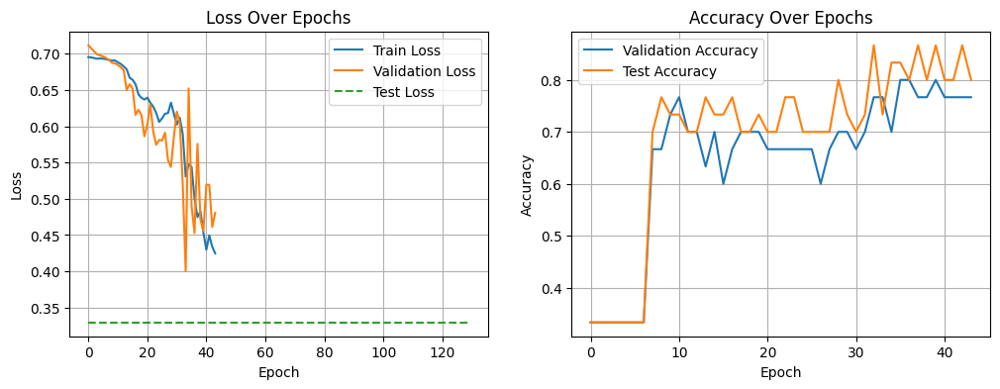

Hyperparameter Trials:  51%|█████     | 51/100 [13:43<14:10, 17.35s/it]

✅ New Best Model at Trial 51 with Test Loss = 0.3296
✅ New Best Model at Trial 51 with Test Loss = 0.3296

🔁 Trial 52: hidden_dim=32, num_layers=2, lr=0.0001, batch_size=8, dropout=0.1
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.0001, batch_size=8, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6940, Val Loss: 0.7157, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6970, Val Loss: 0.7154, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6966, Val Loss: 0.7146, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6943, Val Loss: 0.7134, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6963, Val Loss: 0.7129, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6924, Val Loss: 0.7120, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6958, Val Loss: 0.7121, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8

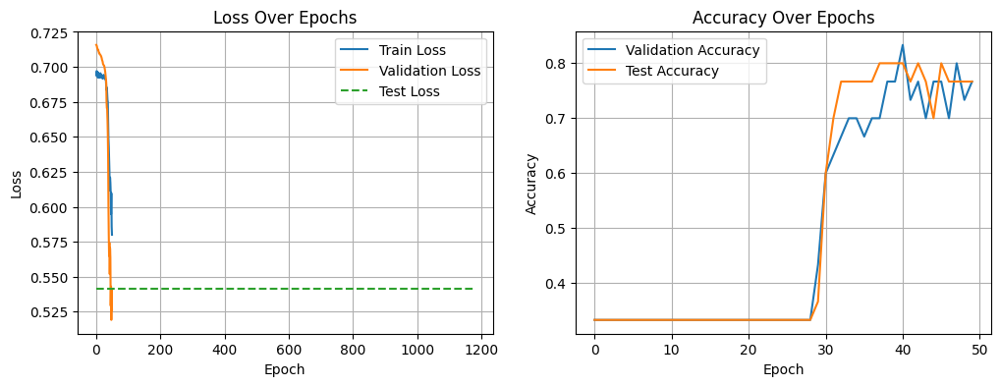

Hyperparameter Trials:  52%|█████▏    | 52/100 [13:57<13:01, 16.28s/it]


🔁 Trial 53: hidden_dim=128, num_layers=3, lr=0.001, batch_size=8, dropout=0.2
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.001, batch_size=8, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6940, Val Loss: 0.6922, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6944, Val Loss: 0.6949, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6927, Val Loss: 0.6948, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6912, Val Loss: 0.6977, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6953, Val Loss: 0.7029, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.7108, Val Loss: 0.6861, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6921, Val Loss: 0.7123, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.7004, Val Loss: 0.6965, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.

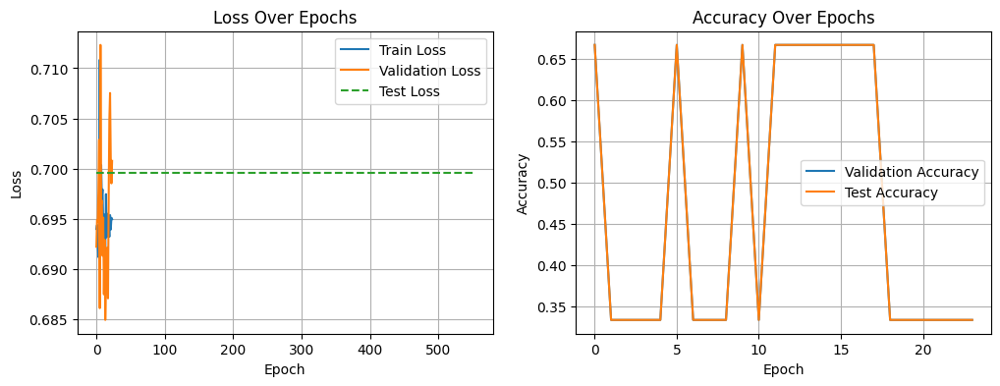

Hyperparameter Trials:  53%|█████▎    | 53/100 [14:36<18:18, 23.36s/it]


🔁 Trial 54: hidden_dim=32, num_layers=2, lr=0.001, batch_size=4, dropout=0.2
Debug - Parameters: hidden_dim=32, num_layers=2, learning_rate=0.001, batch_size=4, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6965, Val Loss: 0.7121, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6950, Val Loss: 0.7018, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6953, Val Loss: 0.7021, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6924, Val Loss: 0.6806, Val Acc: 0.6667, Test Acc: 0.7000
Epoch [5/50], Train Loss: 0.7007, Val Loss: 0.6993, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6933, Val Loss: 0.7038, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6910, Val Loss: 0.6958, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6794, Val Loss: 0.6673, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [9/50], Train Loss: 0.66

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


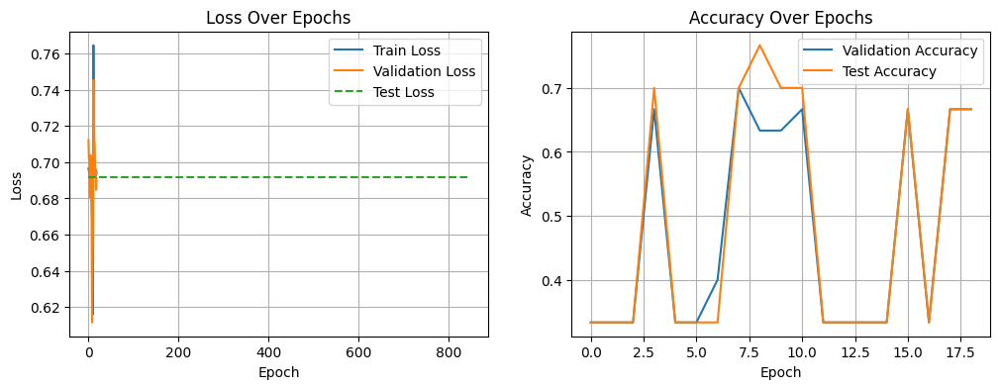

Hyperparameter Trials:  54%|█████▍    | 54/100 [14:43<14:08, 18.44s/it]


🔁 Trial 55: hidden_dim=96, num_layers=3, lr=0.001, batch_size=32, dropout=0.3
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.001, batch_size=32, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6933, Val Loss: 0.7095, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6928, Val Loss: 0.7053, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6947, Val Loss: 0.7027, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6931, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6926, Val Loss: 0.6970, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6925, Val Loss: 0.6938, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6914, Val Loss: 0.6930, Val Acc: 0.5667, Test Acc: 0.4667
Epoch [8/50], Train Loss: 0.6926, Val Loss: 0.6928, Val Acc: 0.5667, Test Acc: 0.4667
Epoch [9/50], Train Loss: 0.

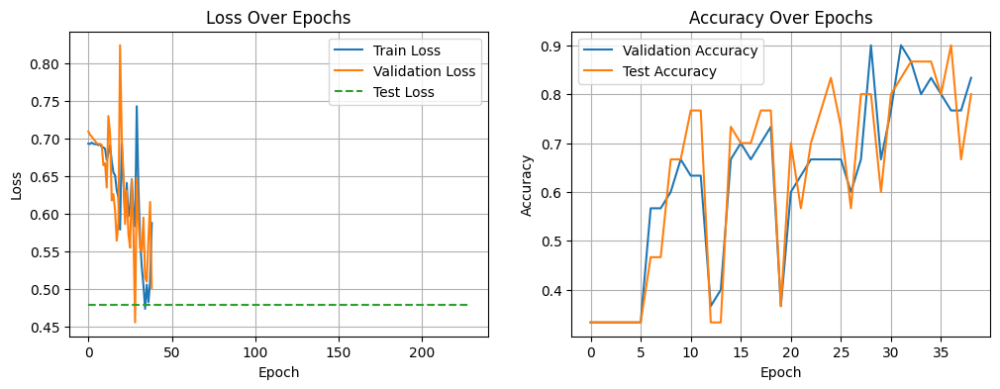

Hyperparameter Trials:  55%|█████▌    | 55/100 [15:20<17:54, 23.88s/it]


🔁 Trial 56: hidden_dim=160, num_layers=3, lr=0.0001, batch_size=8, dropout=0.2
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.0001, batch_size=8, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6959, Val Loss: 0.6707, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6954, Val Loss: 0.6738, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6943, Val Loss: 0.6753, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6941, Val Loss: 0.6761, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6924, Val Loss: 0.6790, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6930, Val Loss: 0.6803, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6935, Val Loss: 0.6799, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6930, Val Loss: 0.6790, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

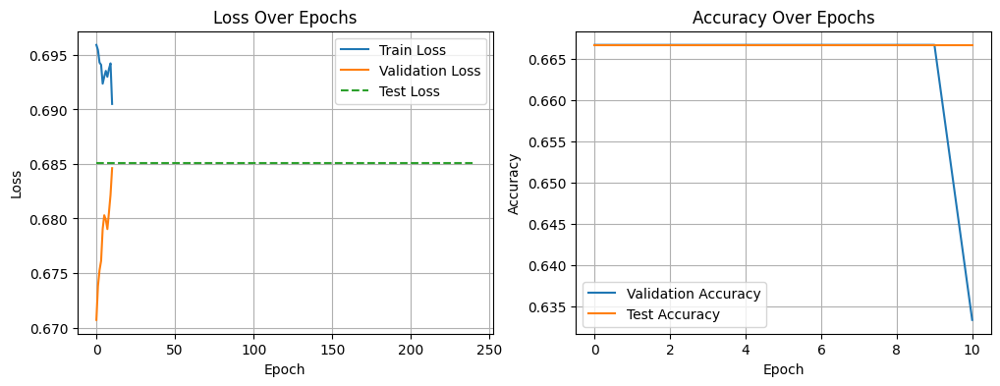

Hyperparameter Trials:  56%|█████▌    | 56/100 [15:46<17:57, 24.49s/it]


🔁 Trial 57: hidden_dim=64, num_layers=2, lr=0.01, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.01, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6958, Val Loss: 0.7002, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6940, Val Loss: 0.6948, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6936, Val Loss: 0.6931, Val Acc: 0.5000, Test Acc: 0.4333
Epoch [4/50], Train Loss: 0.6927, Val Loss: 0.6935, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6933, Val Loss: 0.6882, Val Acc: 0.6333, Test Acc: 0.7667
Epoch [6/50], Train Loss: 0.6906, Val Loss: 0.6806, Val Acc: 0.7000, Test Acc: 0.7333
Epoch [7/50], Train Loss: 0.6857, Val Loss: 0.6563, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [8/50], Train Loss: 0.6757, Val Loss: 0.6089, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [9/50], Train Loss: 0.64

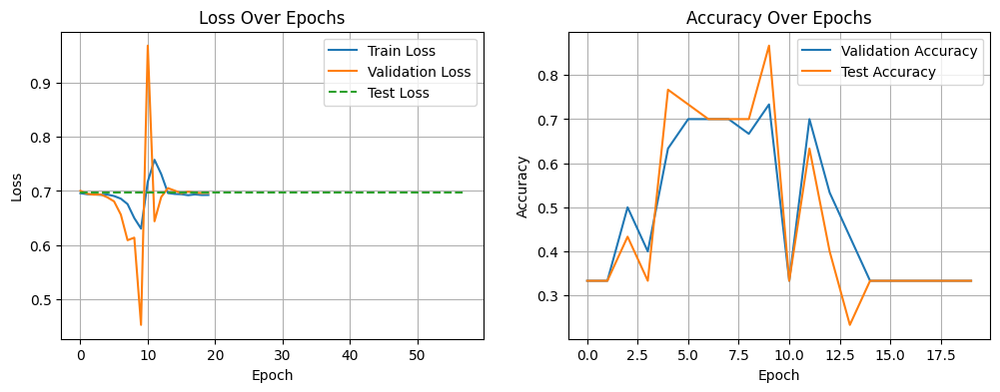

Hyperparameter Trials:  57%|█████▋    | 57/100 [15:53<13:50, 19.31s/it]


🔁 Trial 58: hidden_dim=96, num_layers=2, lr=0.0001, batch_size=64, dropout=0.2
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.0001, batch_size=64, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6935, Val Loss: 0.6965, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6927, Val Loss: 0.6964, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6936, Val Loss: 0.6964, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6938, Val Loss: 0.6963, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6934, Val Loss: 0.6963, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6941, Val Loss: 0.6963, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6935, Val Loss: 0.6963, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6930, Val Loss: 0.6963, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

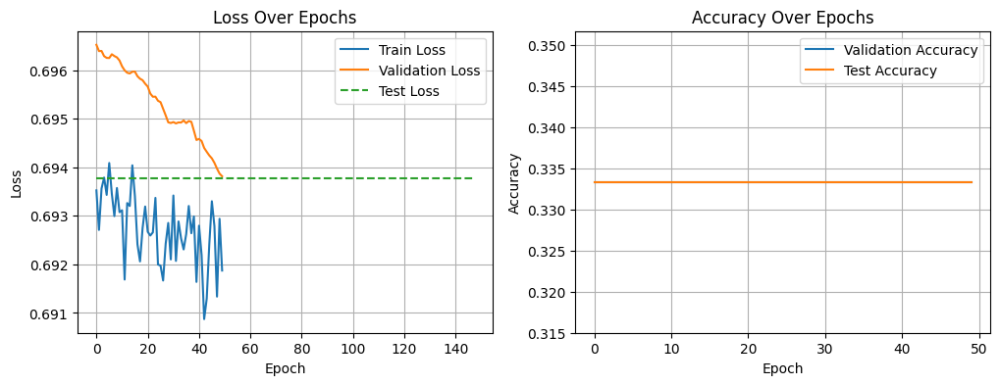

Hyperparameter Trials:  58%|█████▊    | 58/100 [16:28<16:47, 23.98s/it]


🔁 Trial 59: hidden_dim=160, num_layers=2, lr=0.0001, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.0001, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6986, Val Loss: 0.6620, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6994, Val Loss: 0.6622, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6996, Val Loss: 0.6625, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6989, Val Loss: 0.6628, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6995, Val Loss: 0.6630, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6988, Val Loss: 0.6632, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6987, Val Loss: 0.6635, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6987, Val Loss: 0.6638, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


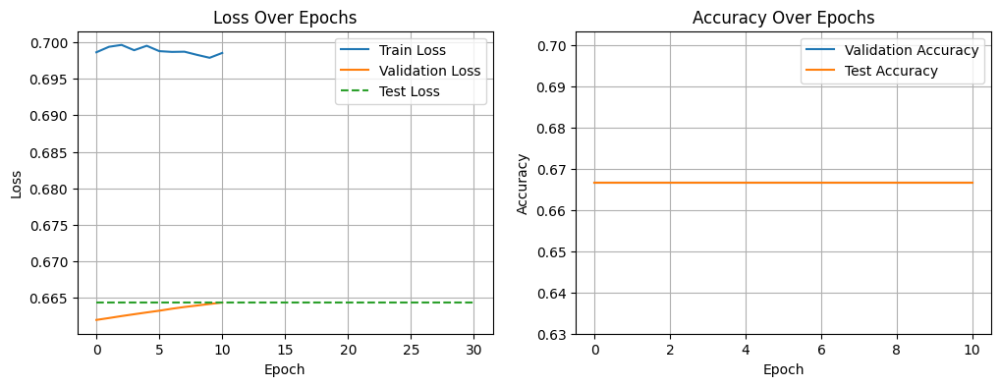

Hyperparameter Trials:  59%|█████▉    | 59/100 [16:44<14:48, 21.68s/it]


🔁 Trial 60: hidden_dim=64, num_layers=2, lr=0.01, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.01, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6978, Val Loss: 0.6920, Val Acc: 0.6000, Test Acc: 0.6333
Epoch [2/50], Train Loss: 0.6981, Val Loss: 0.6889, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6939, Val Loss: 0.6806, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6956, Val Loss: 0.6823, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6942, Val Loss: 0.6913, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6943, Val Loss: 0.6948, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6937, Val Loss: 0.6909, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6938, Val Loss: 0.6955, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.7001

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


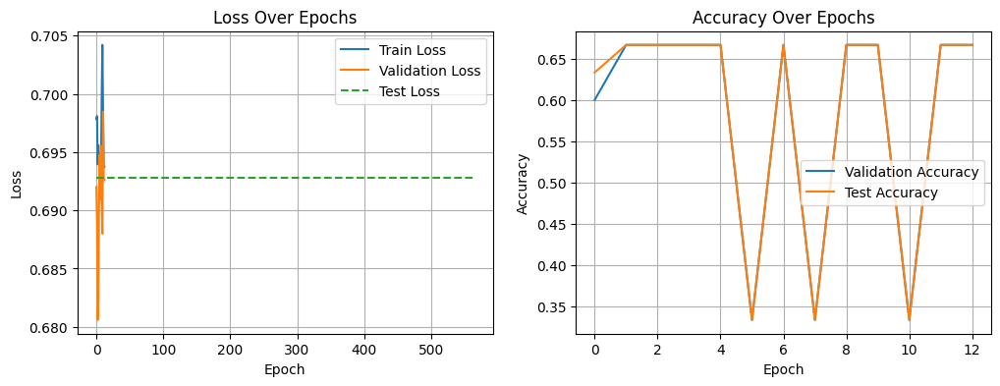

Hyperparameter Trials:  60%|██████    | 60/100 [16:51<11:32, 17.31s/it]


🔁 Trial 61: hidden_dim=64, num_layers=3, lr=0.0001, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.0001, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6974, Val Loss: 0.7304, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6975, Val Loss: 0.7298, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6981, Val Loss: 0.7294, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6980, Val Loss: 0.7289, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6967, Val Loss: 0.7285, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6964, Val Loss: 0.7280, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6968, Val Loss: 0.7276, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6978, Val Loss: 0.7273, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

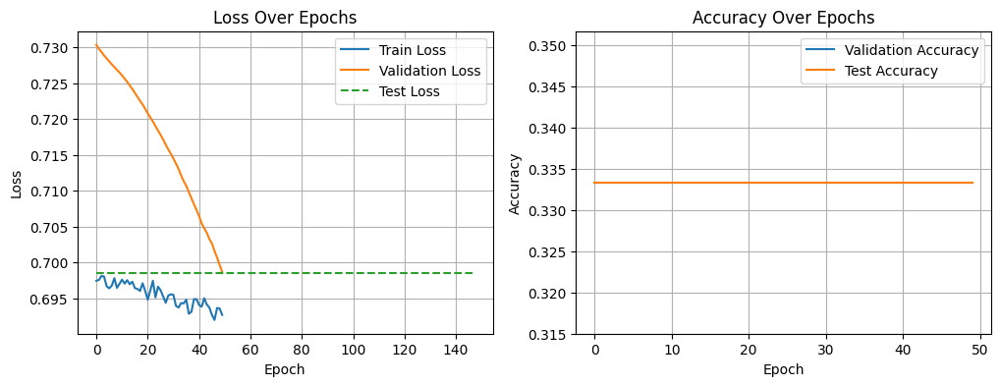

Hyperparameter Trials:  61%|██████    | 61/100 [17:23<13:58, 21.49s/it]


🔁 Trial 62: hidden_dim=160, num_layers=2, lr=0.01, batch_size=4, dropout=0.2
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.01, batch_size=4, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7101, Val Loss: 0.7051, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6984, Val Loss: 0.6996, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6982, Val Loss: 0.6943, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6943, Val Loss: 0.7006, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6940, Val Loss: 0.6984, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6945, Val Loss: 0.6960, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6941, Val Loss: 0.6940, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6934, Val Loss: 0.6944, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.69

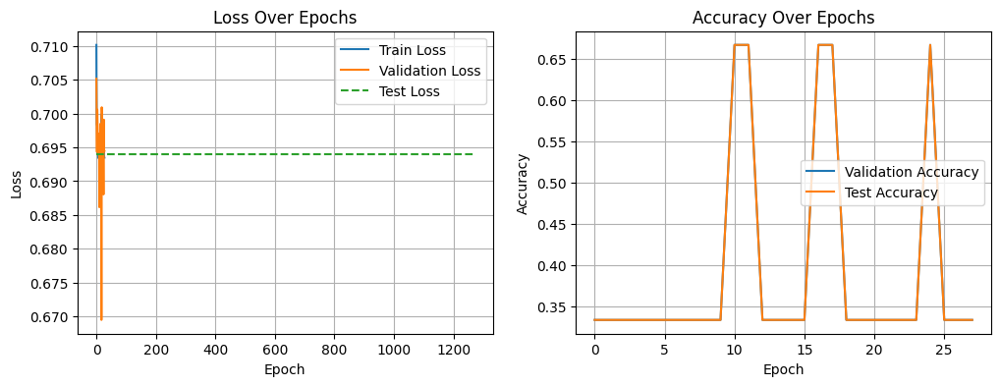

Hyperparameter Trials:  62%|██████▏   | 62/100 [18:10<18:31, 29.24s/it]


🔁 Trial 63: hidden_dim=160, num_layers=3, lr=0.001, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.001, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6940, Val Loss: 0.6849, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6942, Val Loss: 0.6911, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6932, Val Loss: 0.6894, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6942, Val Loss: 0.6860, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6930, Val Loss: 0.6924, Val Acc: 0.6333, Test Acc: 0.6333
Epoch [6/50], Train Loss: 0.6949, Val Loss: 0.6982, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6890, Val Loss: 0.6619, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6891, Val Loss: 0.7101, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6262, Accuracy: 0.6667, Precision: 0.5000, Recall: 0.1000, F1: 0.1667
Best Model - Test: Loss: 0.6910, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


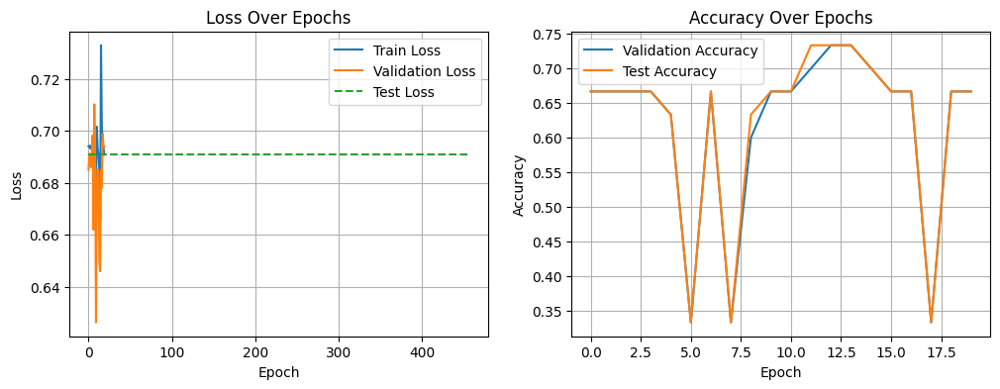

Hyperparameter Trials:  63%|██████▎   | 63/100 [18:56<21:05, 34.21s/it]


🔁 Trial 64: hidden_dim=96, num_layers=2, lr=0.001, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.001, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6969, Val Loss: 0.6798, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6939, Val Loss: 0.6816, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6934, Val Loss: 0.6882, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6931, Val Loss: 0.6893, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [5/50], Train Loss: 0.6913, Val Loss: 0.6960, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6894, Val Loss: 0.7045, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6871, Val Loss: 0.7024, Val Acc: 0.3667, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6874, Val Loss: 0.6816, Val Acc: 0.7333, Test Acc: 0.7333
Epoch [9/50], Train Loss: 0.

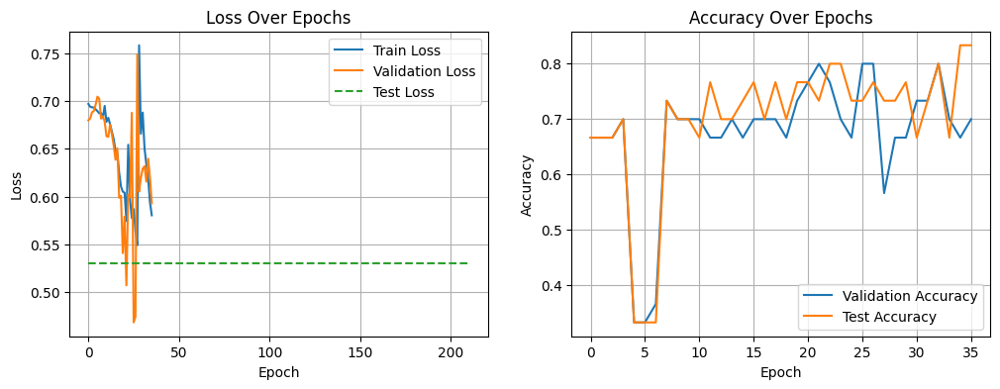

Hyperparameter Trials:  64%|██████▍   | 64/100 [19:17<18:13, 30.37s/it]


🔁 Trial 65: hidden_dim=96, num_layers=3, lr=0.001, batch_size=4, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.001, batch_size=4, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6933, Val Loss: 0.6899, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6941, Val Loss: 0.6889, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6954, Val Loss: 0.6956, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.7016, Val Loss: 0.6942, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6940, Val Loss: 0.6947, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6934, Val Loss: 0.6948, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6931, Val Loss: 0.6949, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6933, Val Loss: 0.6954, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.69

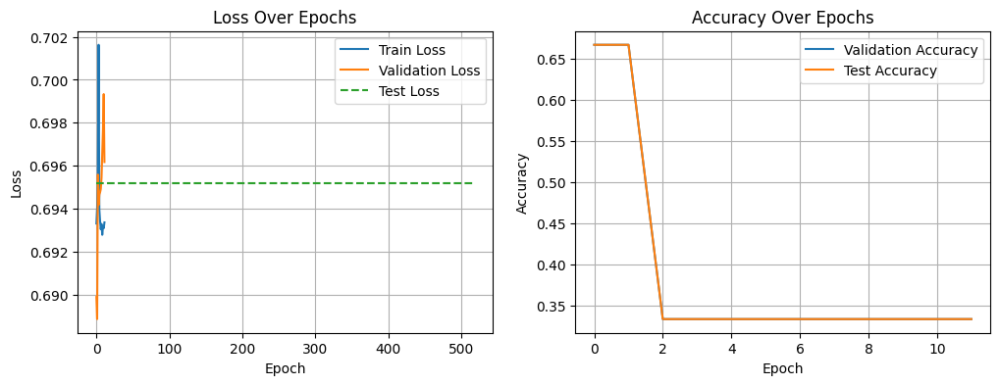

Hyperparameter Trials:  65%|██████▌   | 65/100 [19:33<15:15, 26.16s/it]


🔁 Trial 66: hidden_dim=128, num_layers=2, lr=0.0001, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=128, num_layers=2, learning_rate=0.0001, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6942, Val Loss: 0.6858, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6936, Val Loss: 0.6860, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6935, Val Loss: 0.6862, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6932, Val Loss: 0.6862, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6932, Val Loss: 0.6863, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6930, Val Loss: 0.6864, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6928, Val Loss: 0.6866, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6927, Val Loss: 0.6867, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


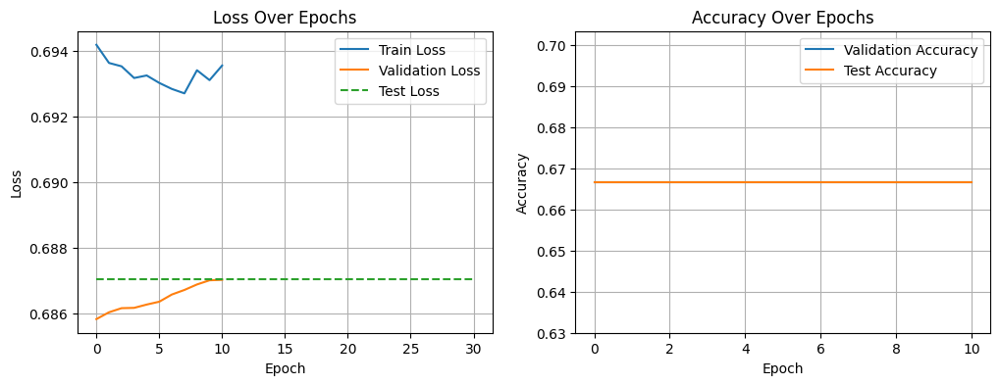

Hyperparameter Trials:  66%|██████▌   | 66/100 [19:45<12:19, 21.76s/it]


🔁 Trial 67: hidden_dim=160, num_layers=3, lr=0.0001, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.0001, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6985, Val Loss: 0.6662, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6960, Val Loss: 0.6674, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6965, Val Loss: 0.6680, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6968, Val Loss: 0.6687, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6966, Val Loss: 0.6696, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6961, Val Loss: 0.6700, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6949, Val Loss: 0.6705, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6963, Val Loss: 0.6714, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6662, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6758, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


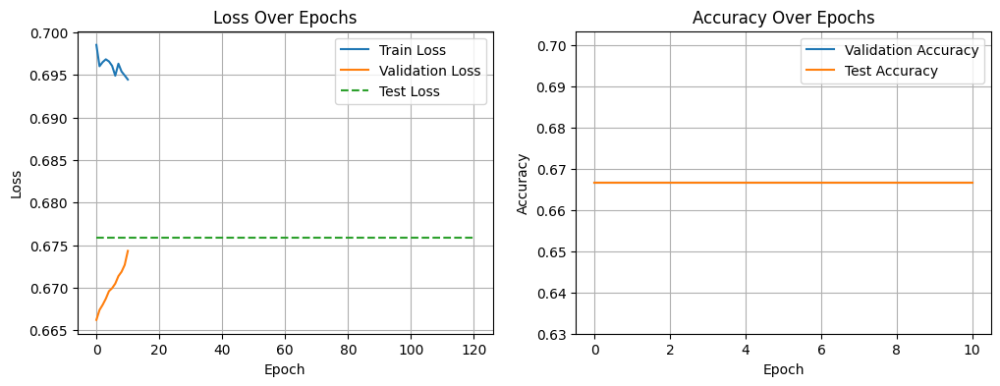

Hyperparameter Trials:  67%|██████▋   | 67/100 [20:09<12:18, 22.39s/it]


🔁 Trial 68: hidden_dim=64, num_layers=3, lr=0.001, batch_size=8, dropout=0.2
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.001, batch_size=8, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6963, Val Loss: 0.7137, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6936, Val Loss: 0.7081, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6950, Val Loss: 0.7012, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6968, Val Loss: 0.7030, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6930, Val Loss: 0.7005, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6891, Val Loss: 0.6925, Val Acc: 0.5333, Test Acc: 0.4667
Epoch [7/50], Train Loss: 0.6900, Val Loss: 0.6776, Val Acc: 0.6333, Test Acc: 0.7000
Epoch [8/50], Train Loss: 0.6688, Val Loss: 0.6609, Val Acc: 0.5667, Test Acc: 0.4667
Epoch [9/50], Train Loss: 0.66

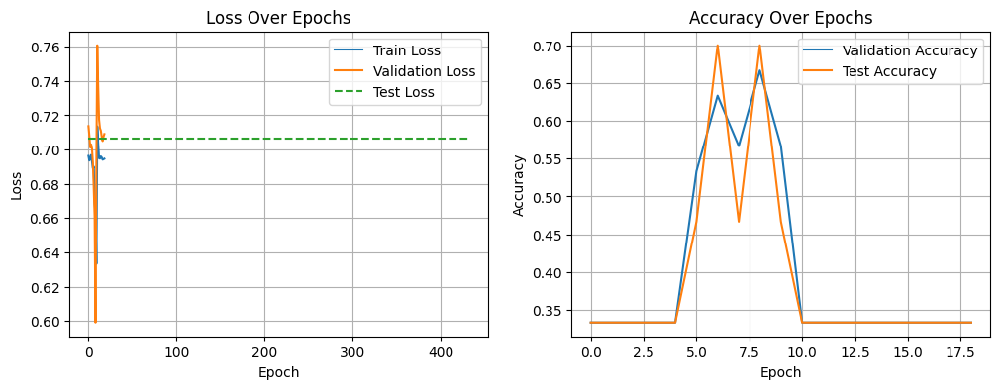

Hyperparameter Trials:  68%|██████▊   | 68/100 [20:22<10:30, 19.70s/it]


🔁 Trial 69: hidden_dim=160, num_layers=3, lr=0.01, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.01, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6993, Val Loss: 0.6964, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6942, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6932, Val Loss: 0.7017, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6930, Val Loss: 0.6940, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6877, Val Loss: 0.7074, Val Acc: 0.3000, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6975, Val Loss: 0.6921, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6968, Val Loss: 0.6868, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6953, Val Loss: 0.6915, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

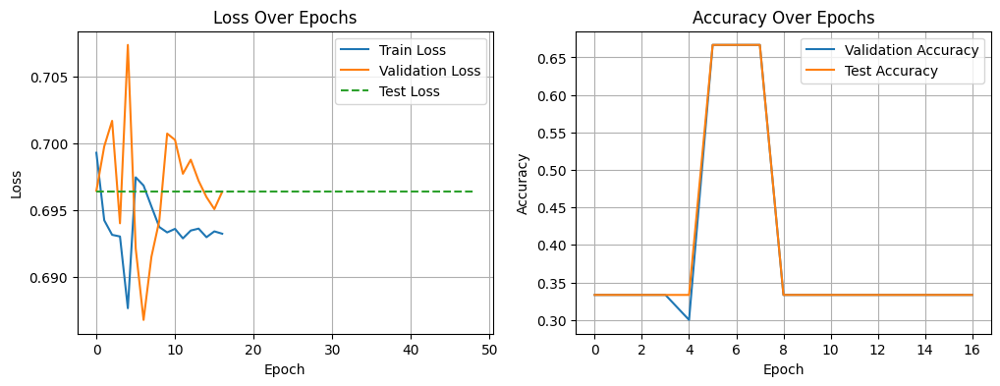

Hyperparameter Trials:  69%|██████▉   | 69/100 [21:02<13:14, 25.64s/it]


🔁 Trial 70: hidden_dim=160, num_layers=3, lr=0.01, batch_size=4, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.01, batch_size=4, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7097, Val Loss: 0.7385, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6963, Val Loss: 0.7180, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6945, Val Loss: 0.7095, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6939, Val Loss: 0.6999, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6937, Val Loss: 0.6957, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6941, Val Loss: 0.6959, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6953, Val Loss: 0.6914, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6941, Val Loss: 0.6875, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6875, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6927, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


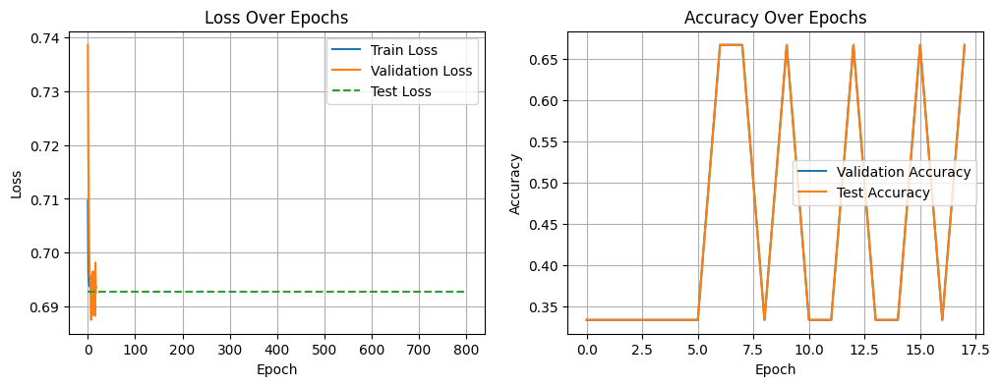

Hyperparameter Trials:  70%|███████   | 70/100 [21:49<16:04, 32.16s/it]


🔁 Trial 71: hidden_dim=96, num_layers=2, lr=0.0001, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.0001, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6945, Val Loss: 0.6818, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6937, Val Loss: 0.6820, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6934, Val Loss: 0.6821, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6926, Val Loss: 0.6823, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6926, Val Loss: 0.6825, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6936, Val Loss: 0.6827, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6929, Val Loss: 0.6829, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6944, Val Loss: 0.6831, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


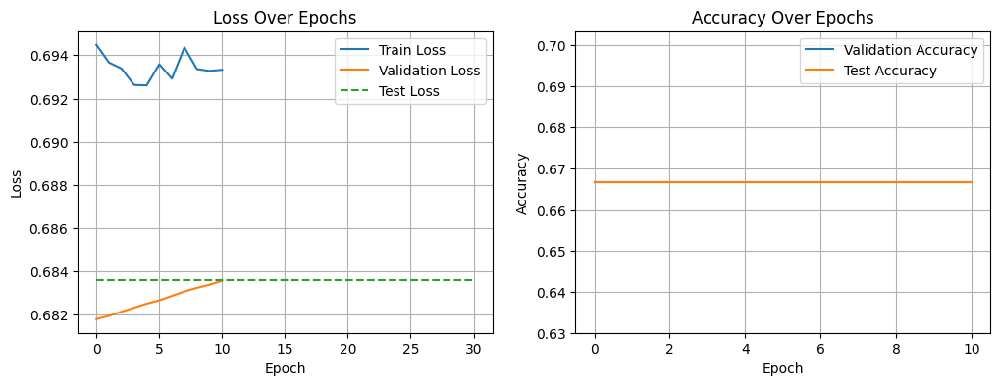

Hyperparameter Trials:  71%|███████   | 71/100 [21:57<12:03, 24.96s/it]


🔁 Trial 72: hidden_dim=96, num_layers=3, lr=0.01, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.01, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6990, Val Loss: 0.6858, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6950, Val Loss: 0.6963, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6934, Val Loss: 0.6871, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6947, Val Loss: 0.6851, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6939, Val Loss: 0.6874, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6931, Val Loss: 0.6943, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6937, Val Loss: 0.6917, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6930, Val Loss: 0.6973, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.6941

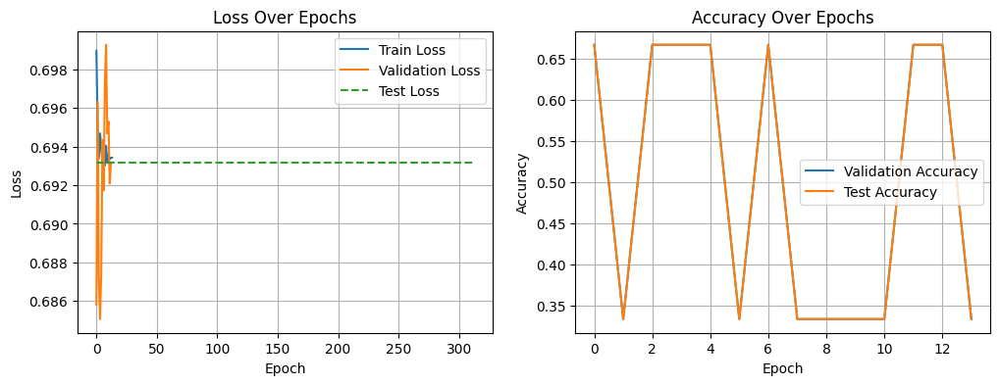

Hyperparameter Trials:  72%|███████▏  | 72/100 [22:13<10:24, 22.30s/it]


🔁 Trial 73: hidden_dim=96, num_layers=2, lr=0.01, batch_size=16, dropout=0.3
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.01, batch_size=16, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6966, Val Loss: 0.7033, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6992, Val Loss: 0.6851, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6928, Val Loss: 0.7154, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6914, Val Loss: 0.6786, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [5/50], Train Loss: 0.7053, Val Loss: 0.7093, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.7013, Val Loss: 0.6807, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6861, Val Loss: 0.6694, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6973, Val Loss: 0.7002, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.69

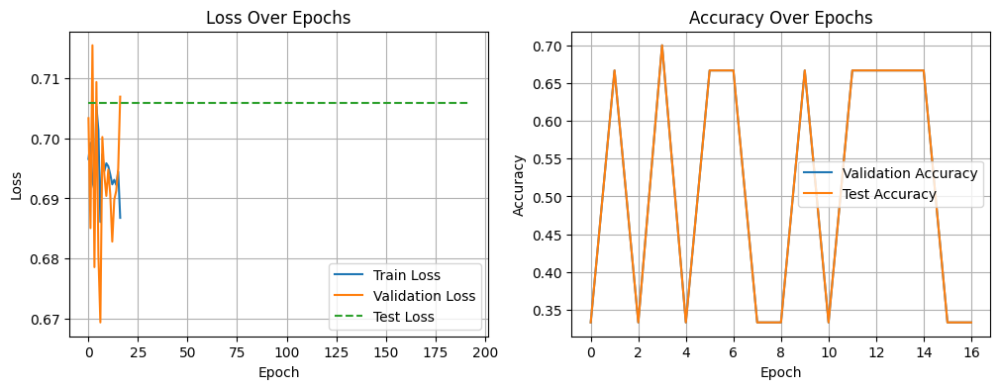

Hyperparameter Trials:  73%|███████▎  | 73/100 [22:24<08:24, 18.70s/it]


🔁 Trial 74: hidden_dim=128, num_layers=3, lr=0.0001, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.0001, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6947, Val Loss: 0.7055, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6952, Val Loss: 0.7043, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6939, Val Loss: 0.7028, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6934, Val Loss: 0.7036, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6926, Val Loss: 0.7028, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6927, Val Loss: 0.7001, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6953, Val Loss: 0.7005, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6919, Val Loss: 0.6992, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

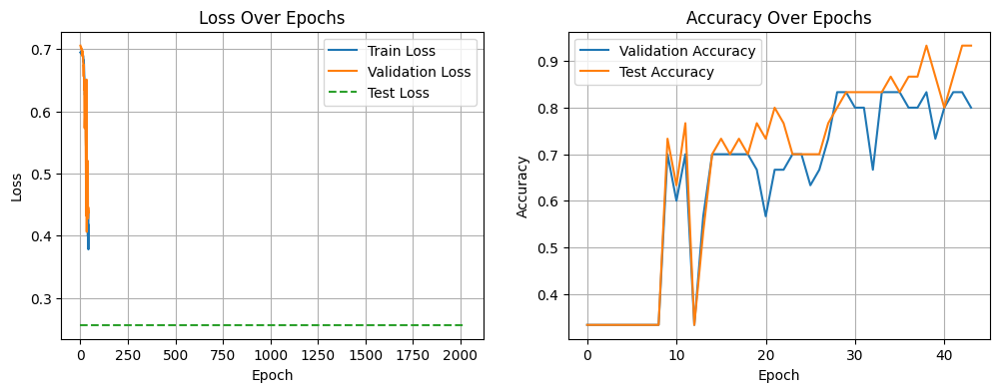

Hyperparameter Trials:  74%|███████▍  | 74/100 [23:44<16:09, 37.28s/it]

✅ New Best Model at Trial 74 with Test Loss = 0.2568
✅ New Best Model at Trial 74 with Test Loss = 0.2568

🔁 Trial 75: hidden_dim=128, num_layers=3, lr=0.0001, batch_size=4, dropout=0.2
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.0001, batch_size=4, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6972, Val Loss: 0.6617, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6968, Val Loss: 0.6620, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6987, Val Loss: 0.6624, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6964, Val Loss: 0.6630, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6964, Val Loss: 0.6632, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6963, Val Loss: 0.6634, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6982, Val Loss: 0.6634, Val Acc: 0.6667, Test Acc: 0.6667
Epoch 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))



Best Model - Validation: Loss: 0.6617, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000
Best Model - Test: Loss: 0.6750, Accuracy: 0.6667, Precision: 0.0000, Recall: 0.0000, F1: 0.0000


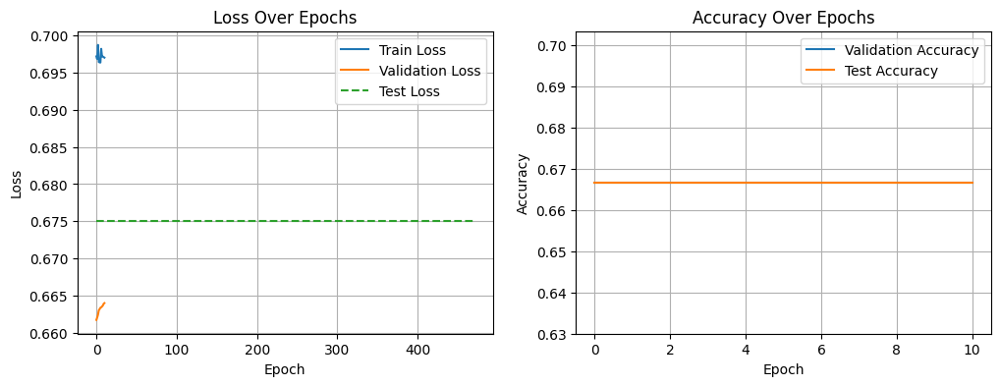

Hyperparameter Trials:  75%|███████▌  | 75/100 [24:05<13:27, 32.30s/it]


🔁 Trial 76: hidden_dim=64, num_layers=3, lr=0.0001, batch_size=32, dropout=0.3
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.0001, batch_size=32, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6940, Val Loss: 0.7014, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6930, Val Loss: 0.7013, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6937, Val Loss: 0.7013, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6925, Val Loss: 0.7011, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6932, Val Loss: 0.7010, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6936, Val Loss: 0.7009, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6939, Val Loss: 0.7010, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6934, Val Loss: 0.7010, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

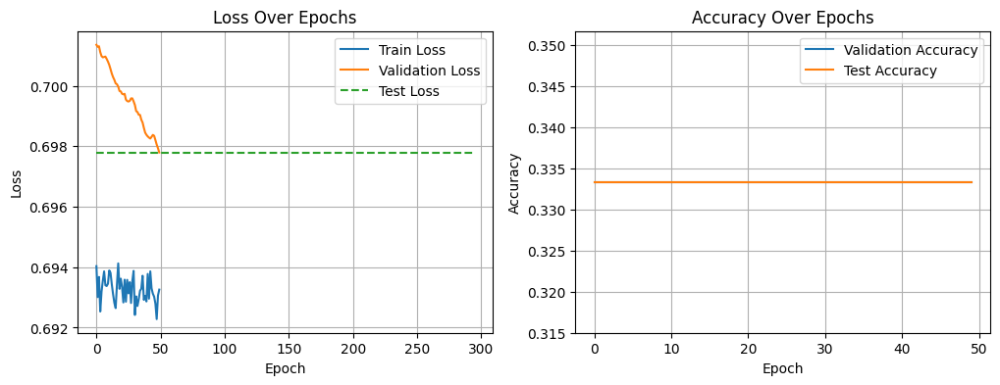

Hyperparameter Trials:  76%|███████▌  | 76/100 [24:32<12:19, 30.79s/it]


🔁 Trial 77: hidden_dim=128, num_layers=2, lr=0.0001, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=128, num_layers=2, learning_rate=0.0001, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6982, Val Loss: 0.7291, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6978, Val Loss: 0.7274, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6968, Val Loss: 0.7251, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6971, Val Loss: 0.7225, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6970, Val Loss: 0.7201, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6952, Val Loss: 0.7170, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6956, Val Loss: 0.7170, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6957, Val Loss: 0.7159, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

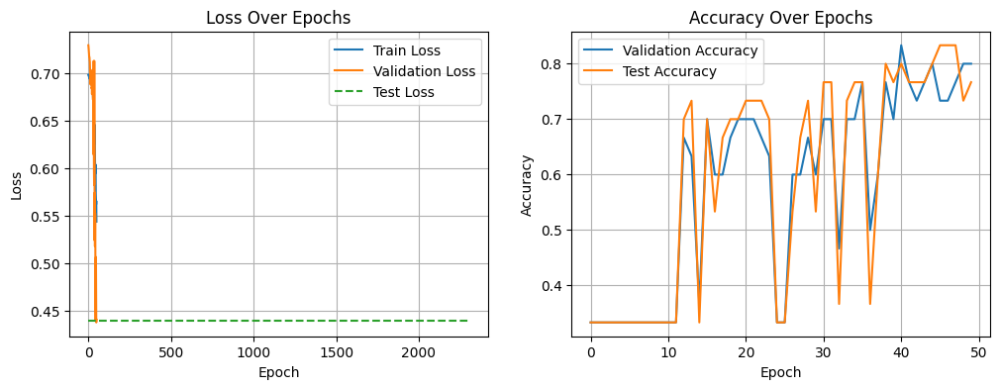

Hyperparameter Trials:  77%|███████▋  | 77/100 [25:35<15:28, 40.38s/it]


🔁 Trial 78: hidden_dim=64, num_layers=2, lr=0.001, batch_size=64, dropout=0.3
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.001, batch_size=64, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6924, Val Loss: 0.6868, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6933, Val Loss: 0.6869, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6928, Val Loss: 0.6872, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6935, Val Loss: 0.6883, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6929, Val Loss: 0.6894, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6923, Val Loss: 0.6904, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6916, Val Loss: 0.6911, Val Acc: 0.7000, Test Acc: 0.7333
Epoch [8/50], Train Loss: 0.6907, Val Loss: 0.6919, Val Acc: 0.6667, Test Acc: 0.7000
Epoch [9/50], Train Loss: 0.

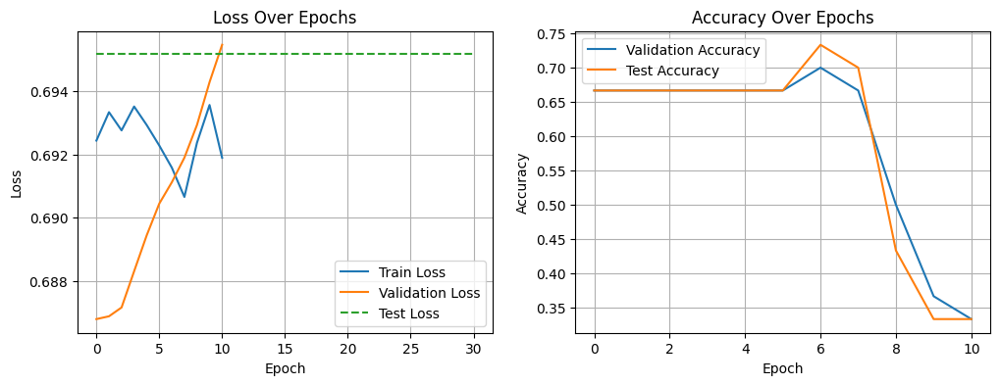

Hyperparameter Trials:  78%|███████▊  | 78/100 [25:40<10:52, 29.68s/it]


🔁 Trial 79: hidden_dim=64, num_layers=3, lr=0.0001, batch_size=4, dropout=0.2
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.0001, batch_size=4, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6983, Val Loss: 0.6599, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6994, Val Loss: 0.6612, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6981, Val Loss: 0.6630, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6971, Val Loss: 0.6660, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6957, Val Loss: 0.6676, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6969, Val Loss: 0.6697, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6962, Val Loss: 0.6716, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6931, Val Loss: 0.6750, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

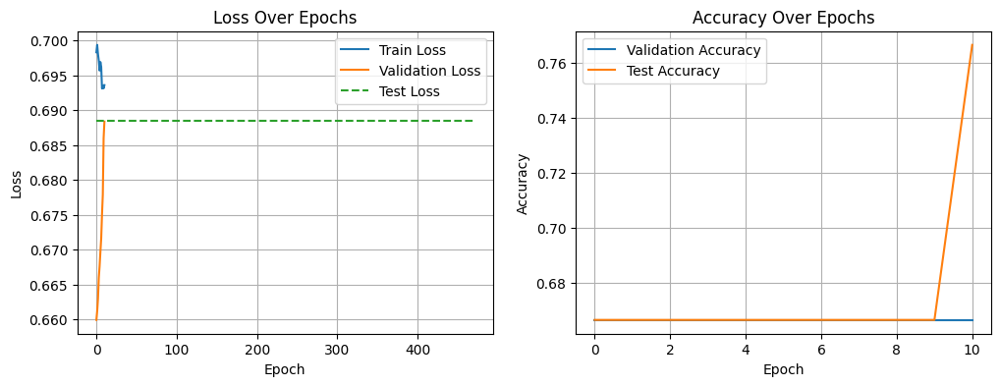

Hyperparameter Trials:  79%|███████▉  | 79/100 [25:51<08:25, 24.07s/it]


🔁 Trial 80: hidden_dim=96, num_layers=2, lr=0.001, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.001, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6938, Val Loss: 0.6968, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6939, Val Loss: 0.6978, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6937, Val Loss: 0.6970, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6929, Val Loss: 0.7058, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6934, Val Loss: 0.6977, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6928, Val Loss: 0.6905, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [7/50], Train Loss: 0.6905, Val Loss: 0.6869, Val Acc: 0.6000, Test Acc: 0.7000
Epoch [8/50], Train Loss: 0.6835, Val Loss: 0.6426, Val Acc: 0.7000, Test Acc: 0.7667
Epoch [9/50], Train Loss: 0.69

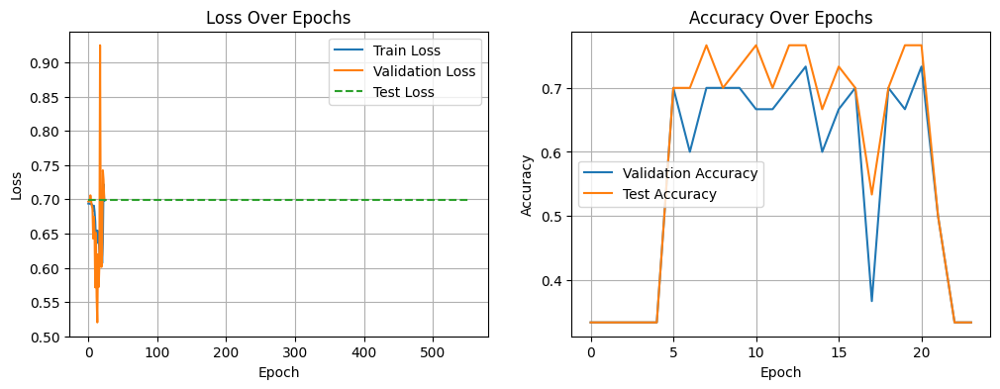

Hyperparameter Trials:  80%|████████  | 80/100 [26:09<07:25, 22.28s/it]


🔁 Trial 81: hidden_dim=64, num_layers=2, lr=0.001, batch_size=64, dropout=0.2
Debug - Parameters: hidden_dim=64, num_layers=2, learning_rate=0.001, batch_size=64, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6951, Val Loss: 0.7030, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6939, Val Loss: 0.7028, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6936, Val Loss: 0.7006, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6935, Val Loss: 0.7000, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6928, Val Loss: 0.6997, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6930, Val Loss: 0.6996, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6934, Val Loss: 0.6993, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6917, Val Loss: 0.6987, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.

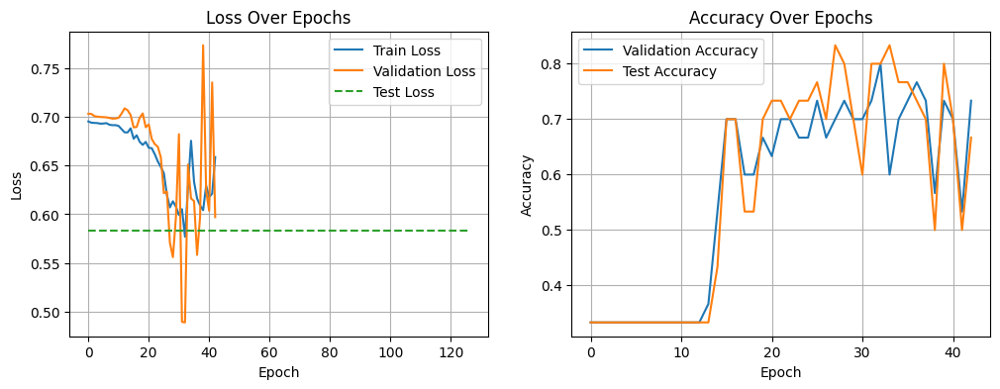

Hyperparameter Trials:  81%|████████  | 81/100 [26:26<06:32, 20.68s/it]


🔁 Trial 82: hidden_dim=160, num_layers=2, lr=0.0001, batch_size=8, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.0001, batch_size=8, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6973, Val Loss: 0.7182, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6968, Val Loss: 0.7166, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6969, Val Loss: 0.7138, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6940, Val Loss: 0.7128, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6955, Val Loss: 0.7103, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6937, Val Loss: 0.7071, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6936, Val Loss: 0.7054, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6923, Val Loss: 0.6980, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

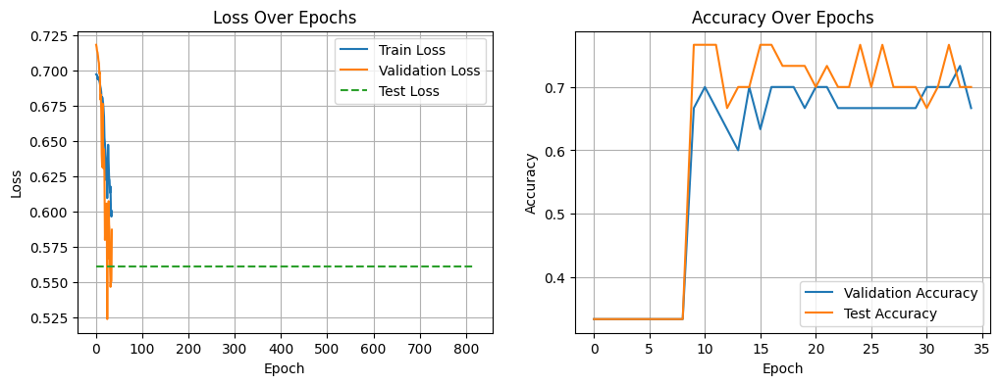

Hyperparameter Trials:  82%|████████▏ | 82/100 [27:19<09:06, 30.37s/it]


🔁 Trial 83: hidden_dim=128, num_layers=2, lr=0.0001, batch_size=16, dropout=0.2
Debug - Parameters: hidden_dim=128, num_layers=2, learning_rate=0.0001, batch_size=16, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6932, Val Loss: 0.6864, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6932, Val Loss: 0.6862, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6936, Val Loss: 0.6863, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6931, Val Loss: 0.6868, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6930, Val Loss: 0.6867, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6934, Val Loss: 0.6879, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6927, Val Loss: 0.6878, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6927, Val Loss: 0.6874, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


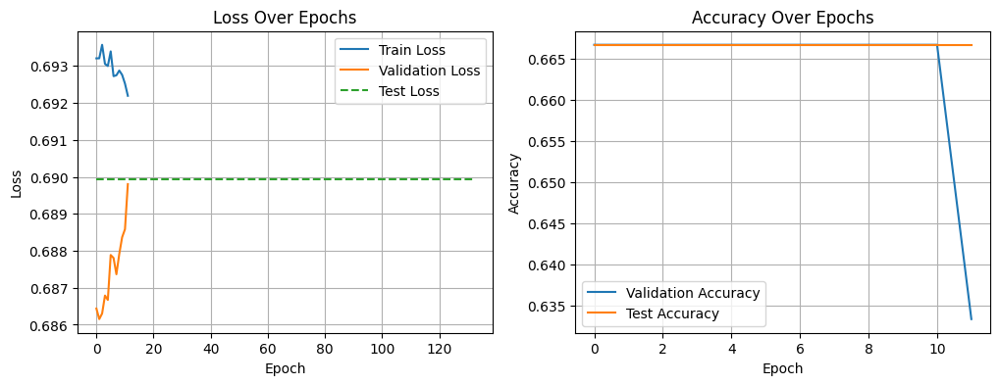

Hyperparameter Trials:  83%|████████▎ | 83/100 [27:31<07:04, 24.96s/it]


🔁 Trial 84: hidden_dim=64, num_layers=3, lr=0.0001, batch_size=4, dropout=0.2
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.0001, batch_size=4, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6947, Val Loss: 0.6691, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6951, Val Loss: 0.6699, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6962, Val Loss: 0.6713, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6946, Val Loss: 0.6729, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6962, Val Loss: 0.6744, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6935, Val Loss: 0.6767, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6940, Val Loss: 0.6773, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6919, Val Loss: 0.6805, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

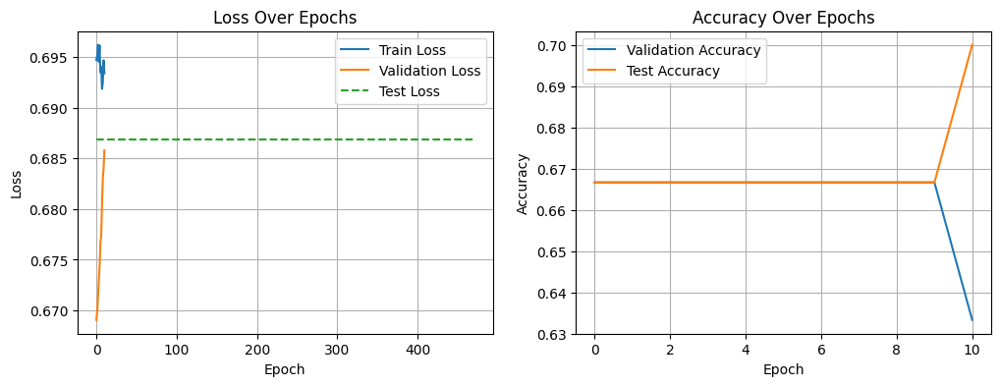

Hyperparameter Trials:  84%|████████▍ | 84/100 [27:40<05:22, 20.18s/it]


🔁 Trial 85: hidden_dim=32, num_layers=3, lr=0.0001, batch_size=8, dropout=0.2
Debug - Parameters: hidden_dim=32, num_layers=3, learning_rate=0.0001, batch_size=8, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6993, Val Loss: 0.6649, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6958, Val Loss: 0.6654, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6973, Val Loss: 0.6657, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6994, Val Loss: 0.6661, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6934, Val Loss: 0.6665, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6967, Val Loss: 0.6668, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6963, Val Loss: 0.6671, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6958, Val Loss: 0.6677, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


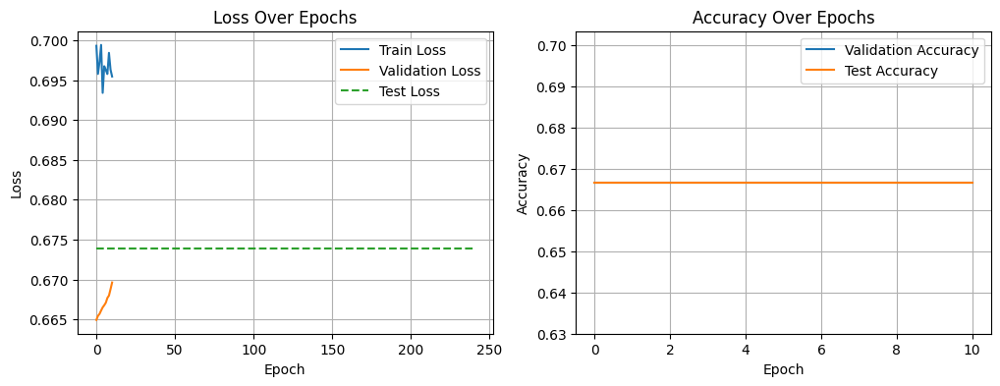

Hyperparameter Trials:  85%|████████▌ | 85/100 [27:46<03:57, 15.82s/it]


🔁 Trial 86: hidden_dim=96, num_layers=3, lr=0.0001, batch_size=8, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.0001, batch_size=8, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6931, Val Loss: 0.6999, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6935, Val Loss: 0.6990, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6934, Val Loss: 0.6988, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6947, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6925, Val Loss: 0.6994, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6933, Val Loss: 0.6994, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6931, Val Loss: 0.6994, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6939, Val Loss: 0.6997, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.

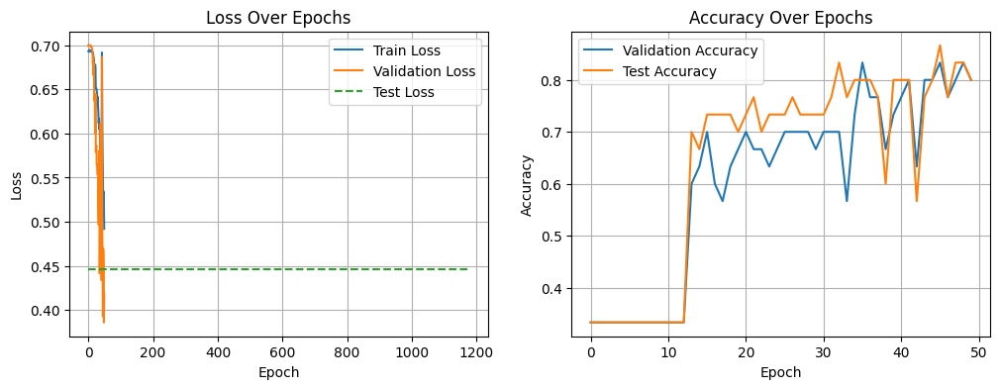

Hyperparameter Trials:  86%|████████▌ | 86/100 [28:41<06:27, 27.67s/it]


🔁 Trial 87: hidden_dim=64, num_layers=3, lr=0.001, batch_size=16, dropout=0.1
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.001, batch_size=16, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6935, Val Loss: 0.6835, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6939, Val Loss: 0.6831, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6934, Val Loss: 0.6840, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6936, Val Loss: 0.6850, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6932, Val Loss: 0.6869, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6926, Val Loss: 0.6882, Val Acc: 0.6333, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6898, Val Loss: 0.6980, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6888, Val Loss: 0.6907, Val Acc: 0.6667, Test Acc: 0.7333
Epoch [9/50], Train Loss: 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


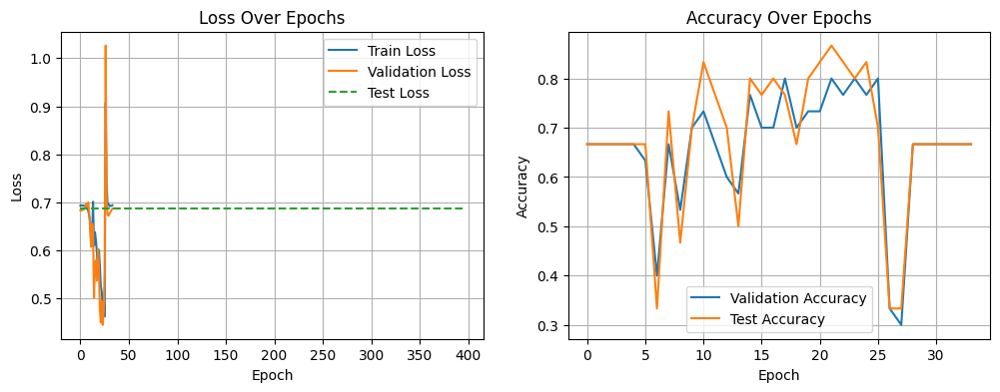

Hyperparameter Trials:  87%|████████▋ | 87/100 [29:01<05:31, 25.49s/it]


🔁 Trial 88: hidden_dim=96, num_layers=3, lr=0.01, batch_size=64, dropout=0.2
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.01, batch_size=64, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6959, Val Loss: 0.6802, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6960, Val Loss: 0.6887, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6949, Val Loss: 0.6775, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.7027, Val Loss: 0.6679, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6954, Val Loss: 0.6822, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6930, Val Loss: 0.6901, Val Acc: 0.6667, Test Acc: 0.7667
Epoch [7/50], Train Loss: 0.6929, Val Loss: 0.7083, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6935, Val Loss: 0.7011, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.69

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


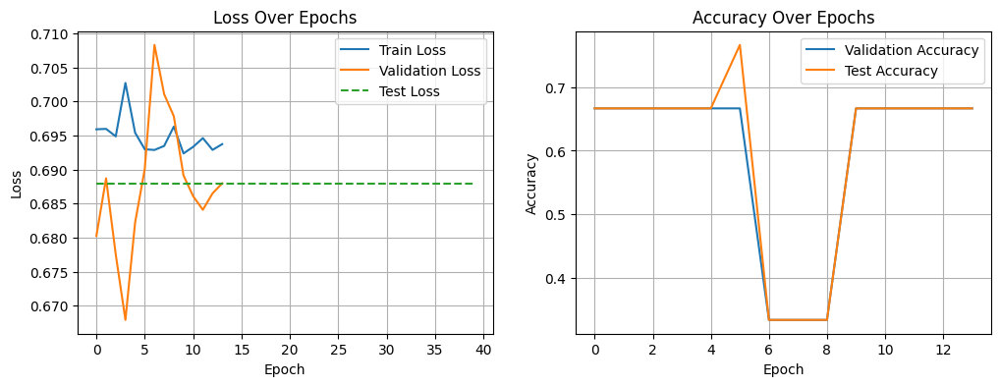

Hyperparameter Trials:  88%|████████▊ | 88/100 [29:17<04:29, 22.49s/it]


🔁 Trial 89: hidden_dim=160, num_layers=3, lr=0.0001, batch_size=4, dropout=0.2
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.0001, batch_size=4, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6987, Val Loss: 0.6598, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6976, Val Loss: 0.6625, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6981, Val Loss: 0.6645, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6965, Val Loss: 0.6694, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6958, Val Loss: 0.6685, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6953, Val Loss: 0.6732, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6969, Val Loss: 0.6739, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6965, Val Loss: 0.6747, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

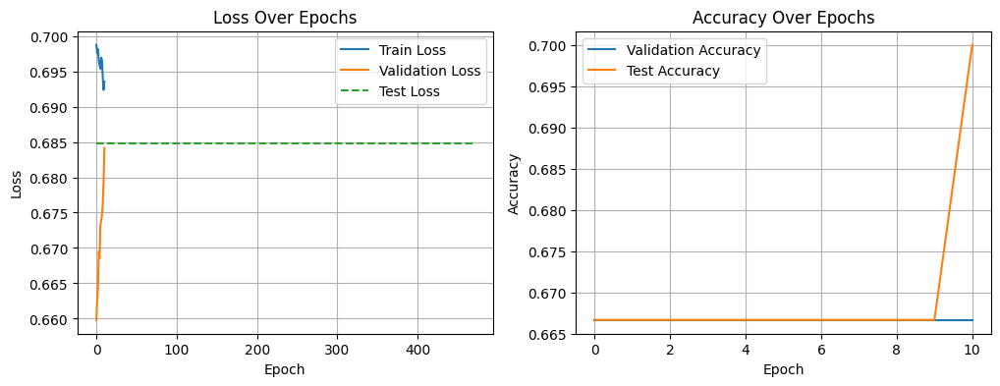

Hyperparameter Trials:  89%|████████▉ | 89/100 [29:46<04:27, 24.31s/it]


🔁 Trial 90: hidden_dim=64, num_layers=3, lr=0.0001, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=64, num_layers=3, learning_rate=0.0001, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6937, Val Loss: 0.6901, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6928, Val Loss: 0.6903, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6954, Val Loss: 0.6891, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6927, Val Loss: 0.6897, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6930, Val Loss: 0.6894, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6949, Val Loss: 0.6895, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6921, Val Loss: 0.6896, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6928, Val Loss: 0.6898, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


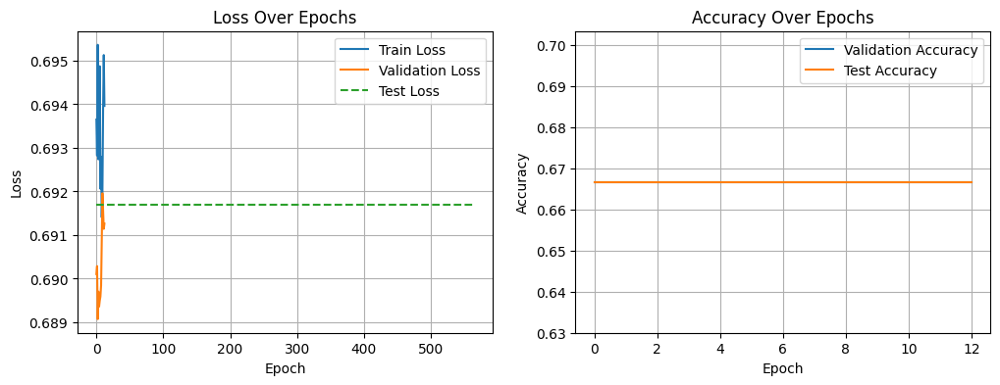

Hyperparameter Trials:  90%|█████████ | 90/100 [29:57<03:25, 20.53s/it]


🔁 Trial 91: hidden_dim=128, num_layers=3, lr=0.01, batch_size=16, dropout=0.2
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.01, batch_size=16, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7018, Val Loss: 0.7216, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6981, Val Loss: 0.7044, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.7018, Val Loss: 0.6926, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6936, Val Loss: 0.7101, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6944, Val Loss: 0.7068, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6958, Val Loss: 0.6989, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6952, Val Loss: 0.6906, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6955, Val Loss: 0.7060, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.

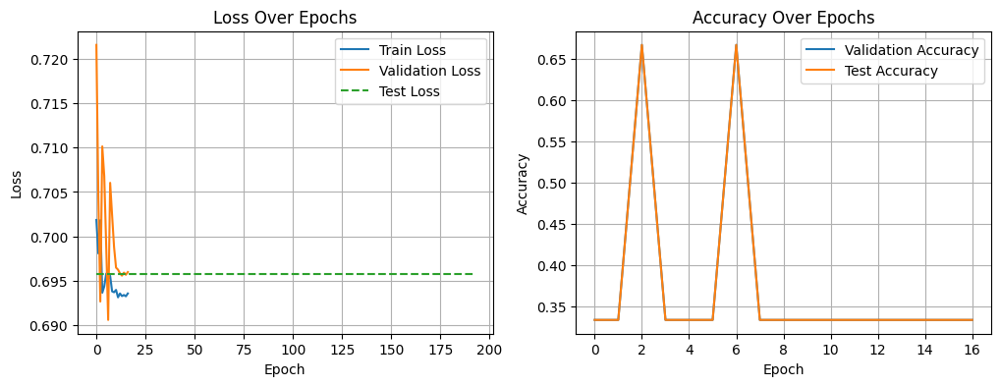

Hyperparameter Trials:  91%|█████████ | 91/100 [30:23<03:18, 22.08s/it]


🔁 Trial 92: hidden_dim=160, num_layers=2, lr=0.001, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.001, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6939, Val Loss: 0.6807, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6932, Val Loss: 0.6847, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6930, Val Loss: 0.6907, Val Acc: 0.6667, Test Acc: 0.7333
Epoch [4/50], Train Loss: 0.6918, Val Loss: 0.6946, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6911, Val Loss: 0.6953, Val Acc: 0.3667, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6892, Val Loss: 0.6966, Val Acc: 0.3667, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6850, Val Loss: 0.7017, Val Acc: 0.4000, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6819, Val Loss: 0.6953, Val Acc: 0.5333, Test Acc: 0.5000
Epoch [9/50], Train Loss: 

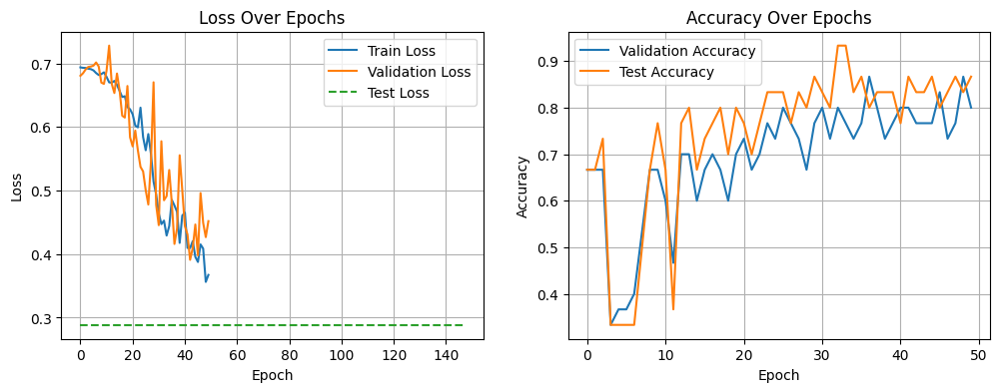

Hyperparameter Trials:  92%|█████████▏| 92/100 [31:36<05:00, 37.52s/it]


🔁 Trial 93: hidden_dim=96, num_layers=2, lr=0.01, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=96, num_layers=2, learning_rate=0.01, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6974, Val Loss: 0.7106, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6945, Val Loss: 0.6963, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6935, Val Loss: 0.6908, Val Acc: 0.7667, Test Acc: 0.7667
Epoch [4/50], Train Loss: 0.6938, Val Loss: 0.6980, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6931, Val Loss: 0.6974, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6927, Val Loss: 0.6951, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6923, Val Loss: 0.6911, Val Acc: 0.7333, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6922, Val Loss: 0.6495, Val Acc: 0.7000, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.69

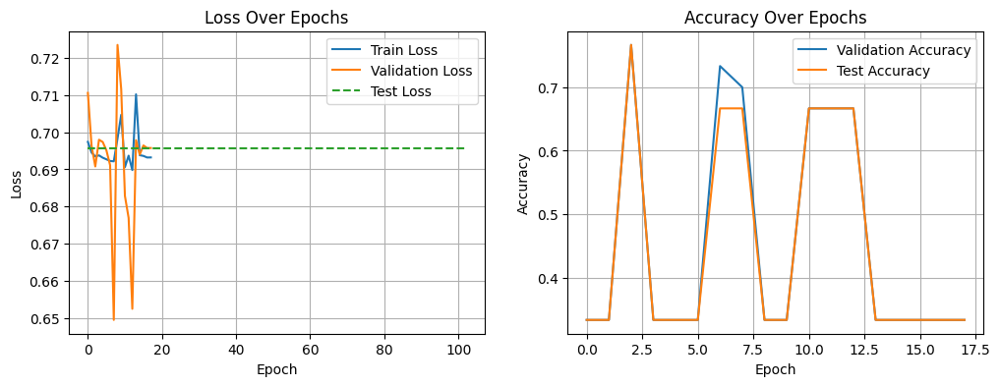

Hyperparameter Trials:  93%|█████████▎| 93/100 [31:47<03:26, 29.49s/it]


🔁 Trial 94: hidden_dim=160, num_layers=2, lr=0.001, batch_size=32, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=2, learning_rate=0.001, batch_size=32, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6962, Val Loss: 0.7195, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6953, Val Loss: 0.7122, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6941, Val Loss: 0.7096, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6937, Val Loss: 0.7077, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6937, Val Loss: 0.7051, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6939, Val Loss: 0.7043, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6931, Val Loss: 0.7013, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6898, Val Loss: 0.6980, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 

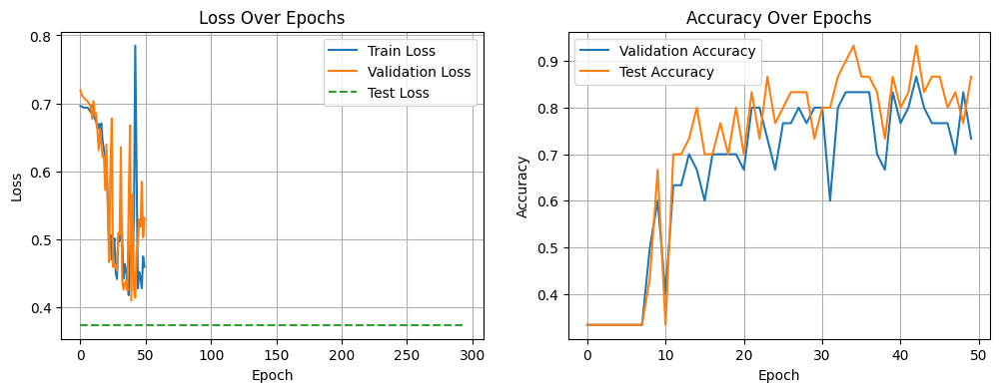

Hyperparameter Trials:  94%|█████████▍| 94/100 [33:02<04:19, 43.20s/it]


🔁 Trial 95: hidden_dim=96, num_layers=3, lr=0.01, batch_size=4, dropout=0.3
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.01, batch_size=4, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7023, Val Loss: 0.7056, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6948, Val Loss: 0.7011, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6968, Val Loss: 0.6907, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6935, Val Loss: 0.6988, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6942, Val Loss: 0.6978, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6944, Val Loss: 0.6911, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6939, Val Loss: 0.6933, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6946, Val Loss: 0.7002, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.6935

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


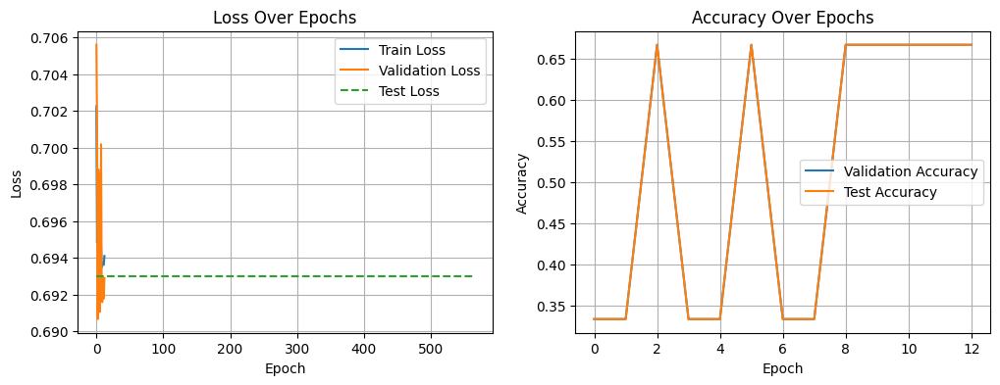

Hyperparameter Trials:  95%|█████████▌| 95/100 [33:20<02:57, 35.50s/it]


🔁 Trial 96: hidden_dim=96, num_layers=3, lr=0.01, batch_size=32, dropout=0.2
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.01, batch_size=32, dropout_rate=0.2
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7017, Val Loss: 0.7133, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6983, Val Loss: 0.7044, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6930, Val Loss: 0.6962, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6955, Val Loss: 0.7245, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6887, Val Loss: 0.6780, Val Acc: 0.7000, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6745, Val Loss: 0.5938, Val Acc: 0.7000, Test Acc: 0.7000
Epoch [7/50], Train Loss: 0.7237, Val Loss: 0.7318, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6893, Val Loss: 0.7034, Val Acc: 0.3667, Test Acc: 0.3333
Epoch [9/50], Train Loss: 0.71

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


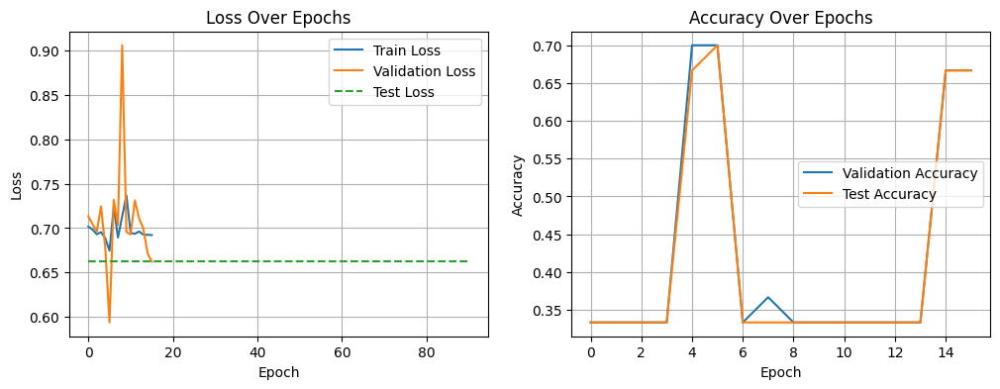

Hyperparameter Trials:  96%|█████████▌| 96/100 [33:35<01:57, 29.48s/it]


🔁 Trial 97: hidden_dim=128, num_layers=3, lr=0.01, batch_size=8, dropout=0.1
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.01, batch_size=8, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7059, Val Loss: 0.7322, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6959, Val Loss: 0.7159, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6951, Val Loss: 0.7037, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6948, Val Loss: 0.7032, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6940, Val Loss: 0.6967, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6933, Val Loss: 0.6917, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6934, Val Loss: 0.6908, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6930, Val Loss: 0.6876, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.69

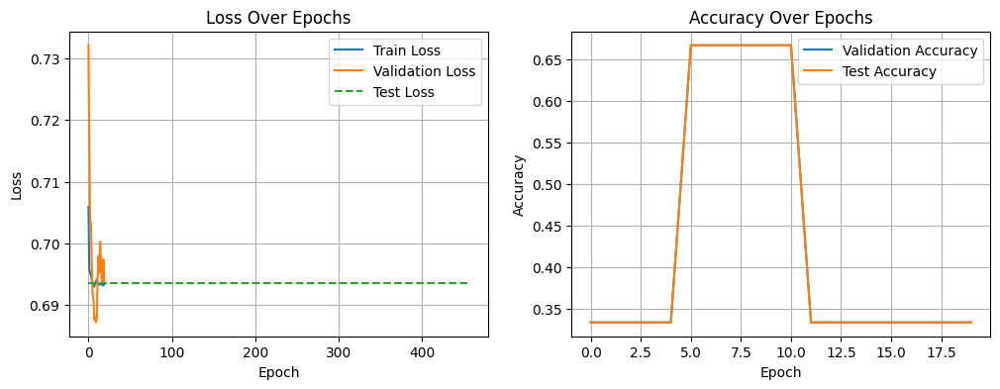

Hyperparameter Trials:  97%|█████████▋| 97/100 [34:08<01:31, 30.55s/it]


🔁 Trial 98: hidden_dim=128, num_layers=3, lr=0.01, batch_size=8, dropout=0.3
Debug - Parameters: hidden_dim=128, num_layers=3, learning_rate=0.01, batch_size=8, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7012, Val Loss: 0.6799, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6971, Val Loss: 0.6840, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6860, Val Loss: 0.6850, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6928, Val Loss: 0.6936, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.7019, Val Loss: 0.6978, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.7005, Val Loss: 0.7084, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6921, Val Loss: 0.6959, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [8/50], Train Loss: 0.6931, Val Loss: 0.6899, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 0.69

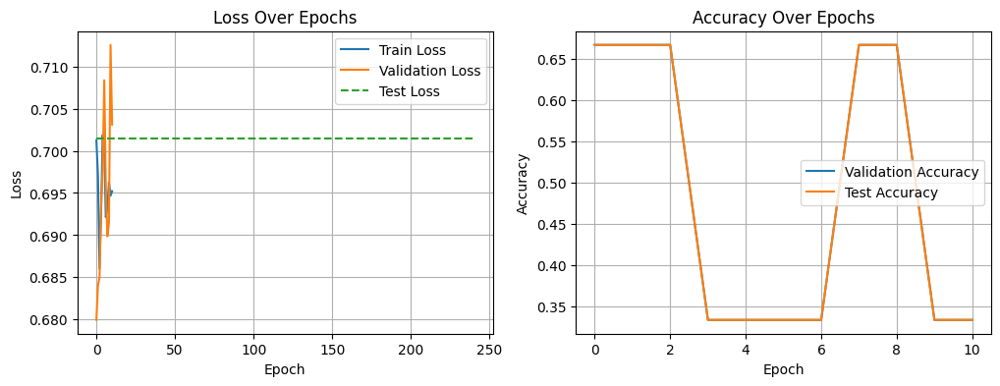

Hyperparameter Trials:  98%|█████████▊| 98/100 [34:28<00:54, 27.19s/it]


🔁 Trial 99: hidden_dim=160, num_layers=3, lr=0.001, batch_size=64, dropout=0.1
Debug - Parameters: hidden_dim=160, num_layers=3, learning_rate=0.001, batch_size=64, dropout_rate=0.1
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.7001, Val Loss: 0.7350, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [2/50], Train Loss: 0.6997, Val Loss: 0.7330, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [3/50], Train Loss: 0.6978, Val Loss: 0.7286, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [4/50], Train Loss: 0.6977, Val Loss: 0.7233, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [5/50], Train Loss: 0.6965, Val Loss: 0.7133, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [6/50], Train Loss: 0.6938, Val Loss: 0.6998, Val Acc: 0.3333, Test Acc: 0.3333
Epoch [7/50], Train Loss: 0.6942, Val Loss: 0.6852, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6948, Val Loss: 0.6809, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss: 

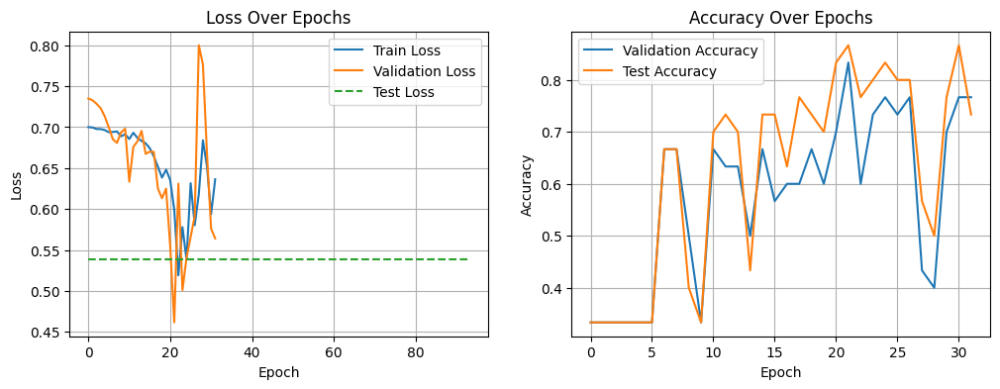

Hyperparameter Trials:  99%|█████████▉| 99/100 [35:41<00:41, 41.14s/it]


🔁 Trial 100: hidden_dim=96, num_layers=3, lr=0.0001, batch_size=32, dropout=0.3
Debug - Parameters: hidden_dim=96, num_layers=3, learning_rate=0.0001, batch_size=32, dropout_rate=0.3
Debug - hidden_dim type: <class 'int'>, num_layers type: <class 'int'>, batch_size type: <class 'int'>
Epoch [1/50], Train Loss: 0.6956, Val Loss: 0.6749, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [2/50], Train Loss: 0.6937, Val Loss: 0.6755, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [3/50], Train Loss: 0.6949, Val Loss: 0.6760, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [4/50], Train Loss: 0.6944, Val Loss: 0.6763, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [5/50], Train Loss: 0.6965, Val Loss: 0.6767, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [6/50], Train Loss: 0.6967, Val Loss: 0.6769, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [7/50], Train Loss: 0.6956, Val Loss: 0.6772, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [8/50], Train Loss: 0.6936, Val Loss: 0.6775, Val Acc: 0.6667, Test Acc: 0.6667
Epoch [9/50], Train Loss:

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


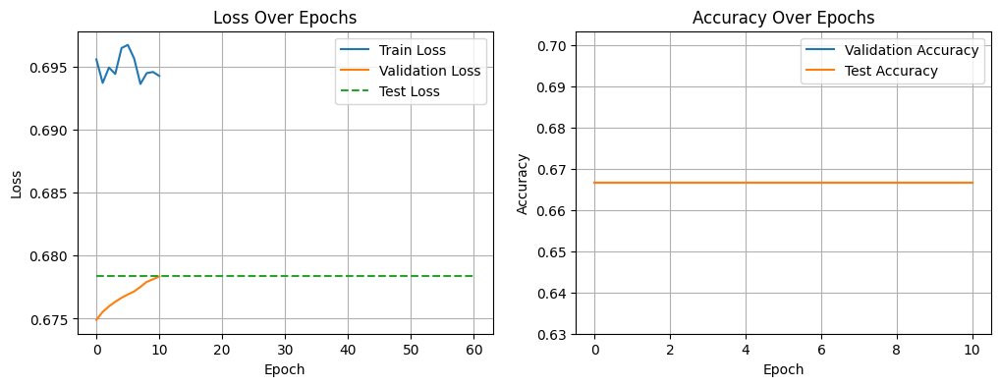

Hyperparameter Trials: 100%|██████████| 100/100 [35:51<00:00, 21.52s/it]



📁 Saved all results to 'hyperparameter_trials_lstm.csv'

🏆 Best Hyperparameter Configuration:
trial: 74
hidden_dim: 128
num_layers: 3
learning_rate: 0.0001
batch_size: 4
dropout_rate: 0.3
val_accuracy: 0.8
test_accuracy: 0.9333333333333333
test_loss: 0.25677528977394104
📦 Best model saved to 'results/best_lstm_model.pt'
📝 Best hyperparameters saved to 'results/best_hyperparameters.txt'
📊 Epoch-wise performance saved to 'results/best_model_epoch_metrics.csv'


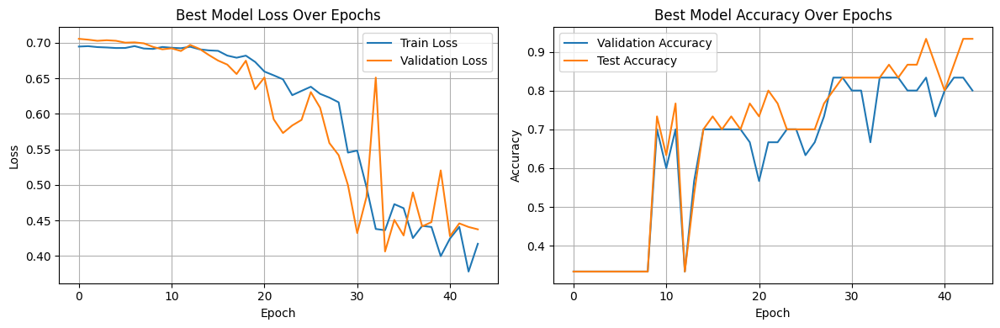

📉 Accuracy and loss curves saved to 'results/best_model_curves.png'

✅ All results successfully saved in the 'results/' directory.


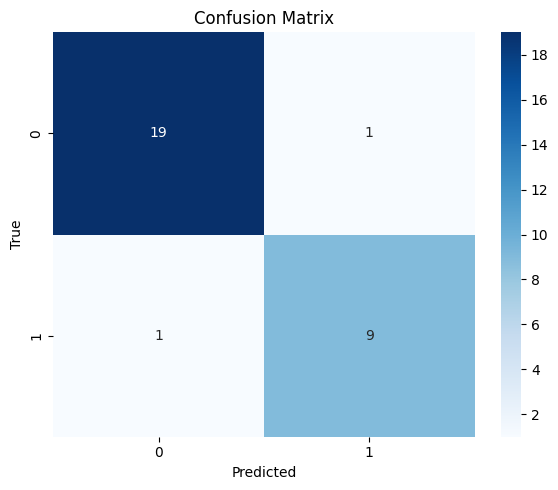

              precision    recall  f1-score   support

     Class 0       0.95      0.95      0.95        20
     Class 1       0.90      0.90      0.90        10

    accuracy                           0.93        30
   macro avg       0.93      0.93      0.93        30
weighted avg       0.93      0.93      0.93        30



In [10]:

# Set random seeds for reproducibility
torch.manual_seed(42)
np.random.seed(42)
random.seed(42)

# Create datasets only once
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

# Track best results
best_val_loss = float('inf')
best_model = None
best_params = {}
all_trials = []

# Start randomized hyperparameter search
for i in tqdm(range(100), desc="Hyperparameter Trials"):

    # Sample hyperparameters randomly
    hidden_dim = random.choice(param_grid['hidden_dim'])
    num_layers = random.choice(param_grid['num_layers'])
    learning_rate = random.choice(param_grid['learning_rate'])
    batch_size = random.choice(param_grid['batch_size'])
    dropout_rate = random.choice(param_grid['dropout_rate'])

    print(f"\n🔁 Trial {i+1}: hidden_dim={hidden_dim}, num_layers={num_layers}, "
          f"lr={learning_rate}, batch_size={batch_size}, dropout={dropout_rate}")

    # Create DataLoaders inside the loop with current batch size
    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
    test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

    # Train and evaluate
    model, hidden_states, val_accs, test_accs, train_losses, val_losses, test_loss = train_and_evaluate(
        hidden_dim, num_layers, learning_rate, batch_size, dropout_rate,
        X_train_tensor, y_train_tensor,
        X_val_tensor, y_val_tensor,
        X_test_tensor, y_test_tensor
    )

    # Track results
    trial = {
        "trial": i + 1,
        "hidden_dim": hidden_dim,
        "num_layers": num_layers,
        "learning_rate": learning_rate,
        "batch_size": batch_size,
        "dropout_rate": dropout_rate,
        "val_accuracy": val_accs[-1] if val_accs else None,
        "test_accuracy": test_accs[-1] if test_accs else None,
        "test_loss": test_loss
    }
    all_trials.append(trial)

    # Check if best model
    if test_loss < best_val_loss:
        best_val_loss = test_loss
        best_model = model
        best_params = trial
        print(f"✅ New Best Model at Trial {i+1} with Test Loss = {test_loss:.4f}")

        best_val_accs = val_accs
        best_test_accs = test_accs
        best_train_losses = train_losses
        best_val_losses = val_losses

        print(f"✅ New Best Model at Trial {i+1} with Test Loss = {test_loss:.4f}")

# Convert to DataFrame and save
df_trials = pd.DataFrame(all_trials)
df_trials.to_csv("hyperparameter_trials_lstm.csv", index=False)
print("\n📁 Saved all results to 'hyperparameter_trials_lstm.csv'")

# Show best model
print("\n🏆 Best Hyperparameter Configuration:")
for key, value in best_params.items():
    print(f"{key}: {value}")




# 🔧 Create results folder
os.makedirs("results", exist_ok=True)

# ✅ Save best model weights
torch.save(best_model.state_dict(), "results/best_lstm_model.pt")
print("📦 Best model saved to 'results/best_lstm_model.pt'")

# ✅ Save best hyperparameters and summary
with open("results/best_hyperparameters.txt", "w") as f:
    f.write("Best Hyperparameters and Performance:\n")
    for key, value in best_params.items():
        f.write(f"{key}: {value}\n")
    f.write(f"Best Test Loss: {best_val_loss:.4f}\n")

print("📝 Best hyperparameters saved to 'results/best_hyperparameters.txt'")

# ✅ Save epoch-wise metrics
df_metrics = pd.DataFrame({
    "Epoch": list(range(len(best_val_accs))),
    "Validation Accuracy": best_val_accs,
    "Test Accuracy": best_test_accs,
    "Train Loss": best_train_losses,
    "Validation Loss": best_val_losses
})
df_metrics.to_csv("results/best_model_epoch_metrics.csv", index=False)
print("📊 Epoch-wise performance saved to 'results/best_model_epoch_metrics.csv'")

# ✅ Plot and save learning curves
plt.figure(figsize=(12, 4))

# Loss plot
plt.subplot(1, 2, 1)
plt.plot(best_train_losses, label='Train Loss')
plt.plot(best_val_losses, label='Validation Loss')
plt.title("Best Model Loss Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid()

# Accuracy plot
plt.subplot(1, 2, 2)
plt.plot(best_val_accs, label='Validation Accuracy')
plt.plot(best_test_accs, label='Test Accuracy')
plt.title("Best Model Accuracy Over Epochs")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid()

plt.tight_layout()
plt.savefig("results/best_model_curves.png", dpi=300)
plt.show()
print("📉 Accuracy and loss curves saved to 'results/best_model_curves.png'")

print("\n✅ All results successfully saved in the 'results/' directory.")



from sklearn.metrics import confusion_matrix, classification_report


# 🧠 Generate predictions from best model on test set
best_model.eval()
y_preds = []
y_trues = []

with torch.no_grad():
    for X_batch, y_batch in test_loader:
        X_batch = X_batch.to(device)
        outputs, _ = best_model(X_batch)
        preds = torch.sigmoid(outputs).cpu().numpy().flatten() > 0.5  # binary threshold
        y_preds.extend(preds)
        y_trues.extend(y_batch.numpy())

# Convert to numpy arrays
y_true = np.array(y_trues, dtype=int)
y_pred = np.array(y_preds, dtype=int)

# ✅ Create Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=[0, 1], yticklabels=[0, 1])
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.tight_layout()

# Save confusion matrix plot
os.makedirs("results", exist_ok=True)
plt.savefig("results/confusion_matrix.png")
plt.show()

# ✅ Classification Report
report = classification_report(y_true, y_pred, target_names=["Class 0", "Class 1"])
print(report)

# Save report to text file
with open("results/classification_report.txt", "w") as f:
    f.write(report)



**Post HOC XAI methods (DeepliftSHAP, IG and SaliencyMaps and Fidelidy score evaluation)**

In [11]:
# Install required libraries
!pip install captum torch

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 45.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 18.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 95.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18

In [12]:
# ✅ Set random seed for reproducibility
seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

In [39]:

import shap
from sklearn.model_selection import StratifiedShuffleSplit
from captum.attr import DeepLiftShap
# ✅ Create results folder
# ✅ Create results folder
os.makedirs("XAI_results", exist_ok=True)
# ✅ Re-enable training mode for backward pass (CuDNN)
best_model.train()

# ✅ Define clean wrapper
class LSTMWrapper(nn.Module):
    def __init__(self, lstm_model):
        super().__init__()
        self.lstm_model = lstm_model

    def forward(self, x):
        logits, _ = self.lstm_model(x)
        return logits  # Ensure logits returned for classification

wrapped_model = LSTMWrapper(best_model).to(device)

# ✅ Select background dataset using stratified sampling
sss = StratifiedShuffleSplit(n_splits=1, test_size=100, random_state=42)
for _, idx in sss.split(X_train_tensor, y_train_tensor):
    X_background = X_train_tensor[idx].to(device)

# ✅ Select test sample
X_test_sample = X_test_tensor[:30].to(device)
X_test_np = X_test_sample.cpu().numpy().squeeze()

# ✅ Initialize DeepLift SHAP
dlshap = DeepLiftShap(wrapped_model)

# ✅ Attribution with training mode on (for RNNs)
def compute_attribution(attr_method, inputs, baselines):
    model = attr_method.forward_func
    original_mode = model.training
    model.train()
    try:
        attributions = attr_method.attribute(inputs, baselines=baselines)
    finally:
        model.train(original_mode)
    return attributions

# ✅ Compute attributions
dlshap_attr = compute_attribution(dlshap, X_test_sample, X_background)
dlshap_attr_np = dlshap_attr.squeeze(-1).detach().cpu().numpy()

# ✅ Sanity check
print(f"Attributions shape: {dlshap_attr_np.shape}")
print(f"Test inputs shape: {X_test_np.shape}")

# ✅ Normalize attributions
def normalize_attr(attr):
    attr_min = attr.min(axis=1, keepdims=True)
    attr_max = attr.max(axis=1, keepdims=True)
    return (attr - attr_min) / (attr_max - attr_min + 1e-8)

dlshap_attr_np_norm = normalize_attr(dlshap_attr_np)

# ✅ Deeplift (SHAP summary plot)
plt.title("DeepLIFT SHAP style Summary Plot (Feature Impact and Value Distribution)", fontsize=14)
shap.summary_plot(dlshap_attr_np, X_test_np, feature_names=[f"t={i}" for i in range(X_test_np.shape[1])], show=False)
plt.savefig("XAI_results/deeplift_shap_summary_plot.png", dpi=300, bbox_inches="tight")
plt.close()

#shap.summary_plot(dlshap_attr_np, X_test_np, feature_names=[f"t={i}" for i in range(X_test_np.shape[1])],plot_size=(10, 6))

# ✅ Heatmap
# ✅ Show only every 4th time step label for readability
xtick_labels = [f"t={i}" if i % 2 == 0 else "" for i in range(dlshap_attr_np_norm.shape[1])]
plt.figure(figsize=(24,14))
sns.heatmap(dlshap_attr_np_norm, cmap="coolwarm", xticklabels=xtick_labels)
plt.title("DeepLift SHAP Attribution HeatmapAcross Samples",fontsize=20)
plt.xlabel("Time Steps",fontsize=20)
plt.ylabel("Samples",fontsize=20)
plt.xticks(rotation=45, fontsize=20)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.savefig("XAI_results/deeplift_shap_heatmap.png", dpi=400, bbox_inches="tight")
plt.close()


# ✅ Mean importance bar plot
mean_importance = np.abs(dlshap_attr_np).mean(axis=0)

# Sort and select top-k important time steps
top_k = 50
sorted_idx = np.argsort(mean_importance)[::-1][:top_k]
sorted_feat_names = [f"t={i}" for i in sorted_idx]
sorted_values = mean_importance[sorted_idx]
#sorted_idx = np.argsort(mean_importance)[::-1]

# sorted_feat_names = [f"t={i}" for i in sorted_idx]
# sorted_values = mean_importance[sorted_idx]

plt.figure(figsize=(8,12))
plt.barh(sorted_feat_names, sorted_values, color="darkblue")
plt.xlabel("mean(|SHAP value|)")
plt.title("Top 50 Time Steps DeepLIFT SHAP Attribution (ECG200)", fontsize=16)
plt.gca().invert_yaxis()
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.savefig("XAI_results/deeplift_shap_bar_plot.png", dpi=500, bbox_inches="tight")
plt.close()
# plt.show()
# plt.savefig("results/deeplift_shap_bar_plot.png", dpi=300, bbox_inches="tight")



/usr/local/lib/python3.11/dist-packages/captum/attr/_core/deep_lift.py:810: UserWarning: Setting forward, backward hooks and attributes on non-linear
               activations. The hooks and attributes will be removed
            after the attribution is finished
  attributions = super().attribute.__wrapped__(  # type: ignore


Attributions shape: (30, 96)
Test inputs shape: (30, 96)


<ipython-input-39-86993efb51f6>:63: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(dlshap_attr_np, X_test_np, feature_names=[f"t={i}" for i in range(X_test_np.shape[1])], show=False)


In [43]:
from captum.attr import IntegratedGradients
# ✅ Create output folder
os.makedirs("XAI_results", exist_ok=True)
# ✅ Initialize IG explainer
ig = IntegratedGradients(wrapped_model)

# ✅ Use zero baseline (common for normalized time series)
baseline_ig = torch.zeros_like(X_test_sample).to(device)

# ✅ Compute IG attributions with gradient-safe wrapper
ig_attr = compute_attribution(ig, X_test_sample, baselines=baseline_ig)
ig_attr_np = ig_attr.squeeze(-1).cpu().detach().numpy()  # Shape: [samples, time_steps]

# ✅ Normalize IG attributions
ig_attr_np_norm = normalize_attr(ig_attr_np)

# ✅ SHAP-style summary plot
plt.title("Integrated Gradients SHAP style Summary Plot (Feature Impact and Value Distribution)", fontsize=14)
shap.summary_plot(ig_attr_np, X_test_np, feature_names=[f"t={i}" for i in range(X_test_np.shape[1])],show=False )
plt.savefig("XAI_results/integrated_gradients_summary_plot.png", dpi=400, bbox_inches="tight")
plt.tight_layout()
plt.close()

# ✅ IG heatmap
xtick_labels = [f"t={i}" if i % 2 == 0 else "" for i in range(ig_attr_np.shape[1])]
plt.figure(figsize=(16,12))
sns.heatmap(ig_attr_np_norm, cmap="coolwarm",
            xticklabels=xtick_labels)
plt.title("Integrated Gradients Attribution Heatmap Across Samples",fontsize=20)
plt.xlabel("Time Steps",fontsize=20)
plt.ylabel("Samples",fontsize=20)
plt.tight_layout()
plt.savefig("XAI_results/integrated_gradients_heatmap.png", dpi=400, bbox_inches="tight")
plt.close()

# ✅ IG feature importance bar plot
mean_ig = np.abs(ig_attr_np).mean(axis=0)
top_k = 50
sorted_idx = np.argsort(mean_ig)[::-1][:top_k]
sorted_feat_names = [f"t={i}" for i in sorted_idx]
sorted_values = mean_ig[sorted_idx]

# sorted_idx = np.argsort(mean_ig)[::-1]
# sorted_feat_names = [f"t={i}" for i in sorted_idx]
# sorted_values = mean_ig[sorted_idx]

plt.figure(figsize=(8,12))
plt.barh(sorted_feat_names, sorted_values, color="darkorange")
plt.xlabel("mean(|IG value|)", fontsize=13)
plt.title("Top 50 Time Steps – Integrated Gradients Feature Importance", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig("XAI_results/integrated_gradients_bar_plot_top30.png", dpi=400, bbox_inches="tight")
plt.close()
# plt.xlabel("mean(|IG value|)", fontsize=12)
# plt.title("Integrated Gradients Feature Importance", fontsize=14)
# plt.xticks(fontsize=10)
# plt.yticks(fontsize=10)
# plt.gca().invert_yaxis()
# plt.tight_layout()
# plt.show()


<ipython-input-43-6a644ee34fb0>:19: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(ig_attr_np, X_test_np, feature_names=[f"t={i}" for i in range(X_test_np.shape[1])],show=False )


In [47]:
from captum.attr import Saliency



# ✅ Create output folder
os.makedirs("XAI_results", exist_ok=True)
# ✅ Safe Captum attribution wrapper
def compute_attribution(attr_method, inputs, baselines=None, **kwargs):
    """
    Compute Captum attributions safely with optional baseline and RNN support.
    """
    model = attr_method.forward_func
    was_training = model.training
    model.train()  # Needed for RNN backward pass

    try:
        if baselines is not None:
            attributions = attr_method.attribute(inputs, baselines=baselines, **kwargs)
        else:
            attributions = attr_method.attribute(inputs, **kwargs)
    finally:
        model.train(was_training)  # Restore model's original state

    return attributions

# ✅ Normalize attributions for plotting
def normalize_attr(attr):
    attr_min = attr.min(axis=1, keepdims=True)
    attr_max = attr.max(axis=1, keepdims=True)
    return (attr - attr_min) / (attr_max - attr_min + 1e-8)

# ✅ Initialize Saliency explainer
saliency = Saliency(wrapped_model)

# ✅ Compute Saliency attributions (no baseline needed)
sal_attr = compute_attribution(saliency, X_test_sample, baselines=None)
sal_attr_np = sal_attr.squeeze(-1).cpu().detach().numpy()

# ✅ Normalize for consistent visualization
sal_attr_np_norm = normalize_attr(sal_attr_np)

# ✅ SHAP-style summary plot
plt.title("Saliency Maps SHAP style Summary Plot (Feature Impact and Value Distribution)", fontsize=16)
shap.summary_plot(sal_attr_np, X_test_np, feature_names=[f"t={i}" for i in range(X_test_np.shape[1])],show=False)
plt.savefig("XAI_results/saliencymaps_summary_plot.png", dpi=400, bbox_inches="tight")
plt.tight_layout()
plt.close()


# ✅ Heatmap visualization
xtick_labels = [f"t={i}" if i % 2 == 0 else "" for i in range(ig_attr_np.shape[1])]
plt.figure(figsize=(16,12))
sns.heatmap(
    sal_attr_np_norm,
    cmap="coolwarm",
    xticklabels=xtick_labels,
    yticklabels=True,
    center=0
)
plt.title("Saliency Attribution Heatmap across the Samples",fontsize=20)
plt.xlabel("Time Steps",fontsize=20)
plt.ylabel("Samples",fontsize=20)
plt.tight_layout()
plt.savefig("XAI_results/saliencymaps_heatmap.png", dpi=400, bbox_inches="tight")
plt.close()

# ✅ Bar plot of feature importance
mean_sal = np.abs(sal_attr_np).mean(axis=0)
top_k = 50
sorted_idx = np.argsort(mean_ig)[::-1][:top_k]
sorted_feat_names = [f"t={i}" for i in sorted_idx]
sorted_values = mean_sal[sorted_idx]

# sorted_idx = np.argsort(mean_sal)[::-1]
# sorted_feat_names = [f"t={i}" for i in sorted_idx]
# sorted_values = mean_sal[sorted_idx]

plt.figure(figsize=(8,12))
plt.barh(sorted_feat_names, sorted_values, color="crimson")
plt.xlabel("mean(|IG value|)", fontsize=16)
plt.title("Top 50 Time Steps Saliency Maps Feature Importance", fontsize=16)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.gca().invert_yaxis()
plt.tight_layout()
plt.savefig("XAI_results/saliencymaps_bar_plot_top50.png", dpi=400, bbox_inches="tight")
plt.close()
#
# plt.xlabel("mean(|Saliency|)")
# plt.title("Saliency Feature Importance")
# plt.gca().invert_yaxis()
# plt.tight_layout()
# plt.show()


/usr/local/lib/python3.11/dist-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)
<ipython-input-47-6d769cce5032>:44: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(sal_attr_np, X_test_np, feature_names=[f"t={i}" for i in range(X_test_np.shape[1])],show=False)


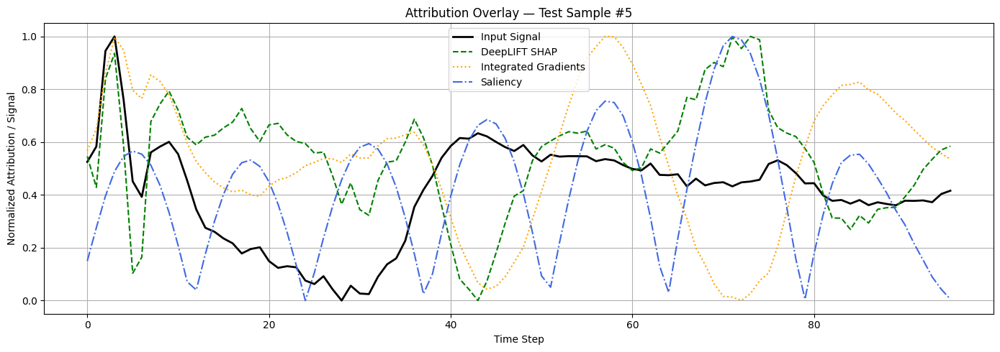

In [48]:


# ✅ Choose the test sample index to visualize
sample_idx = 5  # You can change this to 1, 2, etc.

# ✅ Extract input signal and attributions for the same sample
input_signal = X_test_np[sample_idx]  # shape: [time_steps]
dlshap_values = dlshap_attr_np[sample_idx]
ig_values = ig_attr_np[sample_idx]
saliency_values = sal_attr_np[sample_idx]

# ✅ Normalize attributions (optional but improves visual comparison)
def normalize_1d(x):
    return (x - x.min()) / (x.max() - x.min() + 1e-8)

dlshap_values = normalize_1d(dlshap_values)
ig_values = normalize_1d(ig_values)
saliency_values = normalize_1d(saliency_values)

# ✅ Plot side-by-side overlay
plt.figure(figsize=(14, 5))
plt.plot(input_signal, label='Input Signal', color='black', linewidth=2)
plt.plot(dlshap_values, label='DeepLIFT SHAP', linestyle='--', color='green')
plt.plot(ig_values, label='Integrated Gradients', linestyle=':', color='orange')
plt.plot(saliency_values, label='Saliency', linestyle='-.', color='royalblue')

plt.title(f"Attribution Overlay — Test Sample #{sample_idx}")
plt.xlabel("Time Step")
plt.ylabel("Normalized Attribution / Signal")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


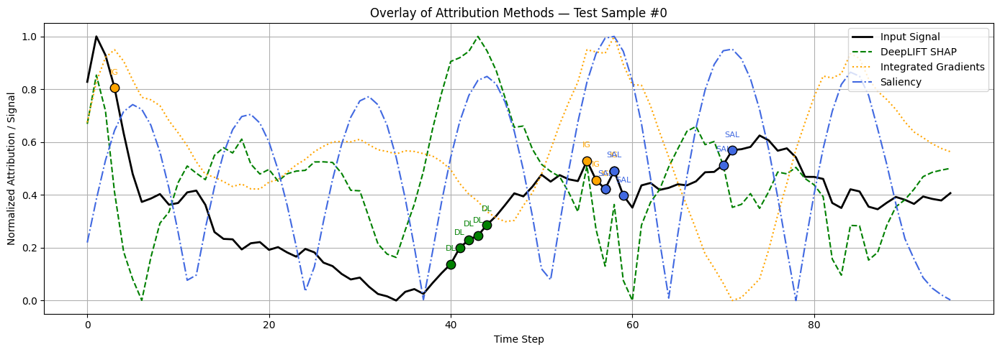

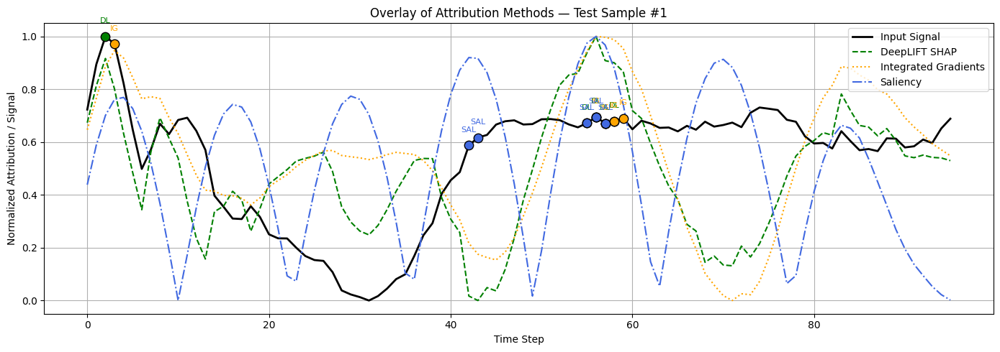

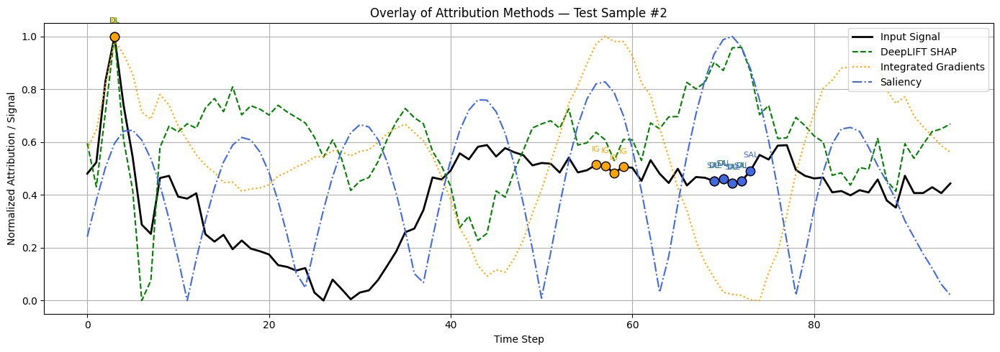

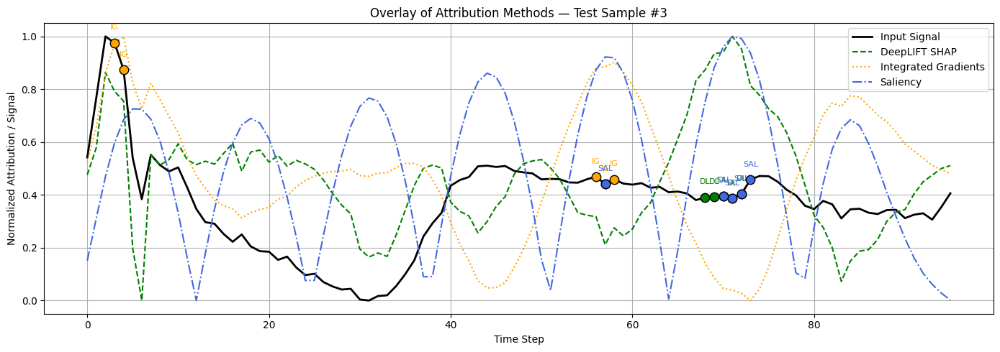

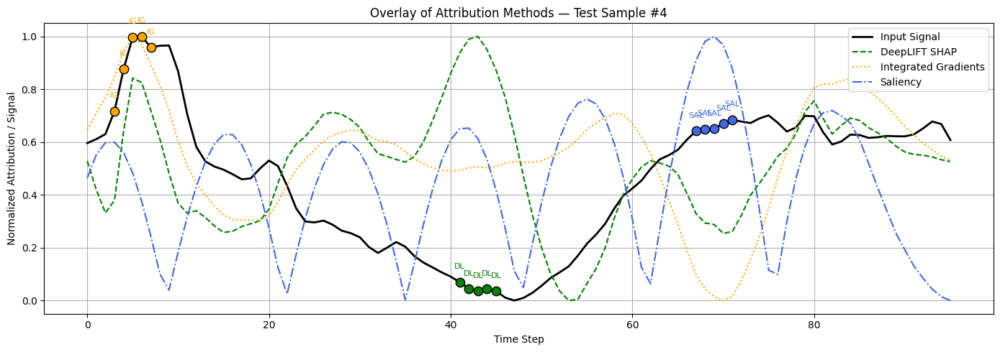

In [49]:


# ✅ Parameters
num_samples = 5  # Number of test samples to plot
top_k = 5        # Number of top spikes to annotate

# ✅ Normalization helper
def normalize_1d(x):
    return (x - x.min()) / (x.max() - x.min() + 1e-8)

# ✅ Loop through selected samples
for sample_idx in range(num_samples):
    input_signal = X_test_np[sample_idx]

    # Extract and normalize attributions
    dlshap_values = normalize_1d(dlshap_attr_np[sample_idx])
    ig_values = normalize_1d(ig_attr_np[sample_idx])
    saliency_values = normalize_1d(sal_attr_np[sample_idx])

    plt.figure(figsize=(14, 5))
    plt.plot(input_signal, label='Input Signal', color='black', linewidth=2)
    plt.plot(dlshap_values, label='DeepLIFT SHAP', linestyle='--', color='green')
    plt.plot(ig_values, label='Integrated Gradients', linestyle=':', color='orange')
    plt.plot(saliency_values, label='Saliency', linestyle='-.', color='royalblue')

    # Annotate top-k time steps per method
    def annotate_top_k(attribution, label, color):
        top_indices = np.argsort(-attribution)[:top_k]
        for i in top_indices:
            plt.scatter(i, input_signal[i], s=80, edgecolor='black', facecolor=color, zorder=5)
            plt.annotate(f"{label}", (i, input_signal[i] + 0.05), fontsize=8, color=color, ha='center')

    annotate_top_k(dlshap_values, "DL", "green")
    annotate_top_k(ig_values, "IG", "orange")
    annotate_top_k(saliency_values, "SAL", "royalblue")

    plt.title(f"Overlay of Attribution Methods — Test Sample #{sample_idx}")
    plt.xlabel("Time Step")
    plt.ylabel("Normalized Attribution / Signal")
    plt.legend(loc='upper right')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [50]:



def compute_fidelity_scores(wrapped_model, attributions_dict, X_test_tensor, X_test_np, device, top_k_ratio=0.1):
    """
    Compute R² fidelity scores across multiple XAI methods.

    Parameters:
    - wrapped_model: PyTorch model wrapped for attribution
    - attributions_dict: dict like {'IG': ig_attr_np, 'Saliency': sal_attr_np, 'DL': dlshap_attr_np}
    - X_test_tensor: original test input (tensor, shape [B, T, 1])
    - X_test_np: original test input (numpy, shape [B, T])
    - device: torch.device
    - top_k_ratio: proportion of top important features to mask (default = 10%)

    Returns:
    - fidelity_scores: dict of method name → R² score
    """

    fidelity_scores = {}

    for method_name, attr_np in attributions_dict.items():
        # Limit number of samples for safety
        num_samples = min(len(X_test_tensor), len(X_test_np), attr_np.shape[0])
        X_test_tensor_sub = X_test_tensor[:num_samples]
        X_test_np_sub = X_test_np[:num_samples]
        attr_np_sub = attr_np[:num_samples]

        # Get original predictions
        with torch.no_grad():
            original_preds = wrapped_model(X_test_tensor_sub.to(device)).cpu().numpy().flatten()

        # Determine top-k important time steps
        attr_importance = np.abs(attr_np_sub).mean(axis=0)
        top_k = int(top_k_ratio * len(attr_importance))
        important_indices = np.argsort(-attr_importance)[:top_k]

        # Perturb test set: replace top-k time steps with mean value
        X_test_modified = X_test_np_sub.copy()
        for i in important_indices:
            X_test_modified[:, i] = np.mean(X_test_np_sub[:, i])
        X_test_modified_tensor = torch.tensor(X_test_modified, dtype=torch.float32).unsqueeze(-1).to(device)

        # Get new predictions after feature replacement
        with torch.no_grad():
            new_preds = wrapped_model(X_test_modified_tensor).cpu().numpy().flatten()

        # Compute R² fidelity
        fidelity = r2_score(original_preds, new_preds)
        fidelity_scores[method_name] = fidelity

    return fidelity_scores


In [51]:
fidelity_scores = compute_fidelity_scores(
    wrapped_model=wrapped_model,
    attributions_dict={
        "DeepLIFT SHAP": dlshap_attr_np,
        "Integrated Gradients": ig_attr_np,
        "Saliency": sal_attr_np
    },
    X_test_tensor=X_test_tensor,
    X_test_np=X_test_np,
    device=device,
    top_k_ratio=0.1
)

print("🔍 Fidelity Scores (R²):")
for method, score in fidelity_scores.items():
    print(f"{method}: {score:.4f}")


🔍 Fidelity Scores (R²):
DeepLIFT SHAP: 0.6931
Integrated Gradients: 0.7396
Saliency: 0.7816


In [52]:


def plot_fidelity_scores(fidelity_scores, title="Fidelity Scores (R²)", save_path=None):
    """
    Plot a bar chart of R² fidelity scores across XAI methods.

    Parameters:
    - fidelity_scores: dict { method_name: score (float) }
    - title: str, plot title
    - save_path: str or None, path to save the plot if provided
    """

    methods = list(fidelity_scores.keys())
    scores = list(fidelity_scores.values())
    colors = ['green', 'orange', 'royalblue'][:len(scores)]  # Extend if needed

    plt.figure(figsize=(8, 5))
    bars = plt.bar(methods, scores, color=colors)

    # Annotate bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, height + 0.01,
                 f"{height:.4f}", ha='center', va='bottom', fontsize=10)

    plt.ylim(0, 1.05)
    plt.ylabel("Fidelity Score (R²)for ECG200", fontsize=12)
    plt.title(title, fontsize=14)
    plt.grid(axis='y', linestyle='--', alpha=0.6)

    if save_path:
        plt.tight_layout()
        plt.savefig(save_path, dpi=300)
        print(f"📊 Fidelity plot saved to {save_path}")

    plt.tight_layout()
    plt.show()


📊 Fidelity plot saved to results/fidelity_scores_barplot.png


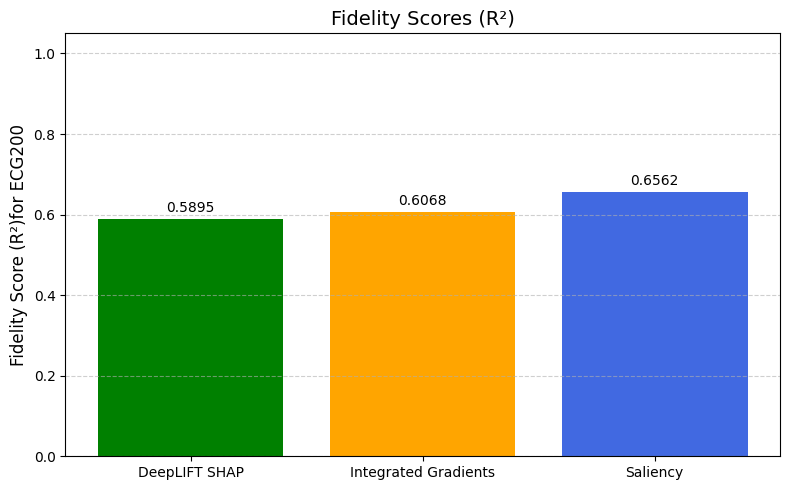

In [27]:
plot_fidelity_scores(fidelity_scores, save_path="results/fidelity_scores_barplot.png")

In [53]:
import numpy as np
import torch
from sklearn.metrics import r2_score
from collections import defaultdict
import warnings

def compute_fidelity_scores(wrapped_model, attributions_dict, X_test_tensor, X_test_np, device, top_k_ratio=0.1):
    """
    Compute R² fidelity scores across multiple XAI methods.

    Parameters:
    - wrapped_model: PyTorch model wrapped for attribution
    - attributions_dict: dict like {'IG': ig_attr_np, 'Saliency': sal_attr_np, 'DL': dlshap_attr_np}
    - X_test_tensor: original test input (tensor, shape [B, T, 1])
    - X_test_np: original test input (numpy, shape [B, T])
    - device: torch.device
    - top_k_ratio: proportion of top important features to mask (default = 10%)

    Returns:
    - fidelity_scores: dict of method name → R² score
    """

    fidelity_scores = {}

    for method_name, attr_np in attributions_dict.items():
        # Limit number of samples for safety
        num_samples = min(len(X_test_tensor), len(X_test_np), attr_np.shape[0])
        X_test_tensor_sub = X_test_tensor[:num_samples]
        X_test_np_sub = X_test_np[:num_samples]
        attr_np_sub = attr_np[:num_samples]

        # Get original predictions
        with torch.no_grad():
            original_preds = wrapped_model(X_test_tensor_sub.to(device)).cpu().numpy().flatten()

        # Determine top-k important time steps
        attr_importance = np.abs(attr_np_sub).mean(axis=0)
        top_k = max(1, int(top_k_ratio * len(attr_importance)))  # Ensure at least 1 feature
        important_indices = np.argsort(-attr_importance)[:top_k]

        # Perturb test set: replace top-k time steps with mean value
        X_test_modified = X_test_np_sub.copy()
        for i in important_indices:
            X_test_modified[:, i] = np.mean(X_test_np_sub[:, i])
        X_test_modified_tensor = torch.tensor(X_test_modified, dtype=torch.float32).unsqueeze(-1).to(device)

        # Get new predictions after feature replacement
        with torch.no_grad():
            new_preds = wrapped_model(X_test_modified_tensor).cpu().numpy().flatten()

        # Compute R² fidelity
        fidelity = r2_score(original_preds, new_preds)
        fidelity_scores[method_name] = fidelity

    return fidelity_scores

def run_multiple_fidelity_evaluations(wrapped_model, attributions_dict, X_test_tensor,
                                    X_test_np, device, num_runs=5, top_k_ratio=0.1,
                                    random_seed=42):
    """
    Execute fidelity evaluation multiple times and compute statistics.

    Parameters:
    - wrapped_model: PyTorch model wrapped for attribution
    - attributions_dict: dict of attribution arrays
    - X_test_tensor: test data as tensor
    - X_test_np: test data as numpy array
    - device: torch device
    - num_runs: number of evaluation runs (default=5)
    - top_k_ratio: proportion of features to mask
    - random_seed: seed for reproducibility

    Returns:
    - results_summary: dict containing mean, std, and individual run results
    """

    # Set random seed for reproducibility
    np.random.seed(random_seed)
    torch.manual_seed(random_seed)

    # Storage for results across runs
    all_runs_results = defaultdict(list)
    individual_run_details = []

    print(f"Starting {num_runs} fidelity evaluation runs...")
    print(f"Top-k masking ratio: {top_k_ratio:.1%}")
    print(f"Test samples: {len(X_test_tensor)}")
    print("-" * 50)

    for run_idx in range(num_runs):
        print(f"Executing run {run_idx + 1}/{num_runs}")

        try:
            # Compute fidelity scores for this run
            run_fidelity = compute_fidelity_scores(
                wrapped_model=wrapped_model,
                attributions_dict=attributions_dict,
                X_test_tensor=X_test_tensor,
                X_test_np=X_test_np,
                device=device,
                top_k_ratio=top_k_ratio
            )

            # Store results
            individual_run_details.append(run_fidelity)
            for method, score in run_fidelity.items():
                all_runs_results[method].append(score)

            # Display run results
            print(f"  Run {run_idx + 1} results:")
            for method, score in run_fidelity.items():
                print(f"    {method}: {score:.4f}")

        except Exception as e:
            print(f"  Error in run {run_idx + 1}: {str(e)}")
            warnings.warn(f"Run {run_idx + 1} failed: {str(e)}")
            continue

    # Compute summary statistics
    results_summary = {
        'mean_scores': {},
        'std_scores': {},
        'min_scores': {},
        'max_scores': {},
        'individual_runs': individual_run_details,
        'num_successful_runs': len(individual_run_details)
    }

    print("\n" + "=" * 50)
    print("FIDELITY EVALUATION SUMMARY")
    print("=" * 50)

    for method in all_runs_results.keys():
        scores = np.array(all_runs_results[method])

        results_summary['mean_scores'][method] = np.mean(scores)
        results_summary['std_scores'][method] = np.std(scores)
        results_summary['min_scores'][method] = np.min(scores)
        results_summary['max_scores'][method] = np.max(scores)

        print(f"\n{method} Method:")
        print(f"  Mean R²: {results_summary['mean_scores'][method]:.4f}")
        print(f"  Std Dev: {results_summary['std_scores'][method]:.4f}")
        print(f"  Range: [{results_summary['min_scores'][method]:.4f}, {results_summary['max_scores'][method]:.4f}]")
        print(f"  Individual runs: {[f'{s:.4f}' for s in scores]}")

    print(f"\nSuccessful runs: {results_summary['num_successful_runs']}/{num_runs}")

    return results_summary

def compare_method_performance(results_summary):
    """
    Analyze and rank method performance based on fidelity scores.

    Parameters:
    - results_summary: output from run_multiple_fidelity_evaluations

    Returns:
    - performance_ranking: list of methods ranked by mean fidelity score
    """

    methods_performance = []
    for method, mean_score in results_summary['mean_scores'].items():
        std_score = results_summary['std_scores'][method]
        methods_performance.append((method, mean_score, std_score))

    # Sort by mean fidelity score (descending)
    performance_ranking = sorted(methods_performance, key=lambda x: x[1], reverse=True)

    print("\n" + "=" * 50)
    print("METHOD PERFORMANCE RANKING")
    print("=" * 50)

    for rank, (method, mean_score, std_score) in enumerate(performance_ranking, 1):
        print(f"{rank}. {method}: {mean_score:.4f} (±{std_score:.4f})")

    return performance_ranking

# Example usage function
def execute_fidelity_analysis(wrapped_model, attributions_dict, X_test_tensor,
                            X_test_np, device, num_runs=5):
    """
    Complete fidelity analysis workflow.

    Parameters:
    - wrapped_model: trained model
    - attributions_dict: attribution results from different methods
    - X_test_tensor: test data (tensor format)
    - X_test_np: test data (numpy format)
    - device: computation device
    - num_runs: number of evaluation iterations

    Returns:
    - complete_results: comprehensive analysis results
    """

    # Execute multiple runs
    results_summary = run_multiple_fidelity_evaluations(
        wrapped_model=wrapped_model,
        attributions_dict=attributions_dict,
        X_test_tensor=X_test_tensor,
        X_test_np=X_test_np,
        device=device,
        num_runs=num_runs,
        top_k_ratio=0.1
    )

    # Analyze performance
    performance_ranking = compare_method_performance(results_summary)

    # Compile complete results
    complete_results = {
        'summary': results_summary,
        'ranking': performance_ranking,
        'evaluation_params': {
            'num_runs': num_runs,
            'top_k_ratio': 0.1,
            'num_test_samples': len(X_test_tensor)
        }
    }

    return complete_results



In [54]:
# Usage example:

# Assuming you have your model and data ready:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

#Your attribution methods results
attributions_dict = {
    'Integrated_Gradients': ig_attr_np,
    'Saliency_Maps':sal_attr_np,
    'DeepLIFT_SHAP': dlshap_attr_np
}

# Execute the analysis
results = execute_fidelity_analysis(
    wrapped_model=wrapped_model,
    attributions_dict=attributions_dict,
    X_test_tensor=X_test_tensor,
    X_test_np=X_test_np,
    device=device,
    num_runs=5
)


Starting 5 fidelity evaluation runs...
Top-k masking ratio: 10.0%
Test samples: 30
--------------------------------------------------
Executing run 1/5
  Run 1 results:
    Integrated_Gradients: 0.8044
    Saliency_Maps: 0.6669
    DeepLIFT_SHAP: 0.6384
Executing run 2/5
  Run 2 results:
    Integrated_Gradients: 0.7027
    Saliency_Maps: 0.7892
    DeepLIFT_SHAP: 0.6754
Executing run 3/5
  Run 3 results:
    Integrated_Gradients: 0.7503
    Saliency_Maps: 0.6160
    DeepLIFT_SHAP: 0.6358
Executing run 4/5
  Run 4 results:
    Integrated_Gradients: 0.6160
    Saliency_Maps: 0.7805
    DeepLIFT_SHAP: 0.3786
Executing run 5/5
  Run 5 results:
    Integrated_Gradients: 0.7010
    Saliency_Maps: 0.5961
    DeepLIFT_SHAP: 0.6098

FIDELITY EVALUATION SUMMARY

Integrated_Gradients Method:
  Mean R²: 0.7149
  Std Dev: 0.0623
  Range: [0.6160, 0.8044]
  Individual runs: ['0.8044', '0.7027', '0.7503', '0.6160', '0.7010']

Saliency_Maps Method:
  Mean R²: 0.6897
  Std Dev: 0.0811
  Range: [0.5961